# LIBRERÍAS

In [1]:
!pip install prophet
!pip install pmdarima
!pip install tabulate

In [2]:
import pandas as pd
import numpy as np
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import seaborn as sns
from prophet import Prophet
from sklearn.preprocessing import LabelEncoder
from datetime import datetime, timedelta
import statsmodels.api as sm
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import PowerTransformer
from scipy.stats import poisson
import datetime as dt
import matplotlib.pyplot as plt
import statsmodels as st
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.tsa.api import ExponentialSmoothing, SimpleExpSmoothing, Holt
import statsmodels.api as sm
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
import seaborn as sns
from tabulate import tabulate
import pmdarima as pm
from dateutil.relativedelta import relativedelta

c:\Users\---\AppData\Local\Programs\Python\Python312\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Importing plotly failed. Interactive plots will not work.


# IMPORTACIÓN DE BBDD Y CREACIÓN DE LA NUEVA

In [3]:
# Reemplaza 'ruta_del_archivo' con la ruta correcta de cada archivo CSV
TABLA_ACCIDENTES_VICTIMAS_2016 = 'TABLA_ACCIDENTES_VICTIMAS_2016.xlsx'
TABLA_ACCIDENTES_VICTIMAS_2017 = 'TABLA_ACCIDENTES_VICTIMAS_2017.xlsx'
TABLA_ACCIDENTES_VICTIMAS_2018 = 'TABLA_ACCIDENTES_VICTIMAS_2018.xlsx'
TABLA_ACCIDENTES_VICTIMAS_2019 = 'TABLA_ACCIDENTES_VICTIMAS_2019.xlsx'
TABLA_ACCIDENTES_VICTIMAS_2020 = 'TABLA_ACCIDENTES_VICTIMAS_2020.xlsx'
TABLA_ACCIDENTES_VICTIMAS_2021 = 'TABLA_ACCIDENTES_VICTIMAS_2021.xlsx'

# Cargar bases de datos
db16 = pd.read_excel(TABLA_ACCIDENTES_VICTIMAS_2016)
db17 = pd.read_excel(TABLA_ACCIDENTES_VICTIMAS_2017)
db18 = pd.read_excel(TABLA_ACCIDENTES_VICTIMAS_2018)
db19 = pd.read_excel(TABLA_ACCIDENTES_VICTIMAS_2019)
db20 = pd.read_excel(TABLA_ACCIDENTES_VICTIMAS_2020)
db21 = pd.read_excel(TABLA_ACCIDENTES_VICTIMAS_2021) #este será la bbdd que usaremos como validación del método,
#ya que son los datos más actuales de los que se tiene registro

CREACION DE LA NUEVA BBDD

In [4]:
db16.drop(['SECUENCIAL'], axis = 1, inplace = True)
db17.drop(['SECUENCIAL'], axis = 1, inplace = True)
db18.drop(['SECUENCIAL'], axis = 1, inplace = True)
db19.drop(['SECUENCIAL'], axis = 1, inplace = True)
db20.drop(['SECUENCIAL', 'TOT_VMP_MU24H', 'TOT_VMP_MU30DF'], axis = 1, inplace = True)
db21.drop(['ID_ACCIDENTE', 'TOT_VMP_MU30DF'], axis = 1, inplace = True)

In [5]:
# Concatenar DataFrames verticalmente (uno encima del otro)
db_combinadas = pd.concat([db16, db17, db18, db19, db20], ignore_index=True)

# Mostrar las primeras filas de la nueva base de datos combinada
print(db_combinadas.head())

# Guardar la nueva base de datos combinada en un archivo CSV
db_combinadas.to_csv('TABLA_ACCIDENTES_VICTIMAS_COMBINADAS.csv', index=False)

   ANYO  MES  DIA_SEMANA  HORA  COD_PROVINCIA  COD_MUNICIPIO  ISLA  ZONA  \
0  2016    3           4    16              1         1059.0   NaN     3   
1  2016    3           4    14              1         1059.0   NaN     3   
2  2016    3           4     7              1         1059.0   NaN     3   
3  2016    3           3    18              1         1059.0   NaN     3   
4  2016    3           2    20              1         1059.0   NaN     3   

   ZONA_AGRUPADA        CARRETERA  ...  PRIORI_OTRA  CONDICION_NIVEL_CIRCULA  \
0              2  No inventariada  ...          999                        6   
1              2  No inventariada  ...          999                        6   
2              2  No inventariada  ...          999                        6   
3              2  No inventariada  ...            1                        6   
4              2  No inventariada  ...            1                        6   

   CONDICION_FIRME  CONDICION_ILUMINACION  CONDICION_METEO  CO

# LIMPIEZA DE LA BBDD

In [6]:
# Mostrar las primeras filas
print(db_combinadas.head())

# Obtener información general
print(db_combinadas.info())

# Obtener estadísticas descriptivas
print(db_combinadas.describe())

   ANYO  MES  DIA_SEMANA  HORA  COD_PROVINCIA  COD_MUNICIPIO  ISLA  ZONA  \
0  2016    3           4    16              1         1059.0   NaN     3   
1  2016    3           4    14              1         1059.0   NaN     3   
2  2016    3           4     7              1         1059.0   NaN     3   
3  2016    3           3    18              1         1059.0   NaN     3   
4  2016    3           2    20              1         1059.0   NaN     3   

   ZONA_AGRUPADA        CARRETERA  ...  PRIORI_OTRA  CONDICION_NIVEL_CIRCULA  \
0              2  No inventariada  ...          999                        6   
1              2  No inventariada  ...          999                        6   
2              2  No inventariada  ...          999                        6   
3              2  No inventariada  ...            1                        6   
4              2  No inventariada  ...            1                        6   

   CONDICION_FIRME  CONDICION_ILUMINACION  CONDICION_METEO  CO

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 483933 entries, 0 to 483932
Data columns (total 71 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ANYO                      483933 non-null  int64  
 1   MES                       483933 non-null  int64  
 2   DIA_SEMANA                483933 non-null  int64  
 3   HORA                      483933 non-null  int64  
 4   COD_PROVINCIA             483933 non-null  int64  
 5   COD_MUNICIPIO             481725 non-null  float64
 6   ISLA                      31962 non-null   float64
 7   ZONA                      483933 non-null  int64  
 8   ZONA_AGRUPADA             483933 non-null  int64  
 9   CARRETERA                 483933 non-null  object 
 10  KM                        211810 non-null  float64
 11  SENTIDO_1F                483933 non-null  int64  
 12  TITULARIDAD_VIA           483933 non-null  int64  
 13  TIPO_VIA                  483848 non-null  f

In [7]:
list(db_combinadas['CARRETERA'].unique())

['No inventariada',
 'AP-68',
 'N-622',
 'A-1',
 'N-240',
 'AP-1',
 'N-104',
 'N-124',
 'N-102',
 'A-31',
 'N-322',
 'CM-332',
 'CV',
 'CM-3203',
 'N-430',
 'AB-518',
 'S/D',
 'AB-503',
 'AB-500',
 'N-430a',
 'CM-3201',
 'N-330',
 'A-35',
 'CM-412',
 'CV-S/N',
 'CAMINO ASF',
 'CM-3205',
 'CM-3216',
 'CM-3133',
 'AB-212',
 'N-344',
 'AB-303',
 'CM-3211',
 'S/N',
 'AB-218',
 'CM-3217',
 'CM-316',
 'CM-412a',
 'CM-3218',
 'AB-203',
 'CM-220',
 'N-301',
 'CM-313',
 'CM-3212',
 'AB-404',
 'AB-4003',
 'CV/SD',
 'AB-402',
 'AB-4001',
 'A-30',
 'AB-216',
 'AB-219',
 'AB-204',
 'CM-3225',
 'AB-608',
 'AB-400',
 'CM-3226',
 'AB-5016',
 'CM-3209',
 'AB-611',
 'AB-703',
 'AB-613',
 'AB-505',
 'CM-3204',
 'C.V.',
 'CM-3121',
 'AB-100',
 'SAN ISIDRO',
 'CV/SNS',
 'AB-519',
 'CV/SN',
 'CM-3114',
 'A-43',
 'AB-706',
 'N-310',
 'AB-512',
 'CV-700',
 'CV-820',
 'LA MATETA',
 'CV-827',
 'CV-1734',
 'CV-826',
 'C. NEGRET',
 'LA SEÑORET',
 'CV-775',
 'A-7',
 'CAM. VIEJO',
 'N-340',
 'CV-873',
 'CAMINO',
 '

In [8]:
pd.Series(db_combinadas['CARRETERA'].value_counts()).to_csv('CARRETERAS_UNICAS.csv')

Tenemos un total de 573795 datos. Se va a dar una tolerancia del 10% (es decir, puedes tener hasta 516415 datos no nulos) de datos vacíos para simplemente eliminarlos, en caso contrario, se implementarán diferentes estrategias para el llenado de los mismos.
"Sequential" se va a descartar, dado que se trata del índice de la bbdd.
"Isla" se va a descartar como variable porque no hay suficiente información al respecto para determinar adecuadamente con qué llenar adecuadamente los datos vacíos.
Para trabajar con la variable "km" se hará una agrupación por provincias para llenar ese dato con el km donde ocurren más accidentes, es decir, la moda.
"nudo_info" lo mismo que con km.
"carretera_cruce" se va a eliminar, dado que no hay información suficiente y parece ser información muy específica.
"condicion_niebla" y "condicion_viento" se llenará con el promedio por zona y por fecha.


In [9]:
# Identificar columnas con valores nulos y contar el número de nulos por columna
columnas_con_nulos = db_combinadas.columns[db_combinadas.isnull().any()]
num_nulos_por_columna = db_combinadas[columnas_con_nulos].isnull().sum()

# Crear un DataFrame con columnas y el número de nulos por columna
info_nulos = pd.DataFrame({'Columnas con Nulos': columnas_con_nulos, 'Num Nulos': num_nulos_por_columna})

# Mostrar el DataFrame con información sobre los nulos
print("\nInformación sobre Nulos:")
print(info_nulos)


Información sobre Nulos:
                 Columnas con Nulos  Num Nulos
COD_MUNICIPIO         COD_MUNICIPIO       2208
ISLA                           ISLA     451971
KM                               KM     272123
TIPO_VIA                   TIPO_VIA         85
NUDO                           NUDO        290
NUDO_INFO                 NUDO_INFO     293695
CARRETERA_CRUCE     CARRETERA_CRUCE     470674
CONDICION_NIEBLA   CONDICION_NIEBLA     450189
CONDICION_VIENTO   CONDICION_VIENTO     480730


In [10]:
# Lista de columnas a eliminar
columnas_a_eliminar = ['ISLA', 'KM', 'NUDO_INFO', 'CARRETERA_CRUCE']
#para variables como niebla o viento hacer la media y ponerla en los datos vacíos
# Eliminar las columnas especificadas
df = db_combinadas.drop(columnas_a_eliminar, axis=1)

In [11]:
# Identificar columnas con valores nulos y contar el número de nulos por columna
columnas_con_nulos = df.columns[df.isnull().any()]
num_nulos_por_columna = df[columnas_con_nulos].isnull().sum()

# Crear un DataFrame con columnas y el número de nulos por columna
info_nulos = pd.DataFrame({'Columnas con Nulos': columnas_con_nulos, 'Num Nulos': num_nulos_por_columna})

# Mostrar el DataFrame con información sobre los nulos
print("\nInformación sobre Nulos:")
print(info_nulos)


Información sobre Nulos:
                 Columnas con Nulos  Num Nulos
COD_MUNICIPIO         COD_MUNICIPIO       2208
TIPO_VIA                   TIPO_VIA         85
NUDO                           NUDO        290
CONDICION_NIEBLA   CONDICION_NIEBLA     450189
CONDICION_VIENTO   CONDICION_VIENTO     480730


No se ha eliminado condicion_niebla y condicion_viento porque son variables que, aunque haya muchos datos nulos, pueden aportar información valiosa para nuestros resultados, dado que son condiciones meteorológicas que pueden afectar gravemente a un accidente de tráfico.

In [12]:
df['CONDICION_VIENTO'].describe()

count    3203.0
mean        1.0
std         0.0
min         1.0
25%         1.0
50%         1.0
75%         1.0
max         1.0
Name: CONDICION_VIENTO, dtype: float64

  Vamos a suponer que 0 hace referencia a cuando no hay viento, mientras que 1 es cuando hace viento. En todos los casos de accidentes registrados, se da la condición 1, es decir, en el lugar del accidente había mucho viento y los datos nulos serán llenados con 0. Lo IDEAL EN ESTOS CASOS ES TRABAJAR JUNTO CON LOS DATA ENFENEER O INGENIEROS de datos para conocer como dse creó esa variable en la bbdd.

In [13]:
df['CONDICION_VIENTO'].fillna(0, inplace = True)

C:\Users\---\AppData\Local\Temp\ipykernel_20316\1088846255.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['CONDICION_VIENTO'].fillna(0, inplace = True)


In [14]:
df['CONDICION_NIEBLA'].describe()

count    33744.000000
mean         1.019974
std          0.139913
min          1.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          2.000000
Name: CONDICION_NIEBLA, dtype: float64

0
674


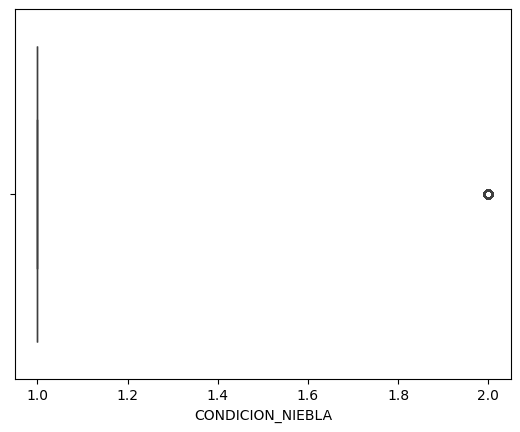

In [15]:
sns.boxplot(data = df, x = 'CONDICION_NIEBLA')
print(len(df[df['CONDICION_NIEBLA'] < 1]))
print(len(df[df['CONDICION_NIEBLA'] > 1]))

Vamos a tener en cuenta lo mismo que con el viento, es decir, que había niebla cuando se dieron los accidentes.

In [16]:
df['CONDICION_NIEBLA'].fillna(0, inplace = True)

C:\Users\---\AppData\Local\Temp\ipykernel_20316\3816337909.py:1: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  df['CONDICION_NIEBLA'].fillna(0, inplace = True)


In [17]:
df.dropna(inplace = True)

In [18]:
df.describe()

,ANYO,MES,DIA_SEMANA,HORA,COD_PROVINCIA,COD_MUNICIPIO,ZONA,ZONA_AGRUPADA,SENTIDO_1F,TITULARIDAD_VIA,...,PRIORI_OTRA,CONDICION_NIVEL_CIRCULA,CONDICION_FIRME,CONDICION_ILUMINACION,CONDICION_METEO,CONDICION_NIEBLA,CONDICION_VIENTO,VISIB_RESTRINGIDA_POR,ACERA,TRAZADO_PLANTA
count,481350.000000,481350.000000,481350.000000,481350.000000,481350.000000,481350.000000,481350.000000,481350.000000,481350.000000,481350.000000,...,481350.000000,481350.000000,481350.00000,481350.000000,481350.000000,481350.000000,481350.000000,481350.000000,481350.000000,481350.000000
mean,2017.890252,6.570699,3.865518,13.887047,23.226955,20283.337787,2.267095,1.638832,3.304907,3.378577,...,651.045794,159.620738,1.58964,2.102715,66.289187,0.071503,0.006654,119.004789,910.932448,618.727369
std,1.361707,3.425031,1.935025,5.274615,14.190114,15246.607092,0.962904,0.480339,1.139958,1.082246,...,475.896472,362.529116,5.96771,13.947410,245.934881,0.263042,0.081302,313.591756,281.177691,483.607326
min,2016.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,1.000000,1.000000,...,0.000000,1.000000,1.00000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,2017.000000,4.000000,2.000000,10.000000,8.000000,8019.000000,1.000000,1.000000,2.000000,3.000000,...,0.000000,1.000000,1.00000,1.000000,1.000000,0.000000,0.000000,1.000000,998.000000,2.000000
50%,2018.000000,7.000000,4.000000,14.000000,27.000000,18122.000000,3.000000,2.000000,4.000000,4.000000,...,999.000000,3.000000,1.00000,1.000000,1.000000,0.000000,0.000000,1.000000,998.000000,998.000000
75%,2019.000000,10.000000,5.000000,18.000000,33.000000,30030.000000,3.000000,2.000000,4.000000,4.000000,...,999.000000,6.000000,1.00000,3.000000,1.000000,0.000000,0.000000,18.000000,998.000000,998.000000
max,2020.000000,12.000000,7.000000,23.000000,52.000000,52001.000000,4.000000,2.000000,4.000000,5.000000,...,999.000000,999.000000,999.00000,999.000000,999.000000,2.000000,1.000000,999.000000,999.000000,998.000000


In [19]:
df.reset_index(drop = True)

,ANYO,MES,DIA_SEMANA,HORA,COD_PROVINCIA,COD_MUNICIPIO,ZONA,ZONA_AGRUPADA,CARRETERA,SENTIDO_1F,...,PRIORI_OTRA,CONDICION_NIVEL_CIRCULA,CONDICION_FIRME,CONDICION_ILUMINACION,CONDICION_METEO,CONDICION_NIEBLA,CONDICION_VIENTO,VISIB_RESTRINGIDA_POR,ACERA,TRAZADO_PLANTA
0,2016,3,4,16,1,1059.0,3,2,No inventariada,4,...,999,6,9,1,7,0.0,0.0,18,998,998
1,2016,3,4,14,1,1059.0,3,2,No inventariada,4,...,999,6,9,1,7,0.0,0.0,18,999,998
2,2016,3,4,7,1,1059.0,3,2,No inventariada,4,...,999,6,9,4,7,0.0,0.0,18,998,998
3,2016,3,3,18,1,1059.0,3,2,No inventariada,4,...,1,6,9,1,7,0.0,0.0,18,998,998
4,2016,3,2,20,1,1059.0,3,2,No inventariada,4,...,1,6,9,4,7,0.0,0.0,18,998,998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
481345,2020,12,1,15,52,52001.0,3,2,No inventariada,4,...,999,1,1,1,1,0.0,0.0,1,998,998
481346,2020,12,4,9,52,52001.0,3,2,No inventariada,4,...,0,1,1,1,1,0.0,0.0,1,4,998
481347,2020,12,5,17,52,52001.0,3,2,No inventariada,4,...,999,2,1,2,1,0.0,0.0,1,4,998
481348,2020,12,4,21,52,52001.0,3,2,No inventariada,4,...,999,3,1,4,1,0.0,0.0,1,4,998


De acuerdo con el objetivo de este trabajo, en las bbdd trabajadas anteriormente se encuentran varias variables que podemos usar como target u variable objetivo. Haciendo un análisis del significado de cada una de ellas, la que mejor se amolda es 'TOTAL_VICTIMAS_24H', la cual nos dice el número de heridos hospitalizados, heridos no hospitalizados y victimas mortales durante el accidente.

ANÁLISIS DE VARIABLES

Para poder trabajar todas las variables dentro de un modelo, necesitamos que estas estén categorizadas. 
En particular, durante este trabajo se les van a dar un orden de acuerdo al análisis de bivariados para de esta
 manera mejorar la correlación de la variable de interes con la objetivo.

In [20]:
len(list(df['CARRETERA'].unique())) #como son 10738 valores únicos para la variable carretera,
#vamos a aprovechar el label encoder de sklearn

10738

In [21]:
enc_car = LabelEncoder()
df['CARRETERA'] = enc_car.fit_transform(df['CARRETERA'])
df.describe()

,ANYO,MES,DIA_SEMANA,HORA,COD_PROVINCIA,COD_MUNICIPIO,ZONA,ZONA_AGRUPADA,CARRETERA,SENTIDO_1F,...,PRIORI_OTRA,CONDICION_NIVEL_CIRCULA,CONDICION_FIRME,CONDICION_ILUMINACION,CONDICION_METEO,CONDICION_NIEBLA,CONDICION_VIENTO,VISIB_RESTRINGIDA_POR,ACERA,TRAZADO_PLANTA
count,481350.000000,481350.000000,481350.000000,481350.000000,481350.000000,481350.000000,481350.000000,481350.000000,481350.000000,481350.000000,...,481350.000000,481350.000000,481350.00000,481350.000000,481350.000000,481350.000000,481350.000000,481350.000000,481350.000000,481350.000000
mean,2017.890252,6.570699,3.865518,13.887047,23.226955,20283.337787,2.267095,1.638832,7139.661554,3.304907,...,651.045794,159.620738,1.58964,2.102715,66.289187,0.071503,0.006654,119.004789,910.932448,618.727369
std,1.361707,3.425031,1.935025,5.274615,14.190114,15246.607092,0.962904,0.480339,2860.231924,1.139958,...,475.896472,362.529116,5.96771,13.947410,245.934881,0.263042,0.081302,313.591756,281.177691,483.607326
min,2016.000000,1.000000,1.000000,0.000000,1.000000,0.000000,1.000000,1.000000,0.000000,1.000000,...,0.000000,1.000000,1.00000,1.000000,1.000000,0.000000,0.000000,1.000000,1.000000,1.000000
25%,2017.000000,4.000000,2.000000,10.000000,8.000000,8019.000000,1.000000,1.000000,7786.000000,2.000000,...,0.000000,1.000000,1.00000,1.000000,1.000000,0.000000,0.000000,1.000000,998.000000,2.000000
50%,2018.000000,7.000000,4.000000,14.000000,27.000000,18122.000000,3.000000,2.000000,8617.000000,4.000000,...,999.000000,3.000000,1.00000,1.000000,1.000000,0.000000,0.000000,1.000000,998.000000,998.000000
75%,2019.000000,10.000000,5.000000,18.000000,33.000000,30030.000000,3.000000,2.000000,8617.000000,4.000000,...,999.000000,6.000000,1.00000,3.000000,1.000000,0.000000,0.000000,18.000000,998.000000,998.000000
max,2020.000000,12.000000,7.000000,23.000000,52.000000,52001.000000,4.000000,2.000000,10737.000000,4.000000,...,999.000000,999.000000,999.00000,999.000000,999.000000,2.000000,1.000000,999.000000,999.000000,998.000000


MATRIZ DE CORRELACION

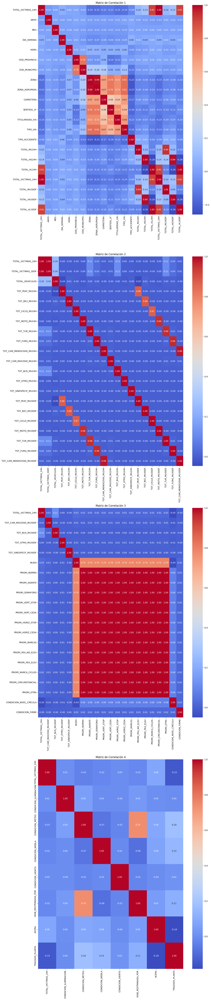

In [22]:
subset_1 = pd.concat([df['TOTAL_VICTIMAS_24H'],df.iloc[:, :20]],axis=1)
subset_2 = pd.concat([df['TOTAL_VICTIMAS_24H'],df.iloc[:, 20:40]],axis=1)
subset_3 = pd.concat([df['TOTAL_VICTIMAS_24H'],df.iloc[:, 40:60]],axis=1)
subset_4 = pd.concat([df['TOTAL_VICTIMAS_24H'],df.iloc[:, 60:68]],axis=1)
#subset_5 = pd.concat([df['TOTAL_VICTIMAS_24H'],df.iloc[:, 80:103]],axis=1)


# Calcular las matrices de correlación para cada conjunto
correlation_matrix_1 = subset_1.corr()
correlation_matrix_2 = subset_2.corr()
correlation_matrix_3 = subset_3.corr()
correlation_matrix_4 = subset_4.corr()
#correlation_matrix_5 = subset_5.corr()

# Visualizar las matrices de correlación
fig, axes = plt.subplots(4, 1, figsize=(15, 80))

sns.heatmap(correlation_matrix_1, cmap='coolwarm', annot=True, fmt=".2f", ax=axes[0])
axes[0].set_title('Matriz de Correlación 1')

sns.heatmap(correlation_matrix_2, cmap='coolwarm', annot=True, fmt=".2f", ax=axes[1])
axes[1].set_title('Matriz de Correlación 2')

sns.heatmap(correlation_matrix_3, cmap='coolwarm', annot=True, fmt=".2f", ax=axes[2])
axes[2].set_title('Matriz de Correlación 3')

sns.heatmap(correlation_matrix_4, cmap='coolwarm', annot=True, fmt=".2f", ax=axes[3])
axes[3].set_title('Matriz de Correlación 4')

#sns.heatmap(correlation_matrix_5, cmap='coolwarm', annot=True, fmt=".2f", ax=axes[4])
#axes[4].set_title('Matriz de Correlación 5')

plt.show()

In [23]:
#vamos a eliminar todas las variables tipo priori, dado que, como podemos observar en la matriz de correlación, están muy correlacionadas entre sí.
#Además, analizando su significado dentro de la bbdd, se puede ver que no tiene relevancia para nuestro modelo predictivo, ya que solo considera
#el responsable del accidente de acuerdo a diversos factores.
# Lista de columnas a eliminar
columnas_a_eliminar = ['PRIORI_NORMA', 'PRIORI_AGENTE', 'PRIORI_SEMAFORO', 'PRIORI_VERT_STOP', 'PRIORI_VERT_CEDA', 'PRIORI_HORIZ_STOP', 'PRIORI_HORIZ_CEDA', 'PRIORI_MARCAS', 'PRIORI_PEA_NO_ELEV', 'PRIORI_PEA_ELEV', 'PRIORI_MARCA_CICLOS', 'PRIORI_CIRCUNSTANCIAL', 'PRIORI_OTRA']
#para variables como niebla o viento hacer la media y ponerla en los datos vacíos
# Eliminar las columnas especificadas
df = df.drop(columnas_a_eliminar, axis=1)

In [24]:
#vamos a eliminar TOTAL_HL24H y TOTAL_HL30DF ya que tienen una correlación de 0,91, es decir, demasiado alta con la variable objetivo
# Lista de columnas a eliminar
columnas_a_eliminar = ['TOTAL_HL24H', 'TOTAL_HL30DF']
#para variables como niebla o viento hacer la media y ponerla en los datos vacíos
# Eliminar las columnas especificadas
df = df.drop(columnas_a_eliminar, axis=1)

In [25]:
features = list(df.columns)
features.remove('TOTAL_VICTIMAS_24H')
print(features)

['ANYO', 'MES', 'DIA_SEMANA', 'HORA', 'COD_PROVINCIA', 'COD_MUNICIPIO', 'ZONA', 'ZONA_AGRUPADA', 'CARRETERA', 'SENTIDO_1F', 'TITULARIDAD_VIA', 'TIPO_VIA', 'TIPO_ACCIDENTE', 'TOTAL_MU24H', 'TOTAL_HG24H', 'TOTAL_MU30DF', 'TOTAL_HG30DF', 'TOTAL_VICTIMAS_30DF', 'TOTAL_VEHICULOS', 'TOT_PEAT_MU24H', 'TOT_BICI_MU24H', 'TOT_CICLO_MU24H', 'TOT_MOTO_MU24H', 'TOT_TUR_MU24H', 'TOT_FURG_MU24H', 'TOT_CAM_MENOS3500_MU24H', 'TOT_CAM_MAS3500_MU24H', 'TOT_BUS_MU24H', 'TOT_OTRO_MU24H', 'TOT_SINESPECIF_MU24H', 'TOT_PEAT_MU30DF', 'TOT_BICI_MU30DF', 'TOT_CICLO_MU30DF', 'TOT_MOTO_MU30DF', 'TOT_TUR_MU30DF', 'TOT_FURG_MU30DF', 'TOT_CAM_MENOS3500_MU30DF', 'TOT_CAM_MAS3500_MU30DF', 'TOT_BUS_MU30DF', 'TOT_OTRO_MU30DF', 'TOT_SINESPECIF_MU30DF', 'NUDO', 'CONDICION_NIVEL_CIRCULA', 'CONDICION_FIRME', 'CONDICION_ILUMINACION', 'CONDICION_METEO', 'CONDICION_NIEBLA', 'CONDICION_VIENTO', 'VISIB_RESTRINGIDA_POR', 'ACERA', 'TRAZADO_PLANTA']


C:\Users\---\AppData\Local\Temp\ipykernel_20316\1994944297.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[col])  #using seaborn to plot


C:\Users\---\AppData\Local\Temp\ipykernel_20316\1994944297.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[col])  #using seaborn to plot
C:\Users\---\AppData\Local\Temp\ipykernel_20316\1994944297.py:8: UserWarning: 

`distplot` is a deprecated function and will be removed in seaborn v0.14.0.

Please adapt your code to use either `displot` (a figure-level function with
similar flexibility) or `histplot` (an axes-level function for histograms).

For a guide to updating your code to use the new functions, please see
https://gist.github.com/mwaskom/de44147ed2974457ad6372750bbe5751

  sns.distplot(df[col])  #using seaborn to plot
C:\Users

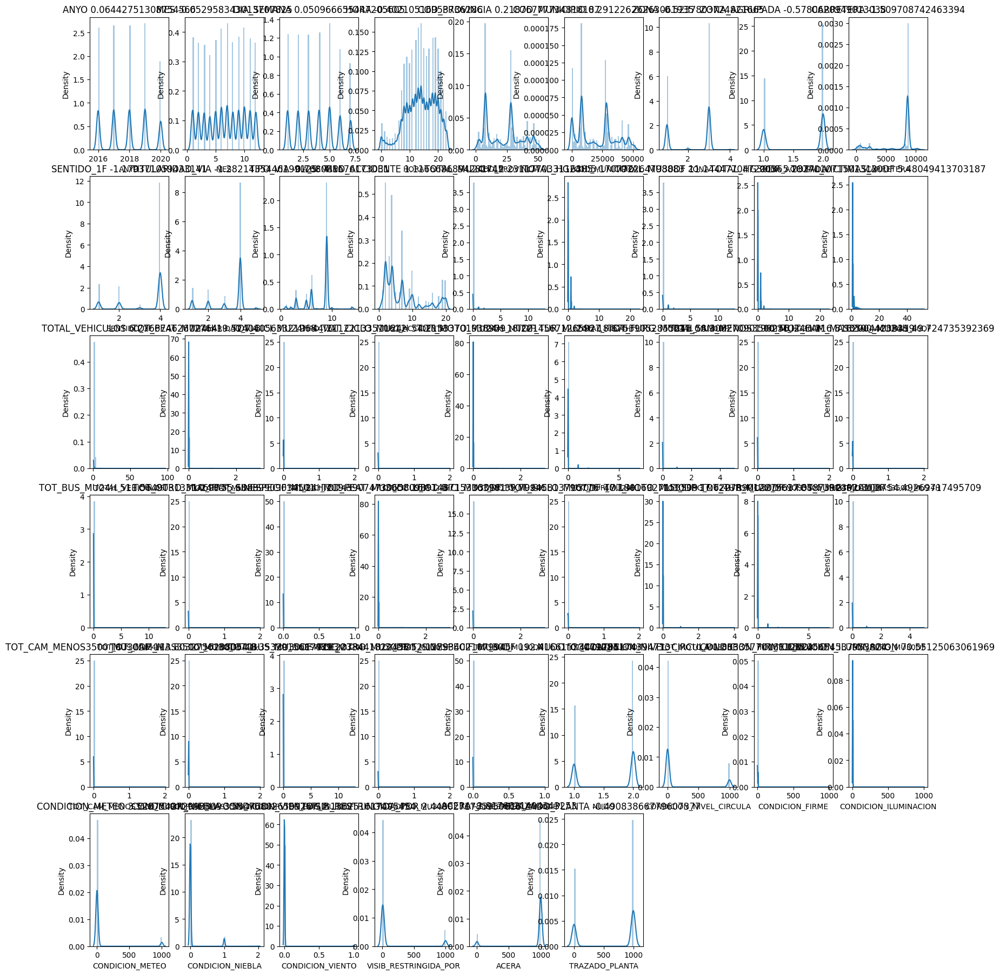

In [26]:
# Plotting the distribution of the variables (skewness) of all the columns
k=0
plt.figure(figsize=(20,30))

for col in features :
    k=k+1
    plt.subplot(8, 9,k)
    sns.distplot(df[col])  #using seaborn to plot
    plt.title(col+' '+str(df[col].skew()))

ANALISIS DE LA VARIABLE TEMPORAL

De acuerdo con la base de datos, la parte temporal se divide en año, mes y día de la semana. El último, toma valores del 1 al 7, es decir, de lunes a domingo. Sin embargo, no se especifica de qué semana se trata. Por tanto, el análisis que se puede hacer a partir de esta bbdd es mensual.

Al agrupar simplemente por año, mes y dia_semana, perdemos información acerca de las condiciones particulares de cada municipio. El objetivo de este proyecto es mandar la información más fidedigna posible a usuarios, servicios de seguridad y personal sanitario, por lo que decir que todas las condicionesde distintos municipios del país es en promedio la misma, implica una pérdida de información. Por como está construída la bbdd no se tiene la seguridad de cómo se condificaron los códigos de municipio, por lo que se descartará la opción de analizar los accidentes ocurridos en los municipios y se tomará mejor por provincia, asumiento que el código de provincia hace referencia al código postal.  

Se puede evidenciar que las series temporales no constituyen un método efectivo para la realización de predicciones de accidentes automovilísticos, dado que las gráficas para cada provincia resultan iguales entre sí, ya que, no hay patrones que puedan ser detectados por esta técnica. En consecuencia, optaremos por emplear técnicas de aprendizaje automático para llevar a cabo la predicción.

Eliminar la variable año y nos quedamos con mes  dia y hora.
Para tratar mas facil con los datos se puede agrupar las provincias en funcion del numero de accidentes que hay en ellas

In [27]:
#vamos a eliminar las columnas con una correlación muy alta y muy baja y ANYO, dado que no nos interesa un año en particular 
#sino el mes y el día.
columnas_a_eliminar = ['TOTAL_VICTIMAS_30DF', 'TOT_PEAT_MU24H', 'TOT_BICI_MU24H', 'TOT_CICLO_MU24H', 'TOT_MOTO_MU24H', 'TOT_OTRO_MU24H', 'TOT_SINESPECIF_MU24H', 'TOT_PEAT_MU30DF', 'TOT_BICI_MU30DF', 'TOT_CICLO_MU30DF', 'TOT_MOTO_MU30DF', 'TOT_OTRO_MU30DF', 'TOT_SINESPECIF_MU30DF', 'CONDICION_FIRME', 'CONDICION_VIENTO']
#para variables como niebla o viento hacer la media y ponerla en los datos vacíos
# Eliminar las columnas especificadas
df = df.drop(columnas_a_eliminar, axis=1)

La correlación entre provincias y el número de víctimas en 24 horas es alta. Si se intentara hacer una agrupación de acuerdo al número de víctimas, se estaría perdiendo algo de información, ya que, aunque sea poco, sí varía de provincia en provincia.

Hay que tener en cuenta que nuestra variable objetivo es una variable que indica el número de víctimas y no si ocurrió o no un accidente, por lo que, no estamos hablando de un modelo de clasificación, sino de uno tiop regresión lineal. En este tipo de modelos se recomienda que los datos estén tanto normalizados como escalados (que no tengan unidades para poder sumarlos).

Debido a los malos resultados observados, un siguiente paso para tratar de mejorar es transformar y escalar los datos

De acuerdo con las gráficas y los modelos anteriores, esta aproximación de modelos no funcionó para describir las víctimas en accidentes en 24h, por lo que se va a tomar un enfoque de clasificación tomando como variable objetivo una variable cualitativa a construir. Esta se definirá como muchas, moderadas y pocas víctimas.

# NUEVA FORMA DEFINITIVA

El objetivo del trabajo es determinar la probabilidad de que ocurra un accidente en cierta fecha del año hablando de año, mes y día de la semana. Para poder cumplir este objetivo, necesitamos una forma de inferir la probabilidad en estos casos, la cual se va a definir como: numero de accidentes entre numero de viajes totales.
Nótese que para poder hacer este análisis estadístico, no se cuenta con los datos de movilidad de españa posteriores al 2014 al momento de realizar este trabajo, ya que no saldrán hasta mayo de 2024. Por tanto, se trabajarán con los datos de 2015 a 2019 existentes, los cuales nos indican los viajes promedio por día, en determinado mes del año. A continuación analizaremos esos mismos datos

Asignar a cada valor de la variable carretera (bbdd antes de la limpieza) una bbdd que se correspondan con la movilidad en dicha carretera. https://www.epdata.es/datos/trafico-autopistas-peaje-imd/107
es decir, buscar a que carretera se corresponde cada bbdd para despues crear una nueva variable que sea el numero de viajes por carretera

## MOVILIDAD TODA ESPAÑA

'promedio_diario' es como se va a llamar la bbdd  donde se incuye la evolucion del trafico en toda españa

In [28]:
promedio_diario = pd.read_csv('evolucion_del_trafico_medio_en_las_autopistas_estatales_de_peaje_en_españa.csv', sep = ';')

In [29]:
promedio_diario

,Año,Periodo,Intensidad media diaria de vehículos
0,2015,Enero,13085.0
1,2015,Febrero,13858.0
2,2015,Marzo,15180.0
3,2015,Abril,17544.0
4,2015,Mayo,16922.0
...,...,...,...
69,NaN,NaN,NaN
70,NaN,NaN,NaN
71,"Url:""https://www.epdata.es/evolucion/1997e29e-...",NaN,NaN
72,"Titulo:""Evolución del tráfico medio en las aut...",NaN,NaN


In [30]:
promedio_diario.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 74 entries, 0 to 73
Data columns (total 3 columns):
 #   Column                                Non-Null Count  Dtype  
---  ------                                --------------  -----  
 0   Año                                   70 non-null     object 
 1   Periodo                               60 non-null     object 
 2   Intensidad media diaria de vehículos  60 non-null     float64
dtypes: float64(1), object(2)
memory usage: 1.9+ KB


In [31]:
promedio_diario.drop(promedio_diario[promedio_diario['Año'] == '2015'].index, inplace = True)

In [32]:
promedio_diario.dropna(inplace = True)

In [33]:
promedio_diario

,Año,Periodo,Intensidad media diaria de vehículos
12,2016,Enero,13959.0
13,2016,Febrero,14855.0
14,2016,Marzo,17717.0
15,2016,Abril,16462.0
16,2016,Mayo,17503.0
17,2016,Junio,18907.0
18,2016,Julio,24691.0
19,2016,Agosto,26511.0
20,2016,Septiembre,19320.0
21,2016,Octubre,17426.0


A partir de aqui, vamos a analizar la probabilidad de accidente para cada año, y así poder determinar el mejor modelo.

In [34]:
accidentes_2016 = df[df['ANYO'] == 2016][['MES', 'TOTAL_VICTIMAS_24H']].groupby('MES').mean()
promedio_diario_2016 = promedio_diario[promedio_diario['Año'] == '2016']

probabilidades_2016 = pd.concat([accidentes_2016.reset_index(drop = True), promedio_diario_2016.reset_index(drop = True)], axis = 1)

probabilidades_2016['probabilidad_accidente'] = probabilidades_2016['TOTAL_VICTIMAS_24H']/probabilidades_2016['Intensidad media diaria de vehículos']
probabilidades_2016

,TOTAL_VICTIMAS_24H,Año,Periodo,Intensidad media diaria de vehículos,probabilidad_accidente
0,1.395093,2016,Enero,13959.0,0.000100
1,1.361481,2016,Febrero,14855.0,0.000092
2,1.397239,2016,Marzo,17717.0,0.000079
3,1.364635,2016,Abril,16462.0,0.000083
4,1.376219,2016,Mayo,17503.0,0.000079
5,1.377920,2016,Junio,18907.0,0.000073
6,1.408334,2016,Julio,24691.0,0.000057
7,1.443389,2016,Agosto,26511.0,0.000054
8,1.378949,2016,Septiembre,19320.0,0.000071
9,1.374114,2016,Octubre,17426.0,0.000079


In [35]:
accidentes_2017 = df[df['ANYO'] == 2017][['MES', 'TOTAL_VICTIMAS_24H']].groupby('MES').mean()
promedio_diario_2017 = promedio_diario[promedio_diario['Año'] == '2017']

probabilidades_2017 = pd.concat([accidentes_2017.reset_index(drop = True), promedio_diario_2017.reset_index(drop = True)], axis = 1)

probabilidades_2017['probabilidad_accidente'] = probabilidades_2017['TOTAL_VICTIMAS_24H']/probabilidades_2017['Intensidad media diaria de vehículos']
probabilidades_2017

,TOTAL_VICTIMAS_24H,Año,Periodo,Intensidad media diaria de vehículos,probabilidad_accidente
0,1.372571,2017,Enero,14554.0,0.000094
1,1.368272,2017,Febrero,15641.0,0.000087
2,1.347167,2017,Marzo,16633.0,0.000081
3,1.398440,2017,Abril,20252.0,0.000069
4,1.359327,2017,Mayo,18262.0,0.000074
5,1.372493,2017,Junio,20116.0,0.000068
6,1.401183,2017,Julio,25129.0,0.000056
7,1.436396,2017,Agosto,26909.0,0.000053
8,1.409987,2017,Septiembre,20254.0,0.000070
9,1.347282,2017,Octubre,18210.0,0.000074


In [36]:
accidentes_2018 = df[df['ANYO'] == 2018][['MES', 'TOTAL_VICTIMAS_24H']].groupby('MES').mean()

promedio_diario_2018 = promedio_diario[promedio_diario['Año'] == '2018']

probabilidades_2018 = pd.concat([accidentes_2018.reset_index(drop = True), promedio_diario_2018.reset_index(drop = True)], axis = 1)

probabilidades_2018['probabilidad_accidente'] = probabilidades_2018['TOTAL_VICTIMAS_24H']/probabilidades_2018['Intensidad media diaria de vehículos']
probabilidades_2018

,TOTAL_VICTIMAS_24H,Año,Periodo,Intensidad media diaria de vehículos,probabilidad_accidente
0,1.341603,2018,Enero,15423.0,0.000087
1,1.344135,2018,Febrero,15972.0,0.000084
2,1.364076,2018,Marzo,17925.0,0.000076
3,1.373127,2018,Abril,19074.0,0.000072
4,1.365331,2018,Mayo,19054.0,0.000072
5,1.365595,2018,Junio,20350.0,0.000067
6,1.388999,2018,Julio,25235.0,0.000055
7,1.449160,2018,Agosto,27642.0,0.000052
8,1.372150,2018,Septiembre,20951.0,0.000065
9,1.345343,2018,Octubre,19011.0,0.000071


In [37]:
accidentes_2019 = df[df['ANYO'] == 2019][['MES', 'TOTAL_VICTIMAS_24H']].groupby('MES').mean()

promedio_diario_2019 = promedio_diario[promedio_diario['Año'] == '2019']

probabilidades_2019 = pd.concat([accidentes_2019.reset_index(drop = True), promedio_diario_2019.reset_index(drop = True)], axis = 1)

probabilidades_2019['probabilidad_accidente'] = probabilidades_2019['TOTAL_VICTIMAS_24H']/probabilidades_2019['Intensidad media diaria de vehículos']
probabilidades_2019

,TOTAL_VICTIMAS_24H,Año,Periodo,Intensidad media diaria de vehículos,probabilidad_accidente
0,1.335392,2019,Enero,16202.0,0.000082
1,1.352613,2019,Febrero,17275.0,0.000078
2,1.346539,2019,Marzo,18371.0,0.000073
3,1.361684,2019,Abril,21270.0,0.000064
4,1.345719,2019,Mayo,19623.0,0.000069
5,1.360432,2019,Junio,22022.0,0.000062
6,1.366079,2019,Julio,25950.0,0.000053
7,1.423385,2019,Agosto,28740.0,0.000050
8,1.348465,2019,Septiembre,21206.0,0.000064
9,1.326453,2019,Octubre,19423.0,0.000068


Como vemos las probabilidades incidentes son muy bajas, es decir, podemos modelar la probabilidad de accidentes con una distribución de poison. Para ello se usará la librería Numpy para generar datos aleatorios con esta distribución. Se le dará como parámetro el total de victimas 24, ya que, el parámetro lambda de la distribucion de poison es la probabilidad de que haya un accidente por el número de vehículos que circulan al día. 

In [38]:
probabilidades_2016.iloc[0, 0]

1.3950929556089542

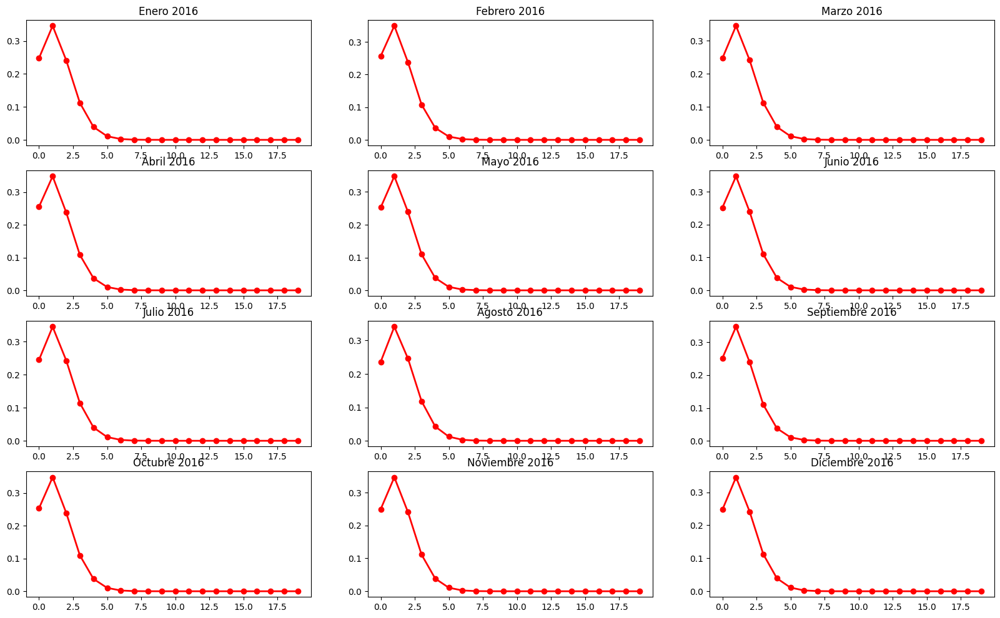

In [39]:
# Plotting the distribution of the variables (skewness) of all the columns
k=0
plt.figure(figsize=(20,12))

for i in range(12) :
    k=k+1
    plt.subplot(4, 3,k)
    data = np.random.poisson(probabilidades_2016.iloc[i, 0], size=1000)
    x = np.arange(0, 20)
    plt.plot(x, poisson.pmf(x, probabilidades_2016.iloc[i, 0]), 'ro-', lw=2)
    plt.title(probabilidades_2016.iloc[i, 2]+' 2016')

In [40]:
promedio_diario

,Año,Periodo,Intensidad media diaria de vehículos
12,2016,Enero,13959.0
13,2016,Febrero,14855.0
14,2016,Marzo,17717.0
15,2016,Abril,16462.0
16,2016,Mayo,17503.0
17,2016,Junio,18907.0
18,2016,Julio,24691.0
19,2016,Agosto,26511.0
20,2016,Septiembre,19320.0
21,2016,Octubre,17426.0


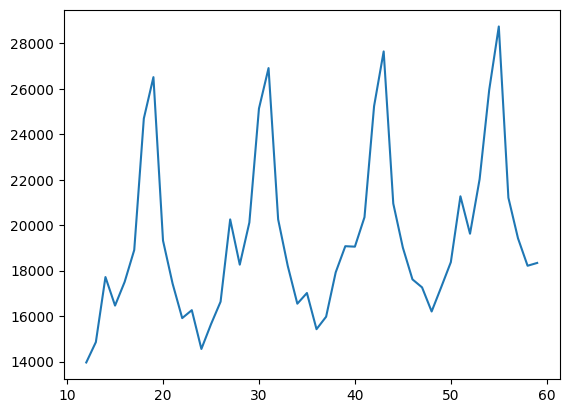

In [41]:
plt.plot(promedio_diario['Intensidad media diaria de vehículos'])

A partir de esta gráfica podemos ver que hay cierta estacionalidad en la intensidad media de vehículos en España cada año. Por ello, vamos a hacer una estimación del número de vehículos para cada mes posterior a 2019, ya que necesitamos datos hasta 2021.

# BUENA APROXIMACION

## PROVINCIA 1 - ÁLAVA

In [490]:
db_provincia1 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 1]

In [492]:
num_victimas_dia_semana1 = db_provincia1.groupby(['ANYO', 'MES', 'DIA_SEMANA', 'HORA'])['TOTAL_VICTIMAS_24H'].sum()

In [493]:
num_victimas_dia_semana1

ANYO  MES  DIA_SEMANA  HORA
2016  1    1           11      1
                       12      1
                       14      2
                       19      2
                       20      1
                              ..
2020  12   7           11      1
                       12      1
                       15      1
                       19      1
                       21      1
Name: TOTAL_VICTIMAS_24H, Length: 3537, dtype: int64

In [494]:
num_accidentes_por_dia_semana1 = db_provincia1.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

In [495]:
num_accidentes_por_dia_semana1

ANYO  MES  DIA_SEMANA
2016  1    5             15
           4             10
           2              9
           7              8
           1              7
                         ..
2020  12   5             10
           6             10
           3              9
           7              7
           2              4
Name: count, Length: 417, dtype: int64

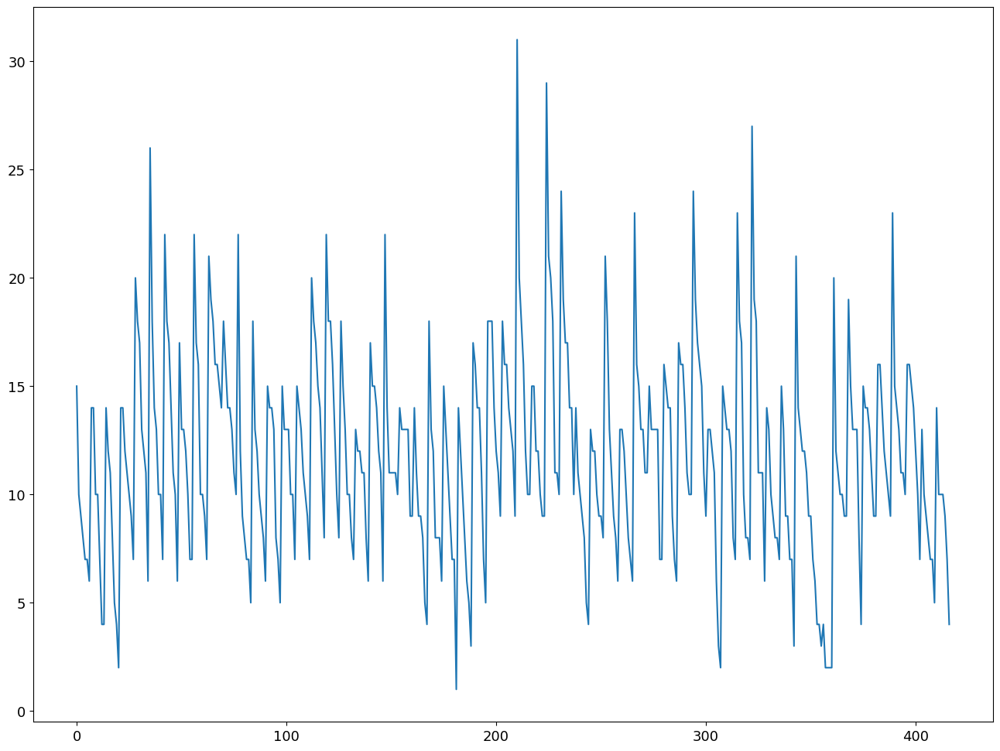

In [496]:
plt.plot(num_accidentes_por_dia_semana1.values)

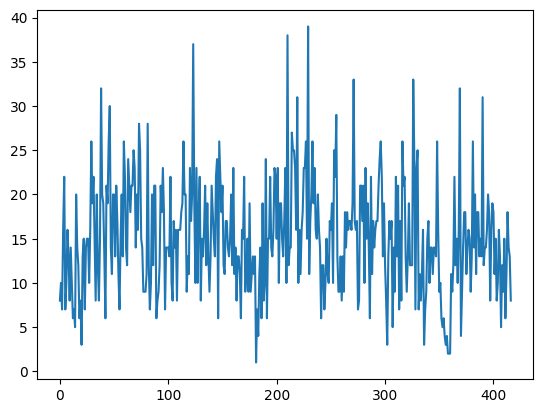

In [46]:
plt.plot(num_victimas_dia_semana1.values)

In [497]:
num_accidentes_por_dia_semana1 = num_accidentes_por_dia_semana1.reset_index()

In [498]:
num_accidentes_por_dia_semana1['FECHA'] = num_accidentes_por_dia_semana1.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

In [499]:
num_accidentes_por_dia_semana1

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,5,15,2016/1/5
1,2016,1,4,10,2016/1/4
2,2016,1,2,9,2016/1/2
3,2016,1,7,8,2016/1/7
4,2016,1,1,7,2016/1/1
...,...,...,...,...,...
412,2020,12,5,10,2020/12/5
413,2020,12,6,10,2020/12/6
414,2020,12,3,9,2020/12/3
415,2020,12,7,7,2020/12/7


In [50]:
num_victimas_dia_semana1 = num_victimas_dia_semana1.reset_index()

In [502]:
num_victimas_dia_semana1['FECHA'] = num_victimas_dia_semana1.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

TypeError: <lambda>() got an unexpected keyword argument 'axis'

In [52]:
num_victimas_dia_semana1

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,8,2016/1/1
1,2016,1,2,10,2016/1/2
2,2016,1,3,7,2016/1/3
3,2016,1,4,16,2016/1/4
4,2016,1,5,22,2016/1/5
...,...,...,...,...,...
412,2020,12,3,11,2020/12/3
413,2020,12,4,18,2020/12/4
414,2020,12,5,14,2020/12/5
415,2020,12,6,13,2020/12/6


In [500]:
df_provincia1 = num_accidentes_por_dia_semana1.merge(num_victimas_dia_semana1, on = 'FECHA')

KeyError: 'FECHA'

In [501]:
df_provincia1 = df_provincia1[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [55]:
df_provincia1.describe()

,count,TOTAL_VICTIMAS_24H
count,417.000000,417.000000
mean,11.812950,15.100719
std,4.664568,6.346897
min,1.000000,1.000000
25%,9.000000,11.000000
50%,11.000000,14.000000
75%,14.000000,19.000000
max,31.000000,39.000000


## PROVINCIA 2 - ALBACETE

In [56]:
db_provincia2 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 2]

In [57]:
num_victimas_dia_semana2 = db_provincia2.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana2 = db_provincia2.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

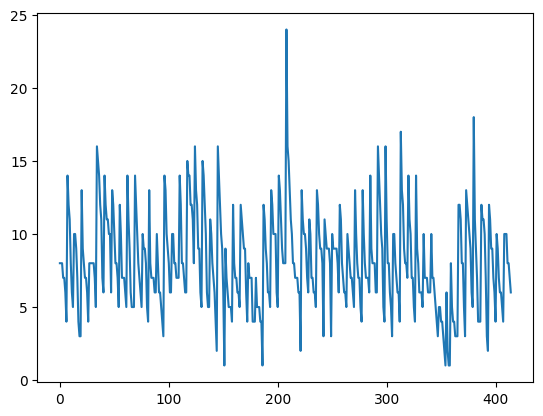

In [58]:
plt.plot(num_accidentes_por_dia_semana2.values)

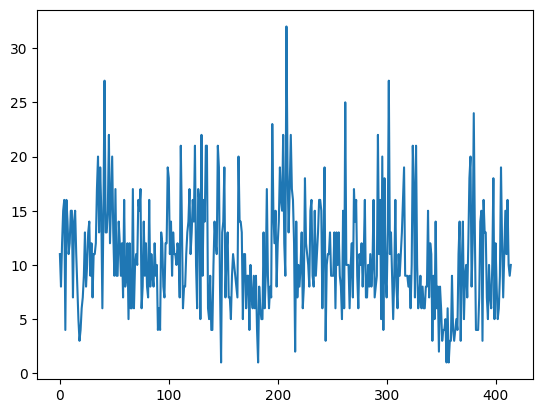

In [59]:
plt.plot(num_victimas_dia_semana2.values)

In [60]:
num_accidentes_por_dia_semana2 = num_accidentes_por_dia_semana2.reset_index()

num_accidentes_por_dia_semana2['FECHA'] = num_accidentes_por_dia_semana2.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana2

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,4,8,2016/1/4
1,2016,1,5,8,2016/1/5
2,2016,1,7,8,2016/1/7
3,2016,1,1,7,2016/1/1
4,2016,1,3,7,2016/1/3
...,...,...,...,...,...
410,2020,12,4,10,2020/12/4
411,2020,12,5,8,2020/12/5
412,2020,12,6,8,2020/12/6
413,2020,12,3,7,2020/12/3


In [61]:
num_victimas_dia_semana2 = num_victimas_dia_semana2.reset_index()

num_victimas_dia_semana2['FECHA'] = num_victimas_dia_semana2.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana2

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,11,2016/1/1
1,2016,1,2,8,2016/1/2
2,2016,1,3,12,2016/1/3
3,2016,1,4,15,2016/1/4
4,2016,1,5,16,2016/1/5
...,...,...,...,...,...
410,2020,12,3,11,2020/12/3
411,2020,12,4,16,2020/12/4
412,2020,12,5,10,2020/12/5
413,2020,12,6,9,2020/12/6


In [62]:
df_provincia2 = num_accidentes_por_dia_semana2.merge(num_victimas_dia_semana2, on = 'FECHA')

df_provincia2 = df_provincia2[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [63]:
df_provincia2.describe()

,count,TOTAL_VICTIMAS_24H
count,415.000000,415.000000
mean,8.115663,10.792771
std,3.308768,4.895571
min,1.000000,1.000000
25%,6.000000,7.000000
50%,8.000000,10.000000
75%,10.000000,14.000000
max,24.000000,32.000000


## PROVINCIA 3 - ALICANTE

In [64]:
db_provincia3 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 3]

In [65]:
num_victimas_dia_semana3 = db_provincia3.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana3 = db_provincia3.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

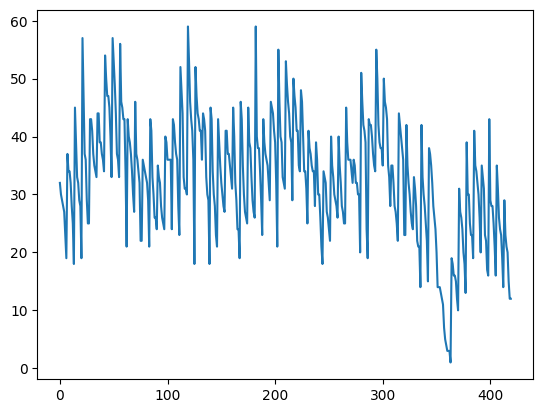

In [66]:
plt.plot(num_accidentes_por_dia_semana3.values)

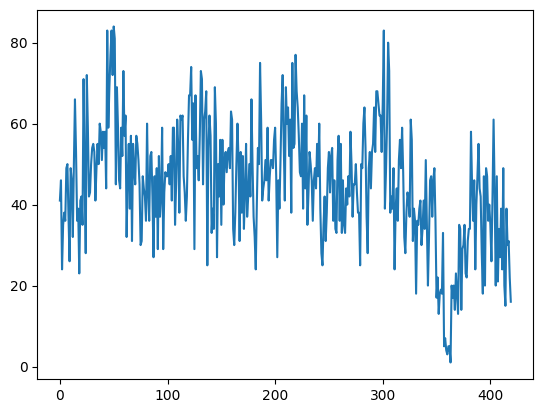

In [67]:
plt.plot(num_victimas_dia_semana3.values)

In [68]:
num_accidentes_por_dia_semana3 = num_accidentes_por_dia_semana3.reset_index()

num_accidentes_por_dia_semana3['FECHA'] = num_accidentes_por_dia_semana3.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana3

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,1,32,2016/1/1
1,2016,1,5,30,2016/1/5
2,2016,1,2,29,2016/1/2
3,2016,1,4,28,2016/1/4
4,2016,1,7,27,2016/1/7
...,...,...,...,...,...
415,2020,12,4,21,2020/12/4
416,2020,12,6,20,2020/12/6
417,2020,12,1,15,2020/12/1
418,2020,12,2,12,2020/12/2


In [69]:
num_victimas_dia_semana3 = num_victimas_dia_semana3.reset_index()

num_victimas_dia_semana3['FECHA'] = num_victimas_dia_semana3.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana3

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,41,2016/1/1
1,2016,1,2,46,2016/1/2
2,2016,1,3,24,2016/1/3
3,2016,1,4,35,2016/1/4
4,2016,1,5,38,2016/1/5
...,...,...,...,...,...
415,2020,12,3,39,2020/12/3
416,2020,12,4,30,2020/12/4
417,2020,12,5,31,2020/12/5
418,2020,12,6,22,2020/12/6


In [70]:
df_provincia3 = num_accidentes_por_dia_semana3.merge(num_victimas_dia_semana3, on = 'FECHA')

df_provincia3 = df_provincia3[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [71]:
df_provincia3.describe()

,count,TOTAL_VICTIMAS_24H
count,420.000000,420.000000
mean,32.709524,45.100000
std,10.158477,14.894842
min,1.000000,1.000000
25%,26.000000,36.000000
50%,33.000000,46.000000
75%,40.000000,55.000000
max,59.000000,84.000000


## PROVINCIA 4 - ALMERÍA

In [72]:
db_provincia4 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 4]

In [73]:
num_victimas_dia_semana4 = db_provincia4.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana4 = db_provincia4.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

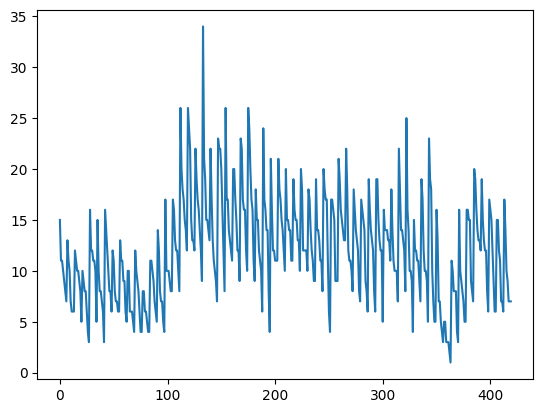

In [74]:
plt.plot(num_accidentes_por_dia_semana4.values)

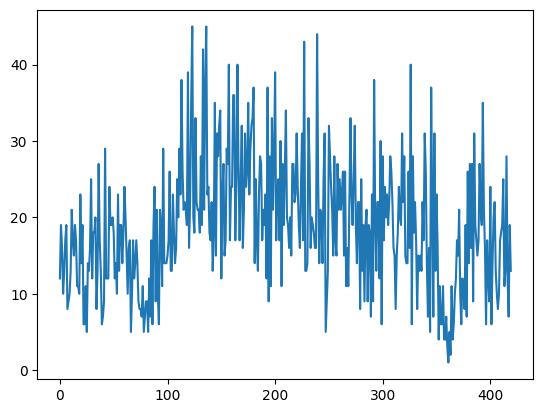

In [75]:
plt.plot(num_victimas_dia_semana4.values)

In [76]:
num_accidentes_por_dia_semana4 = num_accidentes_por_dia_semana4.reset_index()

num_accidentes_por_dia_semana4['FECHA'] = num_accidentes_por_dia_semana4.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana4

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,2,15,2016/1/2
1,2016,1,5,11,2016/1/5
2,2016,1,6,11,2016/1/6
3,2016,1,7,10,2016/1/7
4,2016,1,3,9,2016/1/3
...,...,...,...,...,...
415,2020,12,2,10,2020/12/2
416,2020,12,4,9,2020/12/4
417,2020,12,1,7,2020/12/1
418,2020,12,5,7,2020/12/5


In [77]:
num_victimas_dia_semana4 = num_victimas_dia_semana4.reset_index()

num_victimas_dia_semana4['FECHA'] = num_victimas_dia_semana4.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana4

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,12,2016/1/1
1,2016,1,2,19,2016/1/2
2,2016,1,3,16,2016/1/3
3,2016,1,4,10,2016/1/4
4,2016,1,5,13,2016/1/5
...,...,...,...,...,...
415,2020,12,3,28,2020/12/3
416,2020,12,4,12,2020/12/4
417,2020,12,5,7,2020/12/5
418,2020,12,6,19,2020/12/6


In [78]:
df_provincia4 = num_accidentes_por_dia_semana4.merge(num_victimas_dia_semana4, on = 'FECHA')

df_provincia4 = df_provincia4[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [79]:
df_provincia4.describe()

,count,TOTAL_VICTIMAS_24H
count,420.000000,420.000000
mean,12.023810,18.776190
std,5.078797,8.480634
min,1.000000,1.000000
25%,8.000000,13.000000
50%,12.000000,18.000000
75%,15.000000,24.000000
max,34.000000,45.000000


## PROVINCIA 5 - ASTURIAS

In [80]:
db_provincia5 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 5]

In [81]:
num_victimas_dia_semana5 = db_provincia5.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana5 = db_provincia5.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

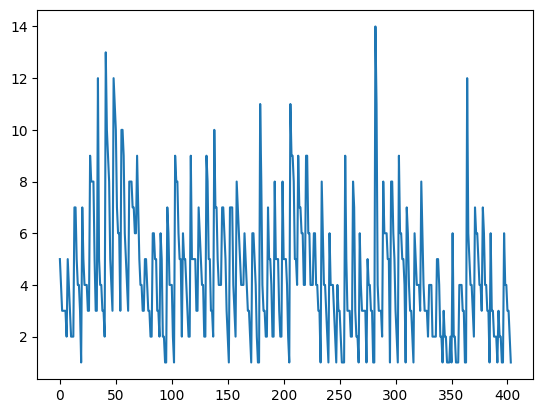

In [82]:
plt.plot(num_accidentes_por_dia_semana5.values)

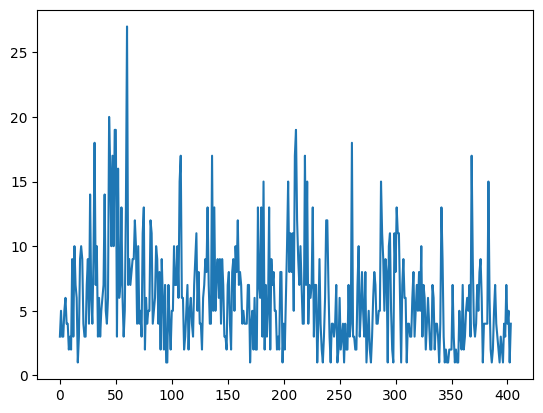

In [83]:
plt.plot(num_victimas_dia_semana5.values)

In [84]:
num_accidentes_por_dia_semana5 = num_accidentes_por_dia_semana5.reset_index()

num_accidentes_por_dia_semana5['FECHA'] = num_accidentes_por_dia_semana5.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana5

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,6,5,2016/1/6
1,2016,1,5,4,2016/1/5
2,2016,1,1,3,2016/1/1
3,2016,1,3,3,2016/1/3
4,2016,1,4,3,2016/1/4
...,...,...,...,...,...
399,2020,12,5,4,2020/12/5
400,2020,12,1,3,2020/12/1
401,2020,12,7,3,2020/12/7
402,2020,12,2,2,2020/12/2


In [85]:
num_victimas_dia_semana5 = num_victimas_dia_semana5.reset_index()

num_victimas_dia_semana5['FECHA'] = num_victimas_dia_semana5.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana5

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,3,2016/1/1
1,2016,1,2,5,2016/1/2
2,2016,1,3,3,2016/1/3
3,2016,1,4,3,2016/1/4
4,2016,1,5,5,2016/1/5
...,...,...,...,...,...
399,2020,12,3,7,2020/12/3
400,2020,12,4,4,2020/12/4
401,2020,12,5,5,2020/12/5
402,2020,12,6,1,2020/12/6


In [86]:
df_provincia5 = num_accidentes_por_dia_semana5.merge(num_victimas_dia_semana5, on = 'FECHA')

df_provincia5 = df_provincia5[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [87]:
df_provincia5.describe()

,count,TOTAL_VICTIMAS_24H
count,404.000000,404.000000
mean,4.405941,6.116337
std,2.463342,4.061418
min,1.000000,1.000000
25%,3.000000,3.000000
50%,4.000000,5.000000
75%,6.000000,8.000000
max,14.000000,27.000000


## PROVINCIA 6- ÁVILA

In [88]:
db_provincia6 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 6]

In [89]:
num_victimas_dia_semana6 = db_provincia6.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana6 = db_provincia6.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

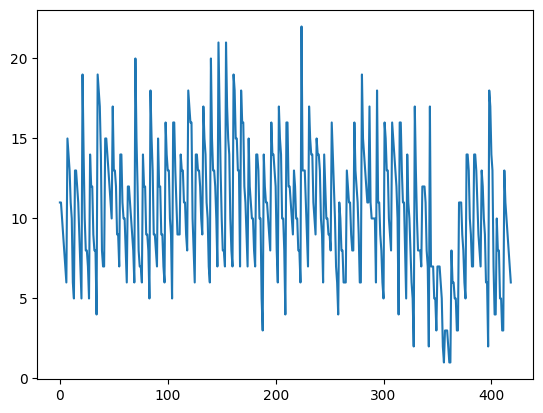

In [90]:
plt.plot(num_accidentes_por_dia_semana6.values)

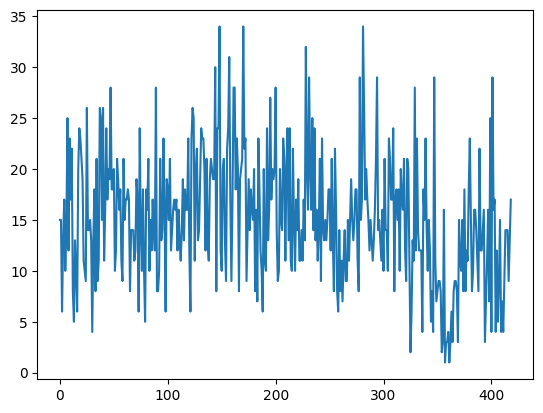

In [91]:
plt.plot(num_victimas_dia_semana6.values)

In [92]:
num_accidentes_por_dia_semana6 = num_accidentes_por_dia_semana6.reset_index()

num_accidentes_por_dia_semana6['FECHA'] = num_accidentes_por_dia_semana6.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana6

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,1,11,2016/1/1
1,2016,1,7,11,2016/1/7
2,2016,1,5,10,2016/1/5
3,2016,1,4,9,2016/1/4
4,2016,1,2,8,2016/1/2
...,...,...,...,...,...
414,2020,12,4,10,2020/12/4
415,2020,12,6,9,2020/12/6
416,2020,12,5,8,2020/12/5
417,2020,12,1,7,2020/12/1


In [93]:
num_victimas_dia_semana6 = num_victimas_dia_semana6.reset_index()

num_victimas_dia_semana6['FECHA'] = num_victimas_dia_semana6.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana6

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,15,2016/1/1
1,2016,1,2,15,2016/1/2
2,2016,1,3,6,2016/1/3
3,2016,1,4,13,2016/1/4
4,2016,1,5,17,2016/1/5
...,...,...,...,...,...
414,2020,12,3,14,2020/12/3
415,2020,12,4,14,2020/12/4
416,2020,12,5,9,2020/12/5
417,2020,12,6,13,2020/12/6


In [94]:
df_provincia6 = num_accidentes_por_dia_semana6.merge(num_victimas_dia_semana6, on = 'FECHA')

df_provincia6 = df_provincia6[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [95]:
df_provincia6.describe()

,count,TOTAL_VICTIMAS_24H
count,419.000000,419.000000
mean,10.465394,15.114558
std,3.943454,6.261545
min,1.000000,1.000000
25%,8.000000,11.000000
50%,10.000000,15.000000
75%,13.000000,19.000000
max,22.000000,34.000000


## PROVINCIA 7 - BADAJOZ

In [96]:
db_provincia7 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 7]

In [97]:
num_victimas_dia_semana7 = db_provincia7.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana7 = db_provincia7.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

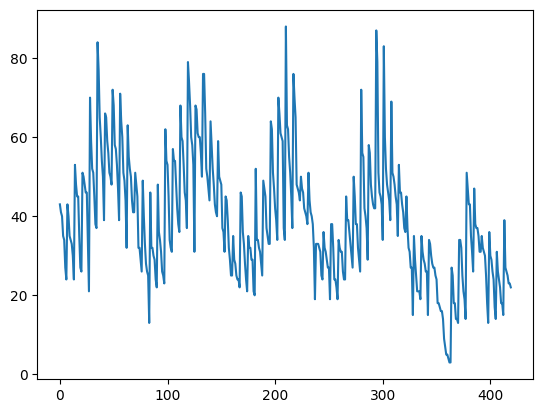

In [98]:
plt.plot(num_accidentes_por_dia_semana7.values)

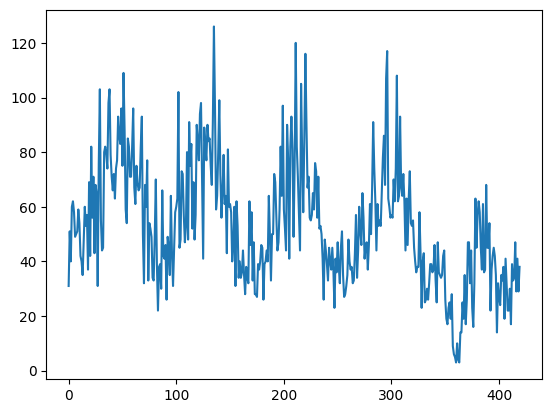

In [99]:
plt.plot(num_victimas_dia_semana7.values)

In [100]:
num_accidentes_por_dia_semana7 = num_accidentes_por_dia_semana7.reset_index()

num_accidentes_por_dia_semana7['FECHA'] = num_accidentes_por_dia_semana7.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana7

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,5,43,2016/1/5
1,2016,1,4,41,2016/1/4
2,2016,1,6,40,2016/1/6
3,2016,1,7,35,2016/1/7
4,2016,1,2,34,2016/1/2
...,...,...,...,...,...
415,2020,12,7,26,2020/12/7
416,2020,12,4,25,2020/12/4
417,2020,12,1,23,2020/12/1
418,2020,12,5,23,2020/12/5


In [101]:
num_victimas_dia_semana7 = num_victimas_dia_semana7.reset_index()

num_victimas_dia_semana7['FECHA'] = num_victimas_dia_semana7.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana7

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,31,2016/1/1
1,2016,1,2,51,2016/1/2
2,2016,1,3,40,2016/1/3
3,2016,1,4,60,2016/1/4
4,2016,1,5,62,2016/1/5
...,...,...,...,...,...
415,2020,12,3,47,2020/12/3
416,2020,12,4,29,2020/12/4
417,2020,12,5,41,2020/12/5
418,2020,12,6,29,2020/12/6


In [102]:
df_provincia7 = num_accidentes_por_dia_semana7.merge(num_victimas_dia_semana7, on = 'FECHA')

df_provincia7 = df_provincia7[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [103]:
df_provincia7.describe()

,count,TOTAL_VICTIMAS_24H
count,420.000000,420.000000
mean,39.290476,53.107143
std,15.446000,21.966789
min,3.000000,3.000000
25%,28.000000,37.000000
50%,37.000000,50.000000
75%,49.000000,67.000000
max,88.000000,126.000000


## PROVINCIA 8 - BARCELONA

In [104]:
db_provincia8 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 8]

In [105]:
num_victimas_dia_semana8 = db_provincia8.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana8 = db_provincia8.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

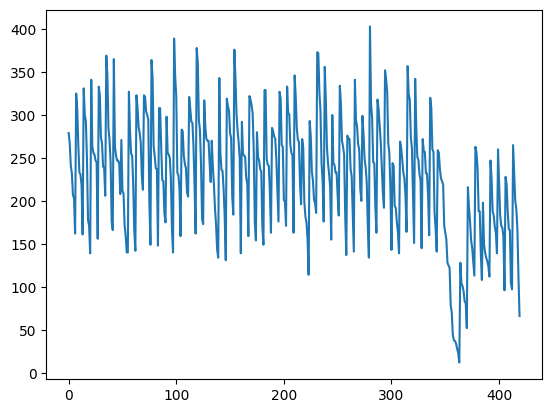

In [106]:
plt.plot(num_accidentes_por_dia_semana8.values)

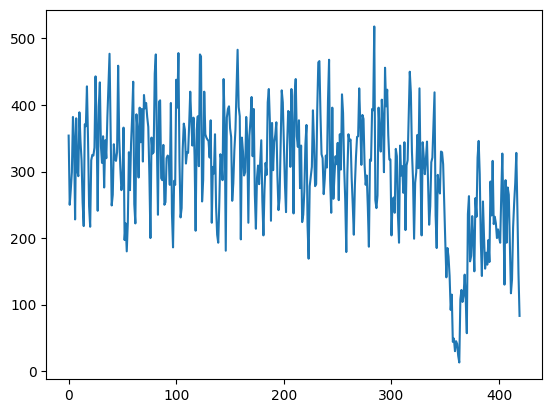

In [107]:
plt.plot(num_victimas_dia_semana8.values)

In [108]:
num_accidentes_por_dia_semana8 = num_accidentes_por_dia_semana8.reset_index()

num_accidentes_por_dia_semana8['FECHA'] = num_accidentes_por_dia_semana8.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana8

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,5,279,2016/1/5
1,2016,1,1,267,2016/1/1
2,2016,1,6,241,2016/1/6
3,2016,1,4,232,2016/1/4
4,2016,1,3,207,2016/1/3
...,...,...,...,...,...
415,2020,12,5,200,2020/12/5
416,2020,12,2,191,2020/12/2
417,2020,12,1,167,2020/12/1
418,2020,12,6,111,2020/12/6


In [109]:
num_victimas_dia_semana8 = num_victimas_dia_semana8.reset_index()

num_victimas_dia_semana8['FECHA'] = num_victimas_dia_semana8.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana8

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,354,2016/1/1
1,2016,1,2,250,2016/1/2
2,2016,1,3,273,2016/1/3
3,2016,1,4,299,2016/1/4
4,2016,1,5,382,2016/1/5
...,...,...,...,...,...
415,2020,12,3,283,2020/12/3
416,2020,12,4,328,2020/12/4
417,2020,12,5,242,2020/12/5
418,2020,12,6,147,2020/12/6


In [110]:
df_provincia8 = num_accidentes_por_dia_semana8.merge(num_victimas_dia_semana8, on = 'FECHA')

df_provincia8 = df_provincia8[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [111]:
df_provincia8.describe()

,count,TOTAL_VICTIMAS_24H
count,420.000000,420.000000
mean,230.361905,301.364286
std,70.609231,88.001753
min,12.000000,13.000000
25%,178.750000,248.750000
50%,238.000000,312.500000
75%,274.250000,358.750000
max,403.000000,518.000000


## PROVINCIA 9 - BURGOS

In [112]:
db_provincia9 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 9]

In [113]:
num_victimas_dia_semana9 = db_provincia9.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana9 = db_provincia9.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

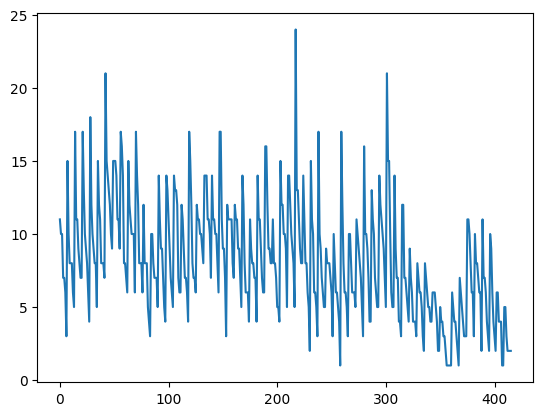

In [114]:
plt.plot(num_accidentes_por_dia_semana9.values)

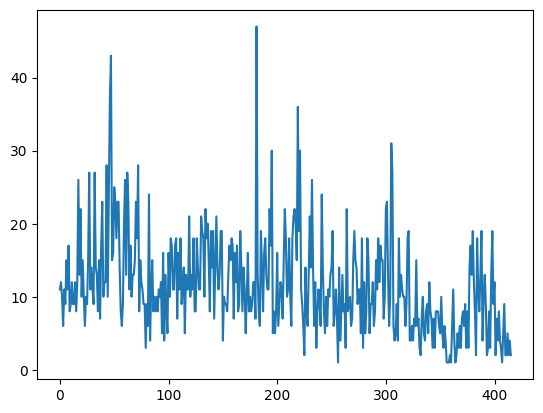

In [115]:
plt.plot(num_victimas_dia_semana9.values)

In [116]:
num_accidentes_por_dia_semana9 = num_accidentes_por_dia_semana9.reset_index()

num_accidentes_por_dia_semana9['FECHA'] = num_accidentes_por_dia_semana9.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana9

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,7,11,2016/1/7
1,2016,1,1,10,2016/1/1
2,2016,1,2,10,2016/1/2
3,2016,1,3,7,2016/1/3
4,2016,1,5,7,2016/1/5
...,...,...,...,...,...
411,2020,12,6,3,2020/12/6
412,2020,12,2,2,2020/12/2
413,2020,12,3,2,2020/12/3
414,2020,12,5,2,2020/12/5


In [117]:
num_victimas_dia_semana9 = num_victimas_dia_semana9.reset_index()

num_victimas_dia_semana9['FECHA'] = num_victimas_dia_semana9.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana9

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,11,2016/1/1
1,2016,1,2,12,2016/1/2
2,2016,1,3,10,2016/1/3
3,2016,1,4,6,2016/1/4
4,2016,1,5,11,2016/1/5
...,...,...,...,...,...
411,2020,12,3,2,2020/12/3
412,2020,12,4,5,2020/12/4
413,2020,12,5,2,2020/12/5
414,2020,12,6,4,2020/12/6


In [118]:
df_provincia9 = num_accidentes_por_dia_semana9.merge(num_victimas_dia_semana9, on = 'FECHA')

df_provincia9 = df_provincia9[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [119]:
df_provincia9.describe()

,count,TOTAL_VICTIMAS_24H
count,416.000000,416.000000
mean,8.206731,11.593750
std,3.906812,6.695862
min,1.000000,1.000000
25%,5.000000,7.000000
50%,8.000000,10.000000
75%,11.000000,15.000000
max,24.000000,47.000000


## PROVINCIA 10 - CÁCERES

In [120]:
db_provincia10 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 10]

In [121]:
num_victimas_dia_semana10 = db_provincia10.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana10 = db_provincia10.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

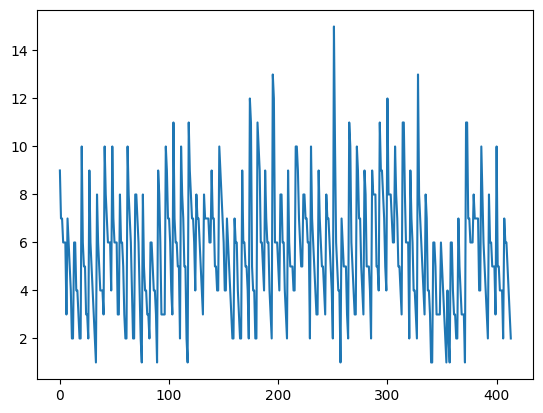

In [122]:
plt.plot(num_accidentes_por_dia_semana10.values)

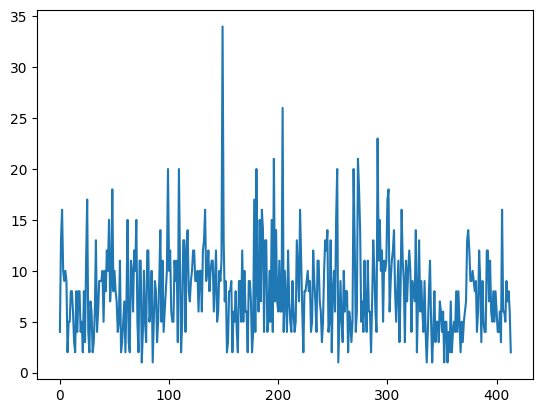

In [123]:
plt.plot(num_victimas_dia_semana10.values)

In [124]:
num_accidentes_por_dia_semana10 = num_accidentes_por_dia_semana10.reset_index()

num_accidentes_por_dia_semana10['FECHA'] = num_accidentes_por_dia_semana10.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana10

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,3,9,2016/1/3
1,2016,1,5,7,2016/1/5
2,2016,1,6,7,2016/1/6
3,2016,1,2,6,2016/1/2
4,2016,1,4,6,2016/1/4
...,...,...,...,...,...
409,2020,12,5,6,2020/12/5
410,2020,12,6,5,2020/12/6
411,2020,12,2,4,2020/12/2
412,2020,12,1,3,2020/12/1


In [125]:
num_victimas_dia_semana10 = num_victimas_dia_semana10.reset_index()

num_victimas_dia_semana10['FECHA'] = num_victimas_dia_semana10.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana10

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,4,2016/1/1
1,2016,1,2,13,2016/1/2
2,2016,1,3,16,2016/1/3
3,2016,1,4,10,2016/1/4
4,2016,1,5,9,2016/1/5
...,...,...,...,...,...
409,2020,12,3,9,2020/12/3
410,2020,12,4,7,2020/12/4
411,2020,12,5,8,2020/12/5
412,2020,12,6,6,2020/12/6


In [126]:
df_provincia10 = num_accidentes_por_dia_semana10.merge(num_victimas_dia_semana10, on = 'FECHA')

df_provincia10 = df_provincia10[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [127]:
df_provincia10.describe()

,count,TOTAL_VICTIMAS_24H
count,414.000000,414.000000
mean,5.579710,7.997585
std,2.518152,4.392101
min,1.000000,1.000000
25%,4.000000,5.000000
50%,6.000000,8.000000
75%,7.000000,10.000000
max,15.000000,34.000000


## PROVINCIA 11 - CÁDIZ

In [128]:
db_provincia11 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 11]

In [129]:
num_victimas_dia_semana11 = db_provincia11.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana11 = db_provincia11.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

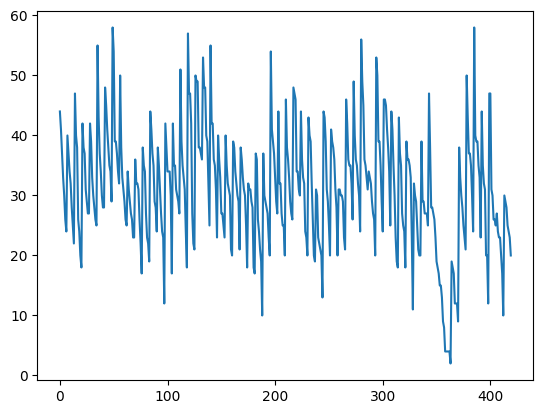

In [130]:
plt.plot(num_accidentes_por_dia_semana11.values)

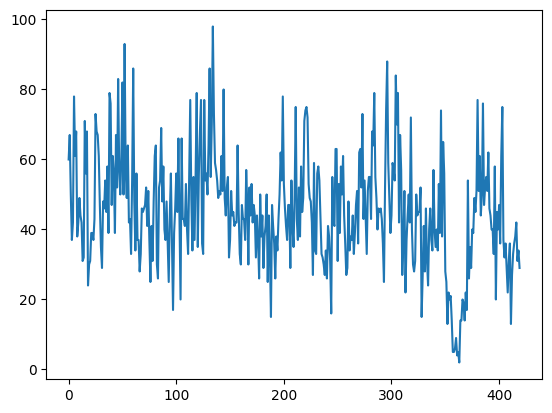

In [131]:
plt.plot(num_victimas_dia_semana11.values)

In [132]:
num_accidentes_por_dia_semana11 = num_accidentes_por_dia_semana11.reset_index()

num_accidentes_por_dia_semana11['FECHA'] = num_accidentes_por_dia_semana11.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana11

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,2,44,2016/1/2
1,2016,1,6,41,2016/1/6
2,2016,1,1,37,2016/1/1
3,2016,1,3,33,2016/1/3
4,2016,1,7,30,2016/1/7
...,...,...,...,...,...
415,2020,12,6,28,2020/12/6
416,2020,12,1,25,2020/12/1
417,2020,12,2,24,2020/12/2
418,2020,12,5,23,2020/12/5


In [133]:
num_victimas_dia_semana11 = num_victimas_dia_semana11.reset_index()

num_victimas_dia_semana11['FECHA'] = num_victimas_dia_semana11.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana11

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,60,2016/1/1
1,2016,1,2,67,2016/1/2
2,2016,1,3,50,2016/1/3
3,2016,1,4,37,2016/1/4
4,2016,1,5,42,2016/1/5
...,...,...,...,...,...
415,2020,12,3,38,2020/12/3
416,2020,12,4,42,2020/12/4
417,2020,12,5,31,2020/12/5
418,2020,12,6,34,2020/12/6


In [134]:
df_provincia11 = num_accidentes_por_dia_semana11.merge(num_victimas_dia_semana11, on = 'FECHA')

df_provincia11 = df_provincia11[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [135]:
df_provincia11.describe()

,count,TOTAL_VICTIMAS_24H
count,420.000000,420.000000
mean,31.123810,45.471429
std,9.903781,16.046075
min,2.000000,2.000000
25%,25.000000,36.000000
50%,31.000000,44.000000
75%,37.250000,55.000000
max,58.000000,98.000000


## PROVINCIA 12 - CANTABRIA

In [136]:
db_provincia12 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 12]

In [137]:
num_victimas_dia_semana12 = db_provincia12.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana12 = db_provincia12.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

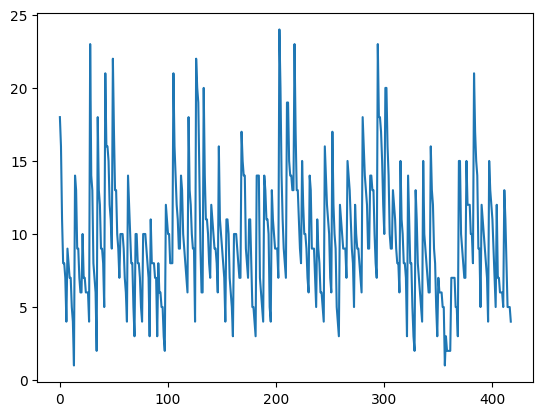

In [138]:
plt.plot(num_accidentes_por_dia_semana12.values)

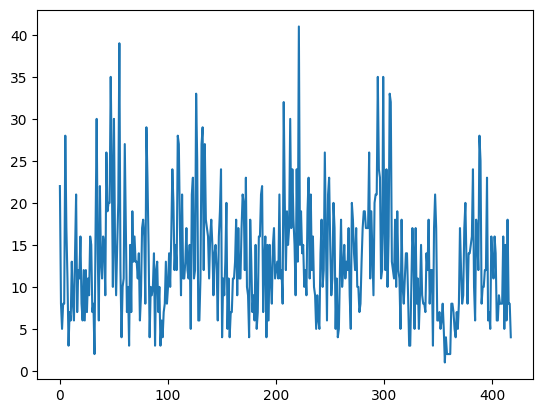

In [139]:
plt.plot(num_victimas_dia_semana12.values)

In [140]:
num_accidentes_por_dia_semana12 = num_accidentes_por_dia_semana12.reset_index()

num_accidentes_por_dia_semana12['FECHA'] = num_accidentes_por_dia_semana12.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana12

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,6,18,2016/1/6
1,2016,1,1,16,2016/1/1
2,2016,1,7,11,2016/1/7
3,2016,1,4,8,2016/1/4
4,2016,1,5,8,2016/1/5
...,...,...,...,...,...
413,2020,12,5,8,2020/12/5
414,2020,12,1,5,2020/12/1
415,2020,12,3,5,2020/12/3
416,2020,12,6,5,2020/12/6


In [141]:
num_victimas_dia_semana12 = num_victimas_dia_semana12.reset_index()

num_victimas_dia_semana12['FECHA'] = num_victimas_dia_semana12.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana12

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,22,2016/1/1
1,2016,1,2,8,2016/1/2
2,2016,1,3,5,2016/1/3
3,2016,1,4,8,2016/1/4
4,2016,1,5,8,2016/1/5
...,...,...,...,...,...
413,2020,12,3,6,2020/12/3
414,2020,12,4,18,2020/12/4
415,2020,12,5,8,2020/12/5
416,2020,12,6,8,2020/12/6


In [142]:
df_provincia12 = num_accidentes_por_dia_semana12.merge(num_victimas_dia_semana12, on = 'FECHA')

df_provincia12 = df_provincia12[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [143]:
df_provincia12.describe()

,count,TOTAL_VICTIMAS_24H
count,418.000000,418.000000
mean,9.679426,13.244019
std,4.277834,6.806879
min,1.000000,1.000000
25%,7.000000,8.000000
50%,9.000000,12.000000
75%,12.000000,17.000000
max,24.000000,41.000000


## PROVINCIA 13 - CASTELLÓN

In [144]:
db_provincia13 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 13]

In [145]:
num_victimas_dia_semana13 = db_provincia13.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana13 = db_provincia13.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

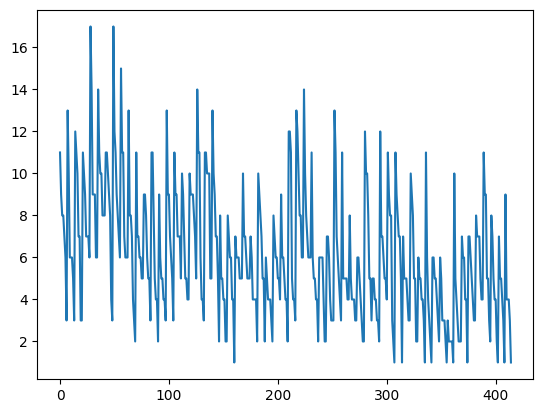

In [146]:
plt.plot(num_accidentes_por_dia_semana13.values)

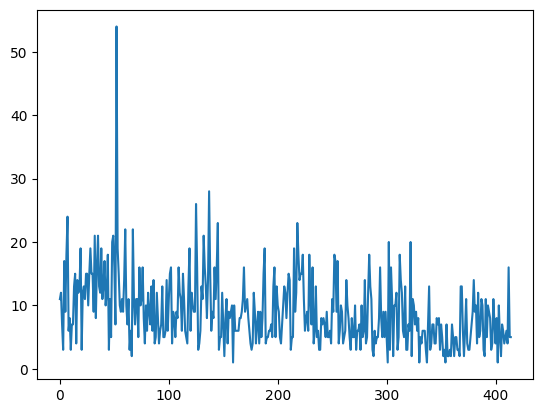

In [147]:
plt.plot(num_victimas_dia_semana13.values)

In [148]:
num_accidentes_por_dia_semana13 = num_accidentes_por_dia_semana13.reset_index()

num_accidentes_por_dia_semana13['FECHA'] = num_accidentes_por_dia_semana13.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana13

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,5,11,2016/1/5
1,2016,1,2,9,2016/1/2
2,2016,1,1,8,2016/1/1
3,2016,1,7,8,2016/1/7
4,2016,1,6,7,2016/1/6
...,...,...,...,...,...
410,2020,12,2,4,2020/12/2
411,2020,12,5,4,2020/12/5
412,2020,12,6,4,2020/12/6
413,2020,12,3,3,2020/12/3


In [149]:
num_victimas_dia_semana13 = num_victimas_dia_semana13.reset_index()

num_victimas_dia_semana13['FECHA'] = num_victimas_dia_semana13.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana13

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,11,2016/1/1
1,2016,1,2,12,2016/1/2
2,2016,1,3,7,2016/1/3
3,2016,1,4,3,2016/1/4
4,2016,1,5,17,2016/1/5
...,...,...,...,...,...
410,2020,12,2,6,2020/12/2
411,2020,12,3,4,2020/12/3
412,2020,12,4,16,2020/12/4
413,2020,12,5,5,2020/12/5


In [150]:
df_provincia13 = num_accidentes_por_dia_semana13.merge(num_victimas_dia_semana13, on = 'FECHA')

df_provincia13 = df_provincia13[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [151]:
df_provincia13.describe()

,count,TOTAL_VICTIMAS_24H
count,415.000000,415.000000
mean,6.149398,8.997590
std,3.047426,5.490659
min,1.000000,1.000000
25%,4.000000,5.000000
50%,6.000000,8.000000
75%,8.000000,12.000000
max,17.000000,54.000000


## PROVINCIA 14 - CIUDAD REAL

In [152]:
db_provincia14 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 14]

In [153]:
num_victimas_dia_semana14 = db_provincia14.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana14 = db_provincia14.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

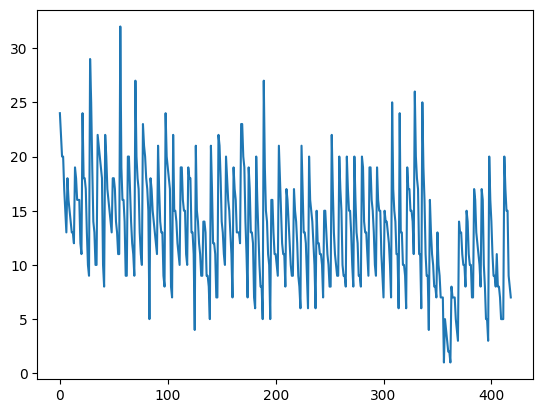

In [154]:
plt.plot(num_accidentes_por_dia_semana14.values)

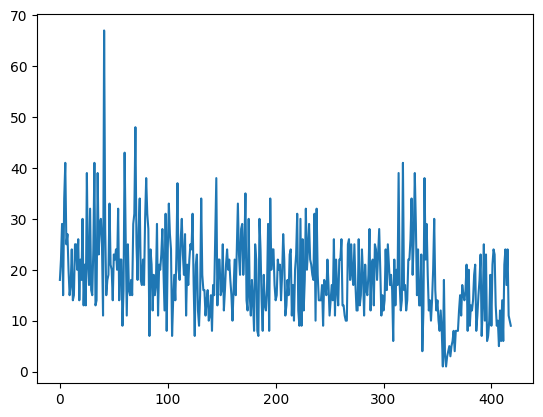

In [155]:
plt.plot(num_victimas_dia_semana14.values)

In [156]:
num_accidentes_por_dia_semana14 = num_accidentes_por_dia_semana14.reset_index()

num_accidentes_por_dia_semana14['FECHA'] = num_accidentes_por_dia_semana14.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana14

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,5,24,2016/1/5
1,2016,1,6,22,2016/1/6
2,2016,1,3,20,2016/1/3
3,2016,1,7,20,2016/1/7
4,2016,1,1,17,2016/1/1
...,...,...,...,...,...
414,2020,12,1,15,2020/12/1
415,2020,12,3,15,2020/12/3
416,2020,12,6,9,2020/12/6
417,2020,12,7,8,2020/12/7


In [157]:
num_victimas_dia_semana14 = num_victimas_dia_semana14.reset_index()

num_victimas_dia_semana14['FECHA'] = num_victimas_dia_semana14.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana14

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,18,2016/1/1
1,2016,1,2,22,2016/1/2
2,2016,1,3,29,2016/1/3
3,2016,1,4,15,2016/1/4
4,2016,1,5,34,2016/1/5
...,...,...,...,...,...
414,2020,12,3,17,2020/12/3
415,2020,12,4,24,2020/12/4
416,2020,12,5,11,2020/12/5
417,2020,12,6,10,2020/12/6


In [158]:
df_provincia14 = num_accidentes_por_dia_semana14.merge(num_victimas_dia_semana14, on = 'FECHA')

df_provincia14 = df_provincia14[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [159]:
df_provincia14.describe()

,count,TOTAL_VICTIMAS_24H
count,419.000000,419.000000
mean,13.262530,18.799523
std,5.036499,8.264057
min,1.000000,1.000000
25%,10.000000,13.000000
50%,13.000000,18.000000
75%,17.000000,24.000000
max,32.000000,67.000000


## PROVINCIA 15 - CÓRDOBA

In [160]:
db_provincia15 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 15]

In [161]:
num_victimas_dia_semana15 = db_provincia15.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana15 = db_provincia15.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

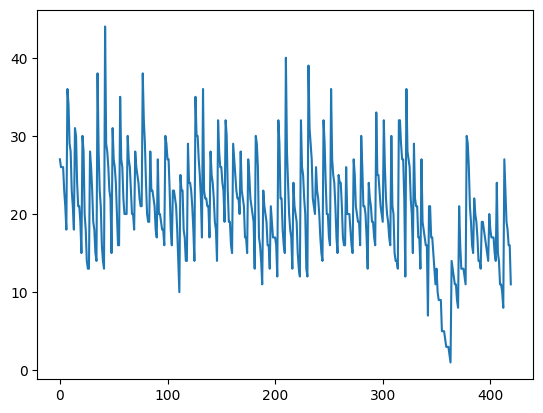

In [162]:
plt.plot(num_accidentes_por_dia_semana15.values)

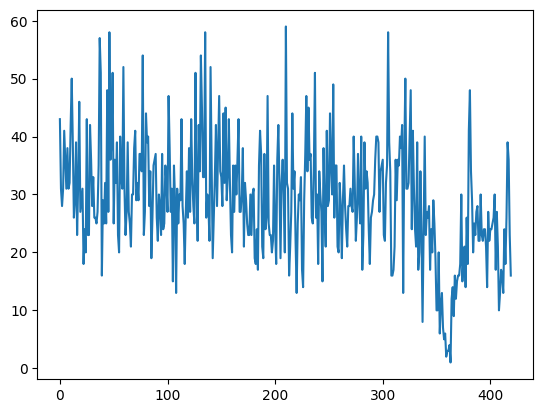

In [163]:
plt.plot(num_victimas_dia_semana15.values)

In [164]:
num_accidentes_por_dia_semana15 = num_accidentes_por_dia_semana15.reset_index()

num_accidentes_por_dia_semana15['FECHA'] = num_accidentes_por_dia_semana15.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana15

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,5,27,2016/1/5
1,2016,1,1,26,2016/1/1
2,2016,1,3,26,2016/1/3
3,2016,1,6,26,2016/1/6
4,2016,1,4,23,2016/1/4
...,...,...,...,...,...
415,2020,12,3,19,2020/12/3
416,2020,12,1,18,2020/12/1
417,2020,12,2,16,2020/12/2
418,2020,12,6,16,2020/12/6


In [165]:
num_victimas_dia_semana15 = num_victimas_dia_semana15.reset_index()

num_victimas_dia_semana15['FECHA'] = num_victimas_dia_semana15.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana15

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,43,2016/1/1
1,2016,1,2,31,2016/1/2
2,2016,1,3,28,2016/1/3
3,2016,1,4,31,2016/1/4
4,2016,1,5,41,2016/1/5
...,...,...,...,...,...
415,2020,12,3,26,2020/12/3
416,2020,12,4,39,2020/12/4
417,2020,12,5,36,2020/12/5
418,2020,12,6,23,2020/12/6


In [166]:
df_provincia15 = num_accidentes_por_dia_semana15.merge(num_victimas_dia_semana15, on = 'FECHA')

df_provincia15 = df_provincia15[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [167]:
df_provincia15.describe()

,count,TOTAL_VICTIMAS_24H
count,420.000000,420.000000
mean,20.592857,29.050000
std,6.587284,10.084364
min,1.000000,1.000000
25%,16.000000,23.000000
50%,20.000000,29.000000
75%,25.000000,35.000000
max,44.000000,59.000000


## PROVINCIA 16 - CUENCA

In [168]:
db_provincia16 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 16]

In [169]:
num_victimas_dia_semana16 = db_provincia16.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana16 = db_provincia16.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

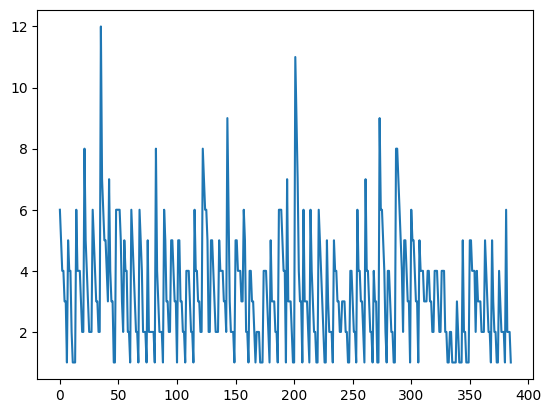

In [170]:
plt.plot(num_accidentes_por_dia_semana16.values)

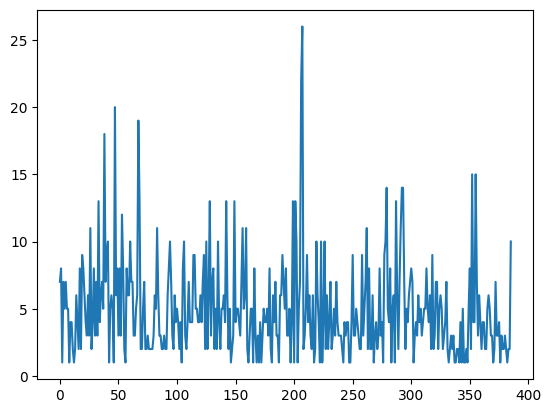

In [171]:
plt.plot(num_victimas_dia_semana16.values)

In [172]:
num_accidentes_por_dia_semana16 = num_accidentes_por_dia_semana16.reset_index()

num_accidentes_por_dia_semana16['FECHA'] = num_accidentes_por_dia_semana16.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana16

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,2,6,2016/1/2
1,2016,1,1,5,2016/1/1
2,2016,1,4,4,2016/1/4
3,2016,1,5,4,2016/1/5
4,2016,1,6,3,2016/1/6
...,...,...,...,...,...
381,2020,12,5,6,2020/12/5
382,2020,12,1,2,2020/12/1
383,2020,12,3,2,2020/12/3
384,2020,12,4,2,2020/12/4


In [173]:
num_victimas_dia_semana16 = num_victimas_dia_semana16.reset_index()

num_victimas_dia_semana16['FECHA'] = num_victimas_dia_semana16.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana16

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,7,2016/1/1
1,2016,1,2,8,2016/1/2
2,2016,1,3,1,2016/1/3
3,2016,1,4,7,2016/1/4
4,2016,1,5,5,2016/1/5
...,...,...,...,...,...
381,2020,12,1,2,2020/12/1
382,2020,12,2,1,2020/12/2
383,2020,12,3,2,2020/12/3
384,2020,12,4,2,2020/12/4


In [174]:
df_provincia16 = num_accidentes_por_dia_semana16.merge(num_victimas_dia_semana16, on = 'FECHA')

df_provincia16 = df_provincia16[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [175]:
df_provincia16.describe()

,count,TOTAL_VICTIMAS_24H
count,386.000000,386.000000
mean,3.272021,4.927461
std,1.826527,3.547074
min,1.000000,1.000000
25%,2.000000,2.000000
50%,3.000000,4.000000
75%,4.000000,6.750000
max,12.000000,26.000000


## PROVINCIA 17 - GERONA

In [176]:
db_provincia17 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 17]

In [177]:
num_victimas_dia_semana17 = db_provincia17.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana17 = db_provincia17.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

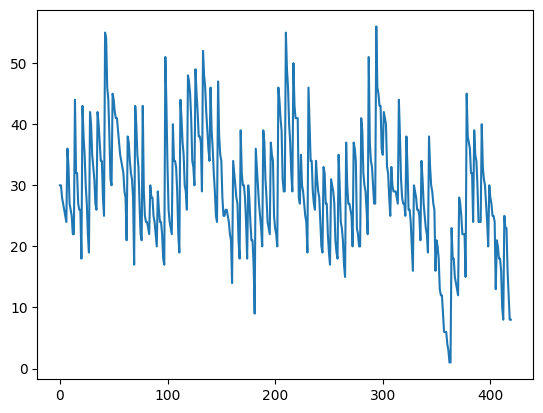

In [178]:
plt.plot(num_accidentes_por_dia_semana17.values)

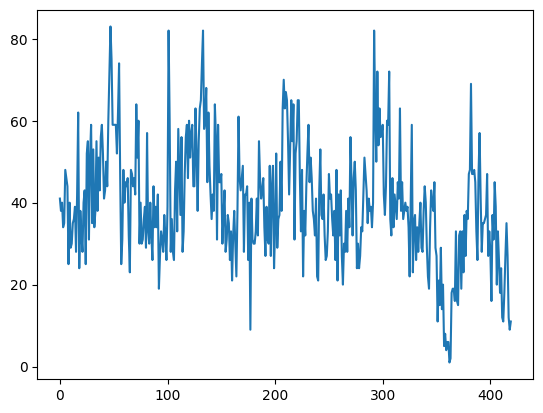

In [179]:
plt.plot(num_victimas_dia_semana17.values)

In [180]:
num_accidentes_por_dia_semana17 = num_accidentes_por_dia_semana17.reset_index()

num_accidentes_por_dia_semana17['FECHA'] = num_accidentes_por_dia_semana17.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana17

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,1,30,2016/1/1
1,2016,1,5,30,2016/1/5
2,2016,1,7,28,2016/1/7
3,2016,1,2,27,2016/1/2
4,2016,1,6,26,2016/1/6
...,...,...,...,...,...
415,2020,12,3,23,2020/12/3
416,2020,12,1,16,2020/12/1
417,2020,12,5,12,2020/12/5
418,2020,12,6,8,2020/12/6


In [181]:
num_victimas_dia_semana17 = num_victimas_dia_semana17.reset_index()

num_victimas_dia_semana17['FECHA'] = num_victimas_dia_semana17.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana17

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,41,2016/1/1
1,2016,1,2,38,2016/1/2
2,2016,1,3,40,2016/1/3
3,2016,1,4,34,2016/1/4
4,2016,1,5,35,2016/1/5
...,...,...,...,...,...
415,2020,12,3,35,2020/12/3
416,2020,12,4,27,2020/12/4
417,2020,12,5,12,2020/12/5
418,2020,12,6,9,2020/12/6


In [182]:
df_provincia17 = num_accidentes_por_dia_semana17.merge(num_victimas_dia_semana17, on = 'FECHA')

df_provincia17 = df_provincia17[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [183]:
df_provincia17.describe()

,count,TOTAL_VICTIMAS_24H
count,420.000000,420.000000
mean,29.261905,39.754762
std,9.463053,14.268959
min,1.000000,1.000000
25%,24.000000,31.000000
50%,29.000000,38.500000
75%,35.000000,47.250000
max,56.000000,83.000000


## PROVINCIA 18 - GRANADA

In [184]:
db_provincia18 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 18]

In [185]:
num_victimas_dia_semana18 = db_provincia18.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana18 = db_provincia18.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

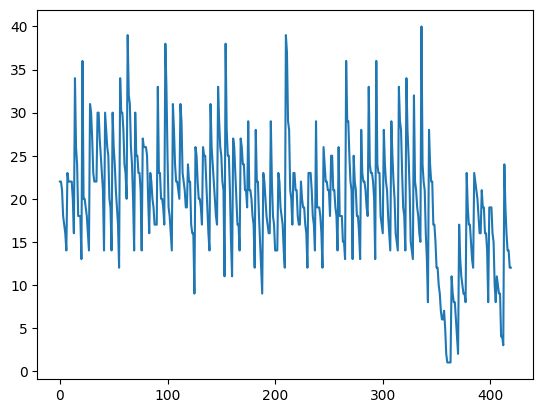

In [186]:
plt.plot(num_accidentes_por_dia_semana18.values)

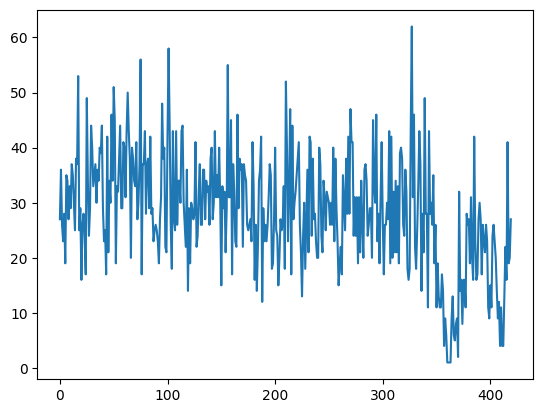

In [187]:
plt.plot(num_victimas_dia_semana18.values)

In [188]:
num_accidentes_por_dia_semana18 = num_accidentes_por_dia_semana18.reset_index()

num_accidentes_por_dia_semana18['FECHA'] = num_accidentes_por_dia_semana18.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana18

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,1,22,2016/1/1
1,2016,1,7,22,2016/1/7
2,2016,1,2,21,2016/1/2
3,2016,1,4,18,2016/1/4
4,2016,1,5,17,2016/1/5
...,...,...,...,...,...
415,2020,12,2,16,2020/12/2
416,2020,12,3,14,2020/12/3
417,2020,12,5,14,2020/12/5
418,2020,12,1,12,2020/12/1


In [189]:
num_victimas_dia_semana18 = num_victimas_dia_semana18.reset_index()

num_victimas_dia_semana18['FECHA'] = num_victimas_dia_semana18.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana18

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,27,2016/1/1
1,2016,1,2,36,2016/1/2
2,2016,1,3,26,2016/1/3
3,2016,1,4,23,2016/1/4
4,2016,1,5,28,2016/1/5
...,...,...,...,...,...
415,2020,12,3,16,2020/12/3
416,2020,12,4,41,2020/12/4
417,2020,12,5,19,2020/12/5
418,2020,12,6,20,2020/12/6


In [190]:
df_provincia18 = num_accidentes_por_dia_semana18.merge(num_victimas_dia_semana18, on = 'FECHA')

df_provincia18 = df_provincia18[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [191]:
df_provincia18.describe()

,count,TOTAL_VICTIMAS_24H
count,420.000000,420.000000
mean,19.930952,28.316667
std,6.779338,10.505696
min,1.000000,1.000000
25%,16.000000,22.000000
50%,20.000000,28.000000
75%,24.000000,36.000000
max,40.000000,62.000000


## PROVINCIA 19 - GUADALAJARA

In [192]:
db_provincia19 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 19]

In [193]:
num_victimas_dia_semana19 = db_provincia19.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana19 = db_provincia19.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

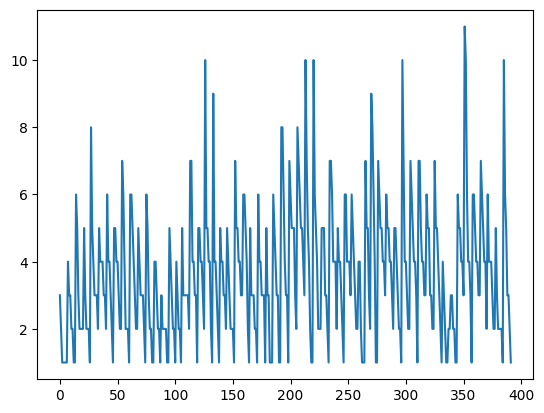

In [194]:
plt.plot(num_accidentes_por_dia_semana19.values)

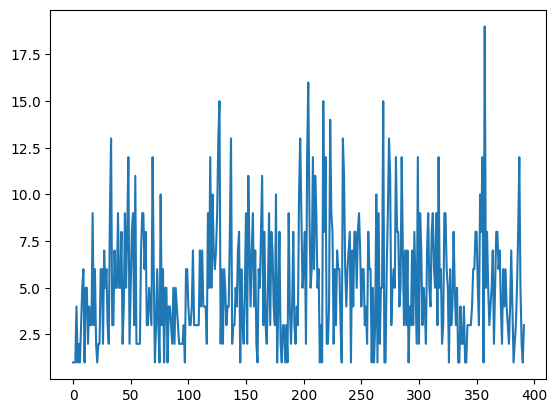

In [195]:
plt.plot(num_victimas_dia_semana19.values)

In [196]:
num_accidentes_por_dia_semana19 = num_accidentes_por_dia_semana19.reset_index()

num_accidentes_por_dia_semana19['FECHA'] = num_accidentes_por_dia_semana19.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana19

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,4,3,2016/1/4
1,2016,1,6,2,2016/1/6
2,2016,1,1,1,2016/1/1
3,2016,1,2,1,2016/1/2
4,2016,1,3,1,2016/1/3
...,...,...,...,...,...
387,2020,12,4,5,2020/12/4
388,2020,12,1,3,2020/12/1
389,2020,12,7,3,2020/12/7
390,2020,12,5,2,2020/12/5


In [197]:
num_victimas_dia_semana19 = num_victimas_dia_semana19.reset_index()

num_victimas_dia_semana19['FECHA'] = num_victimas_dia_semana19.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana19

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,1,2016/1/1
1,2016,1,2,1,2016/1/2
2,2016,1,3,1,2016/1/3
3,2016,1,4,4,2016/1/4
4,2016,1,5,1,2016/1/5
...,...,...,...,...,...
387,2020,12,3,12,2020/12/3
388,2020,12,4,5,2020/12/4
389,2020,12,5,2,2020/12/5
390,2020,12,6,1,2020/12/6


In [198]:
df_provincia19 = num_accidentes_por_dia_semana19.merge(num_victimas_dia_semana19, on = 'FECHA')

df_provincia19 = df_provincia19[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [199]:
df_provincia19.describe()

,count,TOTAL_VICTIMAS_24H
count,392.000000,392.000000
mean,3.640306,5.260204
std,1.962750,3.251385
min,1.000000,1.000000
25%,2.000000,3.000000
50%,3.000000,5.000000
75%,5.000000,7.000000
max,11.000000,19.000000


## PROVINCIA 20 - GUIPÚZCOA

In [200]:
db_provincia20 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 20]

In [201]:
num_victimas_dia_semana20 = db_provincia20.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana20 = db_provincia20.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

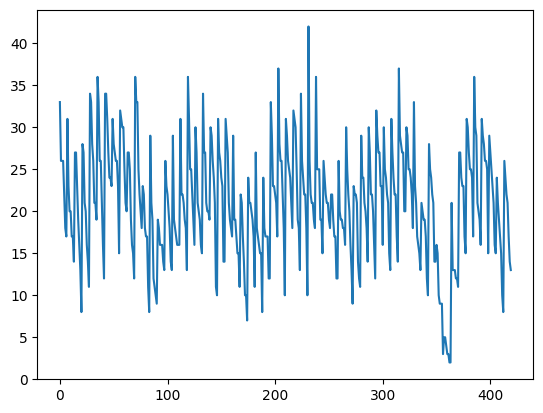

In [202]:
plt.plot(num_accidentes_por_dia_semana20.values)

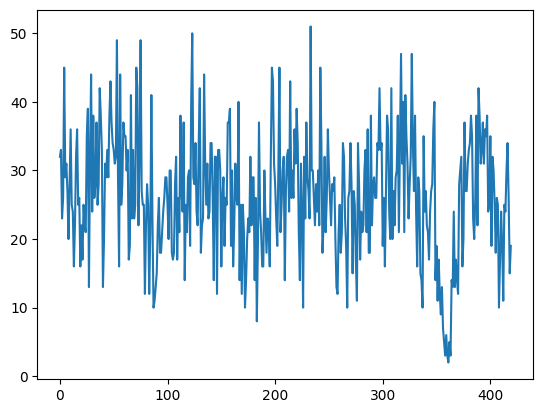

In [203]:
plt.plot(num_victimas_dia_semana20.values)

In [204]:
num_accidentes_por_dia_semana20 = num_accidentes_por_dia_semana20.reset_index()

num_accidentes_por_dia_semana20['FECHA'] = num_accidentes_por_dia_semana20.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana20

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,5,33,2016/1/5
1,2016,1,1,26,2016/1/1
2,2016,1,2,26,2016/1/2
3,2016,1,6,26,2016/1/6
4,2016,1,7,22,2016/1/7
...,...,...,...,...,...
415,2020,12,5,22,2020/12/5
416,2020,12,2,21,2020/12/2
417,2020,12,1,17,2020/12/1
418,2020,12,7,14,2020/12/7


In [205]:
num_victimas_dia_semana20 = num_victimas_dia_semana20.reset_index()

num_victimas_dia_semana20['FECHA'] = num_victimas_dia_semana20.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana20

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,32,2016/1/1
1,2016,1,2,33,2016/1/2
2,2016,1,3,23,2016/1/3
3,2016,1,4,26,2016/1/4
4,2016,1,5,45,2016/1/5
...,...,...,...,...,...
415,2020,12,3,30,2020/12/3
416,2020,12,4,34,2020/12/4
417,2020,12,5,26,2020/12/5
418,2020,12,6,15,2020/12/6


In [206]:
df_provincia20 = num_accidentes_por_dia_semana20.merge(num_victimas_dia_semana20, on = 'FECHA')

df_provincia20 = df_provincia20[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [207]:
df_provincia20.describe()

,count,TOTAL_VICTIMAS_24H
count,420.000000,420.000000
mean,20.935714,26.292857
std,6.864746,8.992304
min,2.000000,2.000000
25%,16.000000,21.000000
50%,21.000000,26.000000
75%,26.000000,32.000000
max,42.000000,51.000000


## PROVINCIA 21 - HUELVA

In [208]:
db_provincia21 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 21]

In [209]:
num_victimas_dia_semana21 = db_provincia21.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana21 = db_provincia21.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

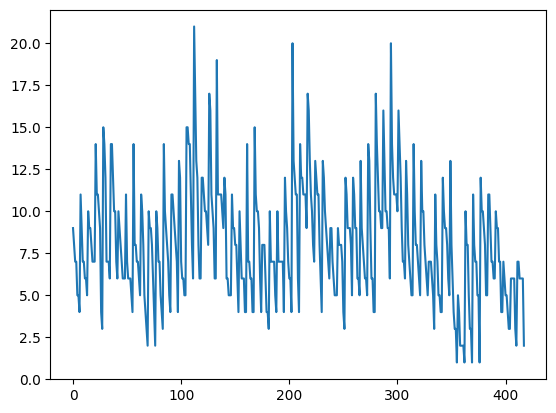

In [210]:
plt.plot(num_accidentes_por_dia_semana21.values)

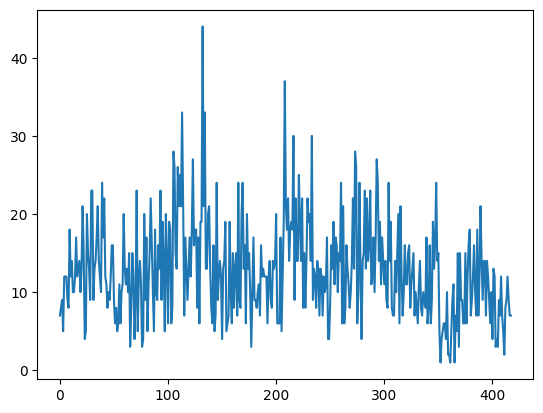

In [211]:
plt.plot(num_victimas_dia_semana21.values)

In [212]:
num_accidentes_por_dia_semana21 = num_accidentes_por_dia_semana21.reset_index()

num_accidentes_por_dia_semana21['FECHA'] = num_accidentes_por_dia_semana21.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana21

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,5,9,2016/1/5
1,2016,1,6,8,2016/1/6
2,2016,1,3,7,2016/1/3
3,2016,1,7,7,2016/1/7
4,2016,1,1,5,2016/1/1
...,...,...,...,...,...
413,2020,12,2,6,2020/12/2
414,2020,12,5,6,2020/12/5
415,2020,12,6,6,2020/12/6
416,2020,12,7,6,2020/12/7


In [213]:
num_victimas_dia_semana21 = num_victimas_dia_semana21.reset_index()

num_victimas_dia_semana21['FECHA'] = num_victimas_dia_semana21.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana21

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,7,2016/1/1
1,2016,1,2,8,2016/1/2
2,2016,1,3,9,2016/1/3
3,2016,1,4,5,2016/1/4
4,2016,1,5,12,2016/1/5
...,...,...,...,...,...
413,2020,12,3,9,2020/12/3
414,2020,12,4,12,2020/12/4
415,2020,12,5,9,2020/12/5
416,2020,12,6,7,2020/12/6


In [214]:
df_provincia21 = num_accidentes_por_dia_semana21.merge(num_victimas_dia_semana21, on = 'FECHA')

df_provincia21 = df_provincia21[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [215]:
df_provincia21.describe()

,count,TOTAL_VICTIMAS_24H
count,418.000000,418.000000
mean,8.100478,12.767943
std,3.438316,6.225670
min,1.000000,1.000000
25%,6.000000,8.000000
50%,8.000000,12.000000
75%,10.000000,16.000000
max,21.000000,44.000000


## PROVINCIA 22 - HUESCA

In [216]:
db_provincia22 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 22]

In [217]:
num_victimas_dia_semana22 = db_provincia22.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana22 = db_provincia22.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

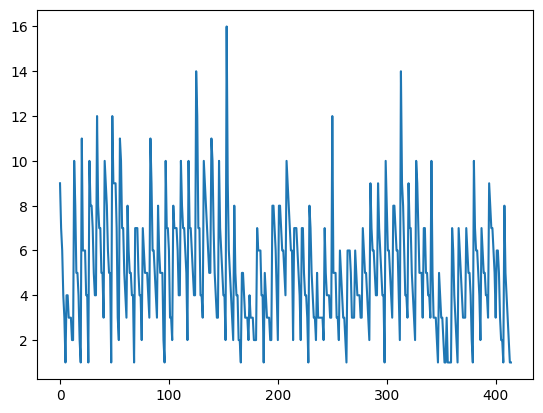

In [218]:
plt.plot(num_accidentes_por_dia_semana22.values)

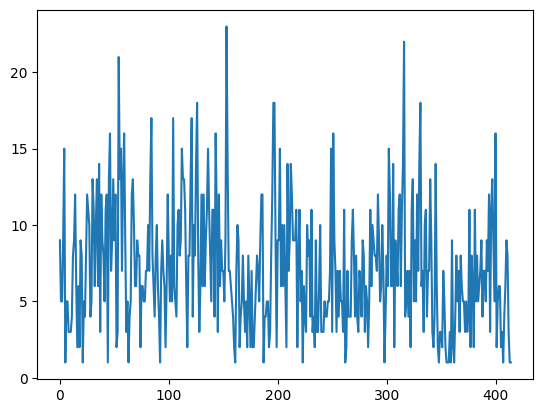

In [219]:
plt.plot(num_victimas_dia_semana22.values)

In [220]:
num_accidentes_por_dia_semana22 = num_accidentes_por_dia_semana22.reset_index()

num_accidentes_por_dia_semana22['FECHA'] = num_accidentes_por_dia_semana22.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana22

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,1,9,2016/1/1
1,2016,1,5,7,2016/1/5
2,2016,1,6,6,2016/1/6
3,2016,1,4,4,2016/1/4
4,2016,1,3,3,2016/1/3
...,...,...,...,...,...
410,2020,12,2,4,2020/12/2
411,2020,12,5,3,2020/12/5
412,2020,12,1,2,2020/12/1
413,2020,12,6,1,2020/12/6


In [221]:
num_victimas_dia_semana22 = num_victimas_dia_semana22.reset_index()

num_victimas_dia_semana22['FECHA'] = num_victimas_dia_semana22.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana22

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,9,2016/1/1
1,2016,1,3,5,2016/1/3
2,2016,1,4,5,2016/1/4
3,2016,1,5,9,2016/1/5
4,2016,1,6,15,2016/1/6
...,...,...,...,...,...
410,2020,12,3,9,2020/12/3
411,2020,12,4,8,2020/12/4
412,2020,12,5,3,2020/12/5
413,2020,12,6,1,2020/12/6


In [222]:
df_provincia22 = num_accidentes_por_dia_semana22.merge(num_victimas_dia_semana22, on = 'FECHA')

df_provincia22 = df_provincia22[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [223]:
df_provincia22.describe()

,count,TOTAL_VICTIMAS_24H
count,415.000000,415.000000
mean,5.113253,7.178313
std,2.556453,4.086269
min,1.000000,1.000000
25%,3.000000,4.000000
50%,5.000000,7.000000
75%,7.000000,9.000000
max,16.000000,23.000000


## PROVINCIA 23 - ISLAS BALEARES

In [224]:
db_provincia23 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 23]

In [225]:
num_victimas_dia_semana23 = db_provincia23.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana23 = db_provincia23.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

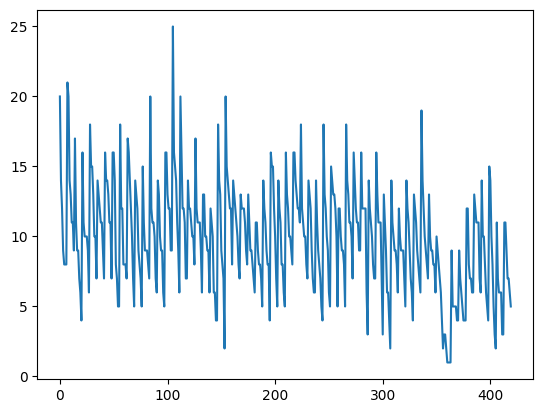

In [226]:
plt.plot(num_accidentes_por_dia_semana23.values)

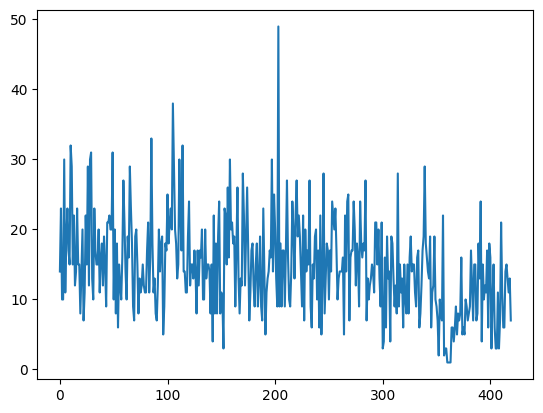

In [227]:
plt.plot(num_victimas_dia_semana23.values)

In [228]:
num_accidentes_por_dia_semana23 = num_accidentes_por_dia_semana23.reset_index()

num_accidentes_por_dia_semana23['FECHA'] = num_accidentes_por_dia_semana23.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana23

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,5,20,2016/1/5
1,2016,1,2,14,2016/1/2
2,2016,1,1,12,2016/1/1
3,2016,1,7,9,2016/1/7
4,2016,1,3,8,2016/1/3
...,...,...,...,...,...
415,2020,12,6,9,2020/12/6
416,2020,12,4,7,2020/12/4
417,2020,12,5,7,2020/12/5
418,2020,12,7,6,2020/12/7


In [229]:
num_victimas_dia_semana23 = num_victimas_dia_semana23.reset_index()

num_victimas_dia_semana23['FECHA'] = num_victimas_dia_semana23.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana23

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,14,2016/1/1
1,2016,1,2,23,2016/1/2
2,2016,1,3,10,2016/1/3
3,2016,1,4,10,2016/1/4
4,2016,1,5,30,2016/1/5
...,...,...,...,...,...
415,2020,12,3,15,2020/12/3
416,2020,12,4,13,2020/12/4
417,2020,12,5,11,2020/12/5
418,2020,12,6,13,2020/12/6


In [230]:
df_provincia23 = num_accidentes_por_dia_semana23.merge(num_victimas_dia_semana23, on = 'FECHA')

df_provincia23 = df_provincia23[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [231]:
df_provincia23.describe()

,count,TOTAL_VICTIMAS_24H
count,420.000000,420.000000
mean,9.904762,14.747619
std,3.843660,6.768107
min,1.000000,1.000000
25%,7.000000,10.000000
50%,10.000000,14.000000
75%,12.000000,19.000000
max,25.000000,49.000000


## PROVINCIA 24 - JAÉN

In [232]:
db_provincia24 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 24]

In [233]:
num_victimas_dia_semana24 = db_provincia24.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana24 = db_provincia24.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

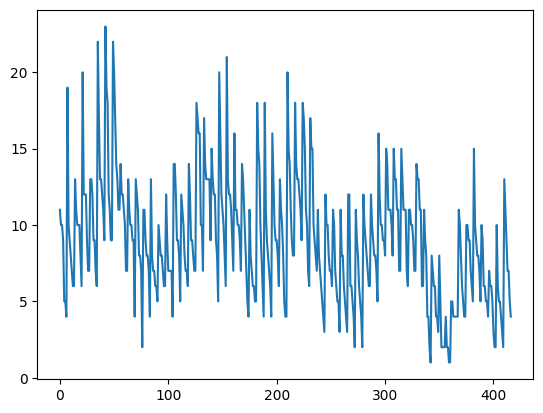

In [234]:
plt.plot(num_accidentes_por_dia_semana24.values)

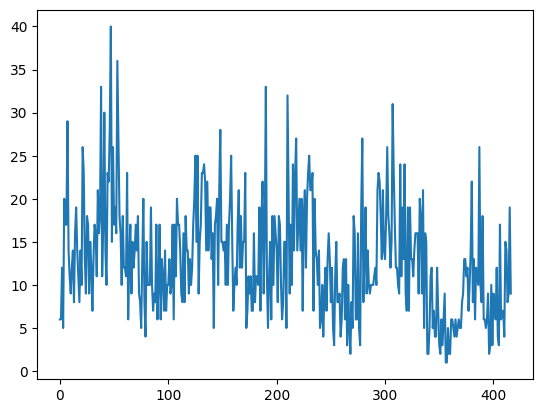

In [235]:
plt.plot(num_victimas_dia_semana24.values)

In [236]:
num_accidentes_por_dia_semana24 = num_accidentes_por_dia_semana24.reset_index()

num_accidentes_por_dia_semana24['FECHA'] = num_accidentes_por_dia_semana24.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana24

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,7,11,2016/1/7
1,2016,1,3,10,2016/1/3
2,2016,1,6,10,2016/1/6
3,2016,1,5,9,2016/1/5
4,2016,1,1,5,2016/1/1
...,...,...,...,...,...
412,2020,12,7,9,2020/12/7
413,2020,12,3,7,2020/12/3
414,2020,12,5,7,2020/12/5
415,2020,12,4,5,2020/12/4


In [237]:
num_victimas_dia_semana24 = num_victimas_dia_semana24.reset_index()

num_victimas_dia_semana24['FECHA'] = num_victimas_dia_semana24.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana24

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,6,2016/1/1
1,2016,1,2,6,2016/1/2
2,2016,1,3,12,2016/1/3
3,2016,1,4,5,2016/1/4
4,2016,1,5,20,2016/1/5
...,...,...,...,...,...
412,2020,12,3,14,2020/12/3
413,2020,12,4,8,2020/12/4
414,2020,12,5,9,2020/12/5
415,2020,12,6,19,2020/12/6


In [238]:
df_provincia24 = num_accidentes_por_dia_semana24.merge(num_victimas_dia_semana24, on = 'FECHA')

df_provincia24 = df_provincia24[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [239]:
df_provincia24.describe()

,count,TOTAL_VICTIMAS_24H
count,417.000000,417.000000
mean,9.095923,12.990408
std,4.033562,6.499993
min,1.000000,1.000000
25%,6.000000,8.000000
50%,9.000000,12.000000
75%,11.000000,17.000000
max,23.000000,40.000000


## PROVINCIA 25 - LA CORUÑA

In [240]:
db_provincia25 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 25]

In [241]:
num_victimas_dia_semana25 = db_provincia25.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana25 = db_provincia25.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

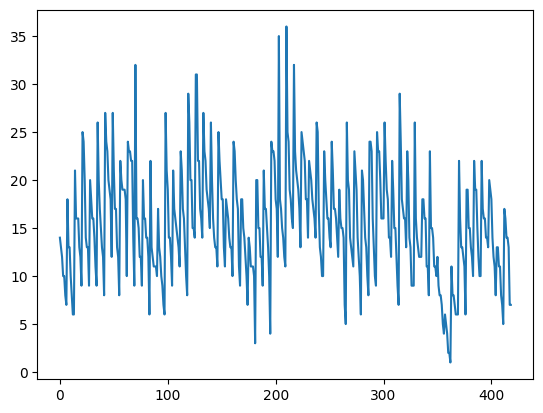

In [242]:
plt.plot(num_accidentes_por_dia_semana25.values)

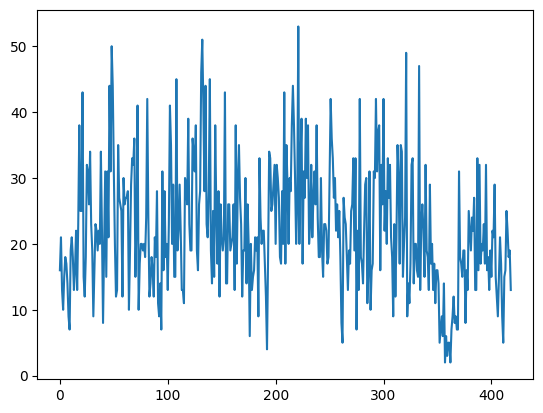

In [243]:
plt.plot(num_victimas_dia_semana25.values)

In [244]:
num_accidentes_por_dia_semana25 = num_accidentes_por_dia_semana25.reset_index()

num_accidentes_por_dia_semana25['FECHA'] = num_accidentes_por_dia_semana25.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana25

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,2,14,2016/1/2
1,2016,1,7,13,2016/1/7
2,2016,1,6,12,2016/1/6
3,2016,1,1,10,2016/1/1
4,2016,1,5,10,2016/1/5
...,...,...,...,...,...
414,2020,12,2,14,2020/12/2
415,2020,12,5,14,2020/12/5
416,2020,12,1,13,2020/12/1
417,2020,12,6,7,2020/12/6


In [245]:
num_victimas_dia_semana25 = num_victimas_dia_semana25.reset_index()

num_victimas_dia_semana25['FECHA'] = num_victimas_dia_semana25.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana25

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,16,2016/1/1
1,2016,1,2,21,2016/1/2
2,2016,1,3,13,2016/1/3
3,2016,1,4,10,2016/1/4
4,2016,1,5,15,2016/1/5
...,...,...,...,...,...
414,2020,12,3,25,2020/12/3
415,2020,12,4,22,2020/12/4
416,2020,12,5,18,2020/12/5
417,2020,12,6,19,2020/12/6


In [246]:
df_provincia25 = num_accidentes_por_dia_semana25.merge(num_victimas_dia_semana25, on = 'FECHA')

df_provincia25 = df_provincia25[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [247]:
df_provincia25.describe()

,count,TOTAL_VICTIMAS_24H
count,419.000000,419.000000
mean,15.477327,22.300716
std,5.770436,9.587935
min,1.000000,2.000000
25%,12.000000,16.000000
50%,15.000000,21.000000
75%,19.000000,29.000000
max,36.000000,53.000000


## PROVINCIA 26 - LA RIOJA

In [248]:
db_provincia26 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 26]

In [249]:
num_victimas_dia_semana26 = db_provincia26.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana26 = db_provincia26.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

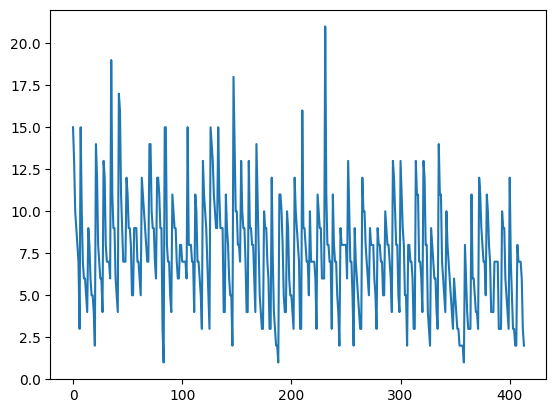

In [250]:
plt.plot(num_accidentes_por_dia_semana26.values)

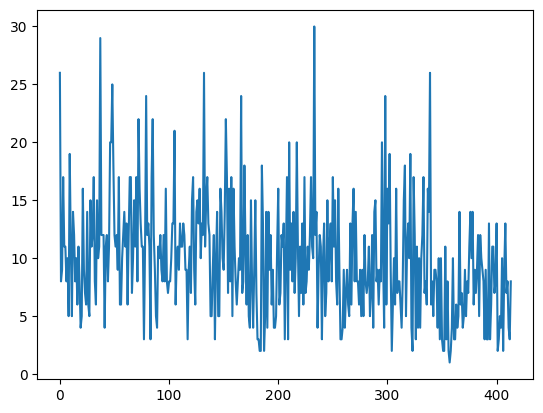

In [251]:
plt.plot(num_victimas_dia_semana26.values)

In [252]:
num_accidentes_por_dia_semana26 = num_accidentes_por_dia_semana26.reset_index()

num_accidentes_por_dia_semana26['FECHA'] = num_accidentes_por_dia_semana26.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana26

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,4,15,2016/1/4
1,2016,1,1,13,2016/1/1
2,2016,1,5,10,2016/1/5
3,2016,1,6,9,2016/1/6
4,2016,1,7,8,2016/1/7
...,...,...,...,...,...
409,2020,12,2,7,2020/12/2
410,2020,12,3,7,2020/12/3
411,2020,12,4,6,2020/12/4
412,2020,12,6,3,2020/12/6


In [253]:
num_victimas_dia_semana26 = num_victimas_dia_semana26.reset_index()

num_victimas_dia_semana26['FECHA'] = num_victimas_dia_semana26.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana26

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,26,2016/1/1
1,2016,1,2,8,2016/1/2
2,2016,1,3,9,2016/1/3
3,2016,1,4,17,2016/1/4
4,2016,1,5,11,2016/1/5
...,...,...,...,...,...
409,2020,12,3,7,2020/12/3
410,2020,12,4,8,2020/12/4
411,2020,12,5,4,2020/12/5
412,2020,12,6,3,2020/12/6


In [254]:
df_provincia26 = num_accidentes_por_dia_semana26.merge(num_victimas_dia_semana26, on = 'FECHA')

df_provincia26 = df_provincia26[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [255]:
df_provincia26.describe()

,count,TOTAL_VICTIMAS_24H
count,414.000000,414.000000
mean,7.434783,9.922705
std,3.311781,5.013668
min,1.000000,1.000000
25%,5.000000,6.000000
50%,7.000000,9.000000
75%,9.000000,13.000000
max,21.000000,30.000000


## PROVINCIA 27 - LAS PALMAS

In [256]:
db_provincia27 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 27]

In [257]:
num_victimas_dia_semana27 = db_provincia27.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana27 = db_provincia27.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

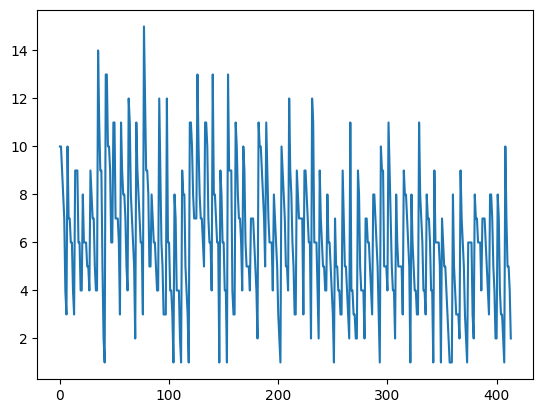

In [258]:
plt.plot(num_accidentes_por_dia_semana27.values)

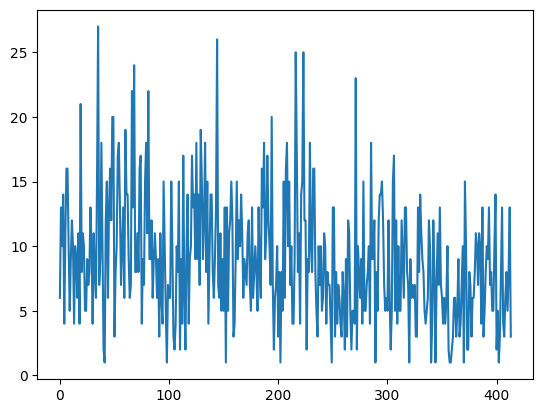

In [259]:
plt.plot(num_victimas_dia_semana27.values)

In [260]:
num_accidentes_por_dia_semana27 = num_accidentes_por_dia_semana27.reset_index()

num_accidentes_por_dia_semana27['FECHA'] = num_accidentes_por_dia_semana27.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana27

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,2,10,2016/1/2
1,2016,1,4,10,2016/1/4
2,2016,1,7,9,2016/1/7
3,2016,1,6,8,2016/1/6
4,2016,1,3,7,2016/1/3
...,...,...,...,...,...
409,2020,12,2,7,2020/12/2
410,2020,12,1,5,2020/12/1
411,2020,12,3,5,2020/12/3
412,2020,12,4,4,2020/12/4


In [261]:
num_victimas_dia_semana27 = num_victimas_dia_semana27.reset_index()

num_victimas_dia_semana27['FECHA'] = num_victimas_dia_semana27.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana27

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,6,2016/1/1
1,2016,1,2,13,2016/1/2
2,2016,1,3,10,2016/1/3
3,2016,1,4,14,2016/1/4
4,2016,1,5,4,2016/1/5
...,...,...,...,...,...
409,2020,12,2,8,2020/12/2
410,2020,12,3,5,2020/12/3
411,2020,12,4,8,2020/12/4
412,2020,12,5,13,2020/12/5


In [262]:
df_provincia27 = num_accidentes_por_dia_semana27.merge(num_victimas_dia_semana27, on = 'FECHA')

df_provincia27 = df_provincia27[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [263]:
df_provincia27.describe()

,count,TOTAL_VICTIMAS_24H
count,414.000000,414.000000
mean,6.096618,8.946860
std,2.752122,4.863968
min,1.000000,1.000000
25%,4.000000,5.000000
50%,6.000000,8.000000
75%,8.000000,12.000000
max,15.000000,27.000000


## PROVINCIA 28 - LEÓN

In [264]:
db_provincia28 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 28]

In [265]:
num_victimas_dia_semana28 = db_provincia28.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana28 = db_provincia28.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

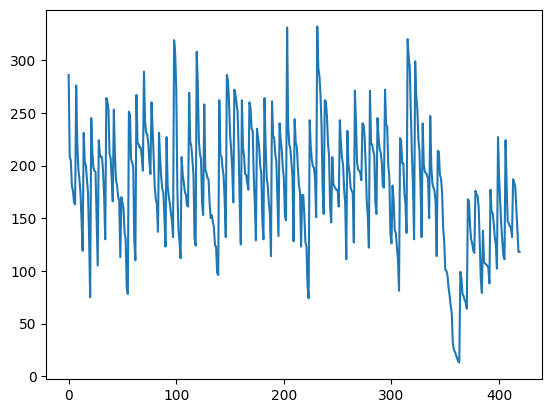

In [266]:
plt.plot(num_accidentes_por_dia_semana28.values)

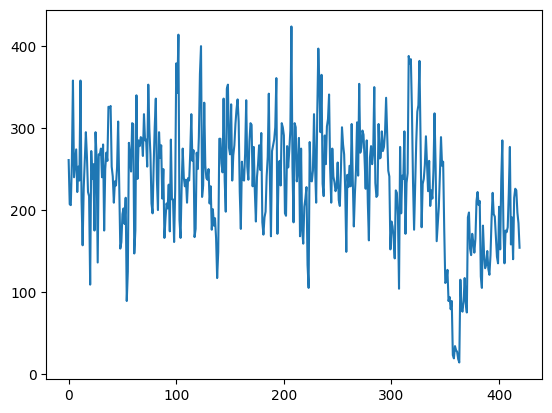

In [267]:
plt.plot(num_victimas_dia_semana28.values)

In [268]:
num_accidentes_por_dia_semana28 = num_accidentes_por_dia_semana28.reset_index()

num_accidentes_por_dia_semana28['FECHA'] = num_accidentes_por_dia_semana28.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana28

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,5,286,2016/1/5
1,2016,1,4,208,2016/1/4
2,2016,1,1,205,2016/1/1
3,2016,1,6,181,2016/1/6
4,2016,1,7,176,2016/1/7
...,...,...,...,...,...
415,2020,12,2,180,2020/12/2
416,2020,12,5,160,2020/12/5
417,2020,12,6,140,2020/12/6
418,2020,12,1,118,2020/12/1


In [269]:
num_victimas_dia_semana28 = num_victimas_dia_semana28.reset_index()

num_victimas_dia_semana28['FECHA'] = num_victimas_dia_semana28.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana28

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,261,2016/1/1
1,2016,1,2,207,2016/1/2
2,2016,1,3,206,2016/1/3
3,2016,1,4,258,2016/1/4
4,2016,1,5,358,2016/1/5
...,...,...,...,...,...
415,2020,12,3,226,2020/12/3
416,2020,12,4,224,2020/12/4
417,2020,12,5,197,2020/12/5
418,2020,12,6,184,2020/12/6


In [270]:
df_provincia28 = num_accidentes_por_dia_semana28.merge(num_victimas_dia_semana28, on = 'FECHA')

df_provincia28 = df_provincia28[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [271]:
df_provincia28.describe()

,count,TOTAL_VICTIMAS_24H
count,420.000000,420.000000
mean,181.938095,233.242857
std,56.139495,69.858419
min,13.000000,14.000000
25%,146.750000,191.000000
50%,185.000000,238.000000
75%,218.000000,278.000000
max,332.000000,424.000000


## PROVINCIA 29 - LÉRIDA

In [272]:
db_provincia29 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 29]

In [273]:
num_victimas_dia_semana29 = db_provincia29.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana29 = db_provincia29.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

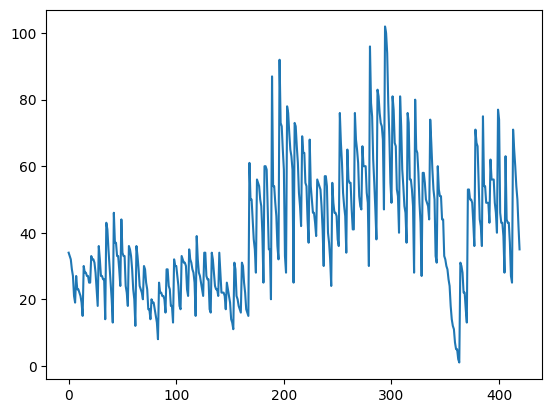

In [274]:
plt.plot(num_accidentes_por_dia_semana29.values)

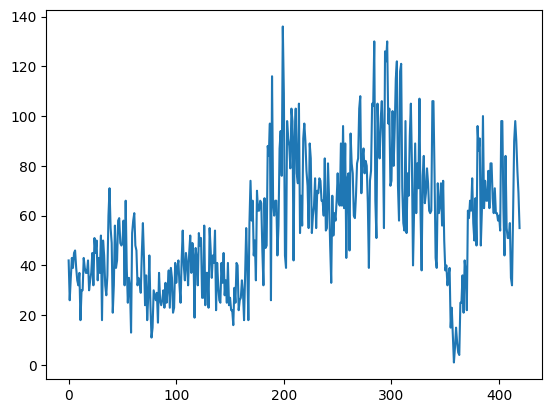

In [275]:
plt.plot(num_victimas_dia_semana29.values)

In [276]:
num_accidentes_por_dia_semana29 = num_accidentes_por_dia_semana29.reset_index()

num_accidentes_por_dia_semana29['FECHA'] = num_accidentes_por_dia_semana29.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana29

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,6,34,2016/1/6
1,2016,1,1,33,2016/1/1
2,2016,1,4,32,2016/1/4
3,2016,1,7,29,2016/1/7
4,2016,1,5,27,2016/1/5
...,...,...,...,...,...
415,2020,12,4,60,2020/12/4
416,2020,12,5,54,2020/12/5
417,2020,12,6,50,2020/12/6
418,2020,12,1,42,2020/12/1


In [277]:
num_victimas_dia_semana29 = num_victimas_dia_semana29.reset_index()

num_victimas_dia_semana29['FECHA'] = num_victimas_dia_semana29.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana29

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,42,2016/1/1
1,2016,1,2,26,2016/1/2
2,2016,1,3,35,2016/1/3
3,2016,1,4,43,2016/1/4
4,2016,1,5,39,2016/1/5
...,...,...,...,...,...
415,2020,12,3,98,2020/12/3
416,2020,12,4,90,2020/12/4
417,2020,12,5,78,2020/12/5
418,2020,12,6,69,2020/12/6


In [278]:
df_provincia29 = num_accidentes_por_dia_semana29.merge(num_victimas_dia_semana29, on = 'FECHA')

df_provincia29 = df_provincia29[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [279]:
df_provincia29.describe()

,count,TOTAL_VICTIMAS_24H
count,420.000000,420.000000
mean,40.630952,56.045238
std,19.121755,25.917813
min,1.000000,1.000000
25%,25.000000,36.000000
50%,36.500000,54.000000
75%,54.000000,73.000000
max,102.000000,136.000000


## PROVINCIA 30 - LUGO

In [280]:
db_provincia30 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 30]

In [281]:
num_victimas_dia_semana30 = db_provincia30.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana30 = db_provincia30.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

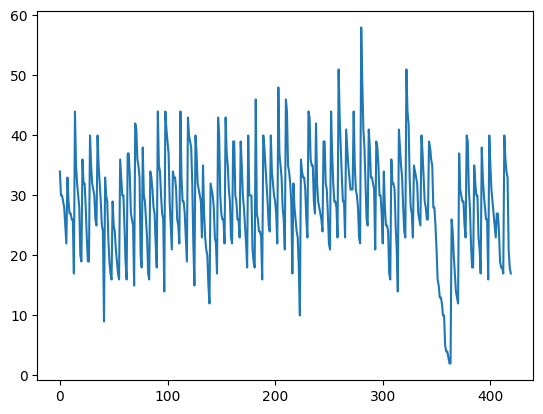

In [282]:
plt.plot(num_accidentes_por_dia_semana30.values)

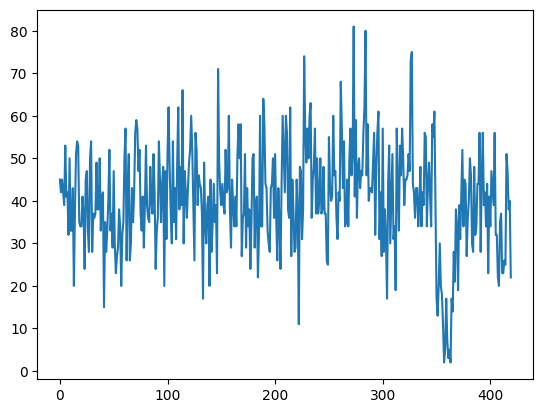

In [283]:
plt.plot(num_victimas_dia_semana30.values)

In [284]:
num_accidentes_por_dia_semana30 = num_accidentes_por_dia_semana30.reset_index()

num_accidentes_por_dia_semana30['FECHA'] = num_accidentes_por_dia_semana30.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana30

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,1,34,2016/1/1
1,2016,1,2,30,2016/1/2
2,2016,1,6,30,2016/1/6
3,2016,1,3,29,2016/1/3
4,2016,1,4,28,2016/1/4
...,...,...,...,...,...
415,2020,12,6,34,2020/12/6
416,2020,12,5,33,2020/12/5
417,2020,12,1,21,2020/12/1
418,2020,12,7,18,2020/12/7


In [285]:
num_victimas_dia_semana30 = num_victimas_dia_semana30.reset_index()

num_victimas_dia_semana30['FECHA'] = num_victimas_dia_semana30.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana30

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,45,2016/1/1
1,2016,1,2,42,2016/1/2
2,2016,1,3,45,2016/1/3
3,2016,1,4,42,2016/1/4
4,2016,1,5,39,2016/1/5
...,...,...,...,...,...
415,2020,12,3,51,2020/12/3
416,2020,12,4,47,2020/12/4
417,2020,12,5,38,2020/12/5
418,2020,12,6,40,2020/12/6


In [286]:
df_provincia30 = num_accidentes_por_dia_semana30.merge(num_victimas_dia_semana30, on = 'FECHA')

df_provincia30 = df_provincia30[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [287]:
df_provincia30.describe()

,count,TOTAL_VICTIMAS_24H
count,420.000000,420.000000
mean,28.647619,40.502381
std,8.497627,12.351553
min,2.000000,2.000000
25%,23.000000,34.000000
50%,29.000000,41.000000
75%,34.000000,48.250000
max,58.000000,81.000000


## PROVINCIA 31 - MADRID

In [288]:
db_provincia31 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 31]

In [289]:
num_victimas_dia_semana31 = db_provincia31.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana31 = db_provincia31.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

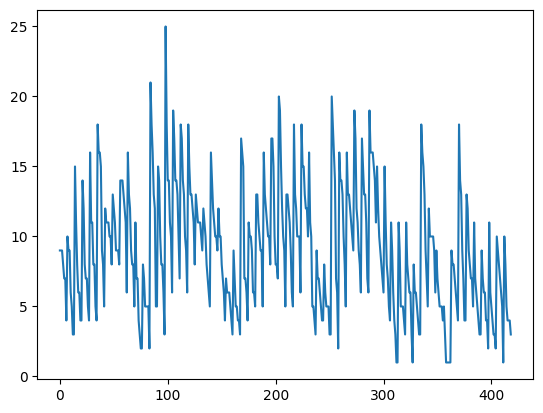

In [290]:
plt.plot(num_accidentes_por_dia_semana31.values)

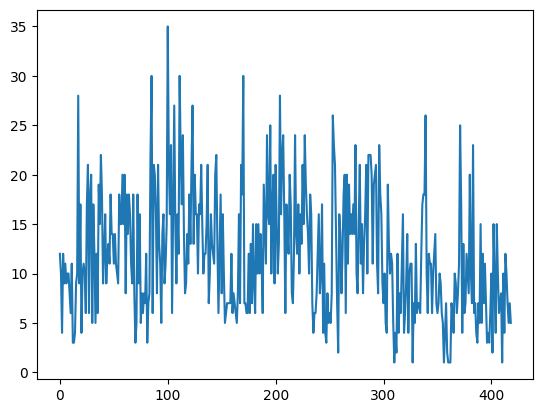

In [291]:
plt.plot(num_victimas_dia_semana31.values)

In [292]:
num_accidentes_por_dia_semana31 = num_accidentes_por_dia_semana31.reset_index()

num_accidentes_por_dia_semana31['FECHA'] = num_accidentes_por_dia_semana31.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana31

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,1,9,2016/1/1
1,2016,1,4,9,2016/1/4
2,2016,1,6,9,2016/1/6
3,2016,1,5,8,2016/1/5
4,2016,1,2,7,2016/1/2
...,...,...,...,...,...
414,2020,12,7,5,2020/12/7
415,2020,12,4,4,2020/12/4
416,2020,12,5,4,2020/12/5
417,2020,12,6,4,2020/12/6


In [293]:
num_victimas_dia_semana31 = num_victimas_dia_semana31.reset_index()

num_victimas_dia_semana31['FECHA'] = num_victimas_dia_semana31.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana31

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,12,2016/1/1
1,2016,1,2,10,2016/1/2
2,2016,1,3,4,2016/1/3
3,2016,1,4,12,2016/1/4
4,2016,1,5,9,2016/1/5
...,...,...,...,...,...
414,2020,12,3,10,2020/12/3
415,2020,12,4,7,2020/12/4
416,2020,12,5,5,2020/12/5
417,2020,12,6,7,2020/12/6


In [294]:
df_provincia31 = num_accidentes_por_dia_semana31.merge(num_victimas_dia_semana31, on = 'FECHA')

df_provincia31 = df_provincia31[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [295]:
df_provincia31.describe()

,count,TOTAL_VICTIMAS_24H
count,419.000000,419.000000
mean,9.052506,11.923628
std,4.427201,6.151896
min,1.000000,1.000000
25%,5.000000,7.000000
50%,9.000000,11.000000
75%,12.000000,16.000000
max,25.000000,35.000000


## PROVINCIA 32 - MÁLAGA

In [296]:
db_provincia32 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 32]

In [297]:
num_victimas_dia_semana32 = db_provincia32.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana32 = db_provincia32.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

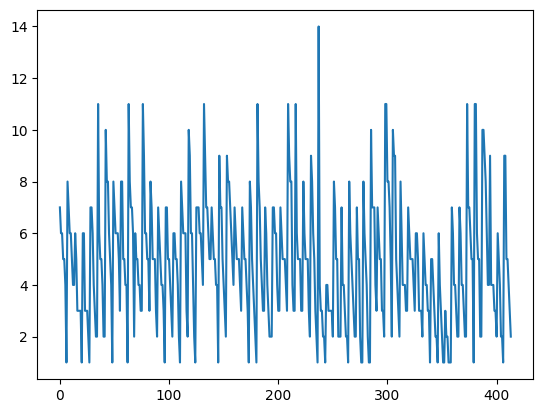

In [298]:
plt.plot(num_accidentes_por_dia_semana32.values)

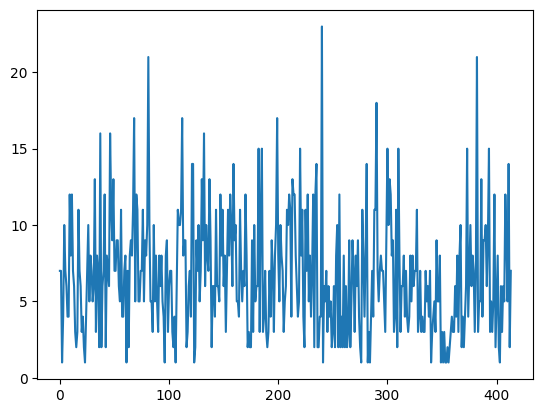

In [299]:
plt.plot(num_victimas_dia_semana32.values)

In [300]:
num_accidentes_por_dia_semana32 = num_accidentes_por_dia_semana32.reset_index()

num_accidentes_por_dia_semana32['FECHA'] = num_accidentes_por_dia_semana32.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana32

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,5,7,2016/1/5
1,2016,1,2,6,2016/1/2
2,2016,1,7,6,2016/1/7
3,2016,1,1,5,2016/1/1
4,2016,1,6,5,2016/1/6
...,...,...,...,...,...
409,2020,12,1,5,2020/12/1
410,2020,12,3,5,2020/12/3
411,2020,12,4,4,2020/12/4
412,2020,12,7,3,2020/12/7


In [301]:
num_victimas_dia_semana32 = num_victimas_dia_semana32.reset_index()

num_victimas_dia_semana32['FECHA'] = num_victimas_dia_semana32.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana32

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,7,2016/1/1
1,2016,1,2,7,2016/1/2
2,2016,1,3,1,2016/1/3
3,2016,1,4,4,2016/1/4
4,2016,1,5,10,2016/1/5
...,...,...,...,...,...
409,2020,12,3,9,2020/12/3
410,2020,12,4,5,2020/12/4
411,2020,12,5,14,2020/12/5
412,2020,12,6,2,2020/12/6


In [302]:
df_provincia32 = num_accidentes_por_dia_semana32.merge(num_victimas_dia_semana32, on = 'FECHA')

df_provincia32 = df_provincia32[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [303]:
df_provincia32.describe()

,count,TOTAL_VICTIMAS_24H
count,414.000000,414.000000
mean,4.859903,6.719807
std,2.445470,3.846793
min,1.000000,1.000000
25%,3.000000,4.000000
50%,5.000000,6.000000
75%,6.000000,9.000000
max,14.000000,23.000000


## PROVINCIA 33 - MURCIA

In [304]:
db_provincia33 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 33]

In [305]:
num_victimas_dia_semana33 = db_provincia33.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana33 = db_provincia33.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

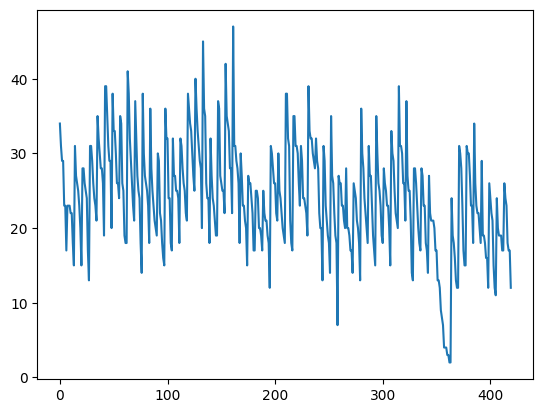

In [306]:
plt.plot(num_accidentes_por_dia_semana33.values)

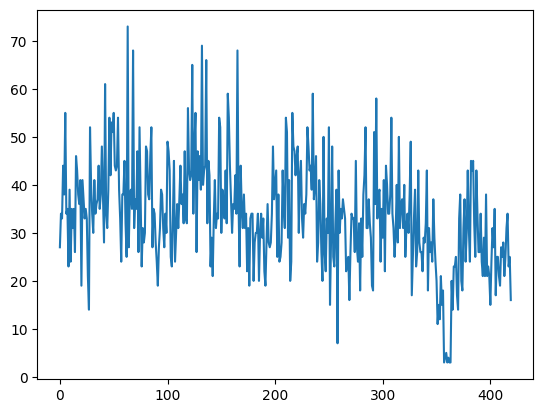

In [307]:
plt.plot(num_victimas_dia_semana33.values)

In [308]:
num_accidentes_por_dia_semana33 = num_accidentes_por_dia_semana33.reset_index()

num_accidentes_por_dia_semana33['FECHA'] = num_accidentes_por_dia_semana33.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana33

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,6,34,2016/1/6
1,2016,1,5,31,2016/1/5
2,2016,1,2,29,2016/1/2
3,2016,1,4,29,2016/1/4
4,2016,1,1,23,2016/1/1
...,...,...,...,...,...
415,2020,12,2,23,2020/12/2
416,2020,12,6,18,2020/12/6
417,2020,12,1,17,2020/12/1
418,2020,12,5,17,2020/12/5


In [309]:
num_victimas_dia_semana33 = num_victimas_dia_semana33.reset_index()

num_victimas_dia_semana33['FECHA'] = num_victimas_dia_semana33.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana33

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,27,2016/1/1
1,2016,1,2,34,2016/1/2
2,2016,1,3,33,2016/1/3
3,2016,1,4,44,2016/1/4
4,2016,1,5,38,2016/1/5
...,...,...,...,...,...
415,2020,12,3,31,2020/12/3
416,2020,12,4,34,2020/12/4
417,2020,12,5,23,2020/12/5
418,2020,12,6,25,2020/12/6


In [310]:
df_provincia33 = num_accidentes_por_dia_semana33.merge(num_victimas_dia_semana33, on = 'FECHA')

df_provincia33 = df_provincia33[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [311]:
df_provincia33.describe()

,count,TOTAL_VICTIMAS_24H
count,420.000000,420.000000
mean,24.135714,33.657143
std,7.166160,11.198857
min,2.000000,3.000000
25%,19.000000,26.000000
50%,24.000000,33.000000
75%,29.000000,40.000000
max,47.000000,73.000000


## PROVINCIA 34 - NAVARRA

In [312]:
db_provincia34 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 34]

In [313]:
num_victimas_dia_semana34 = db_provincia34.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana34 = db_provincia34.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

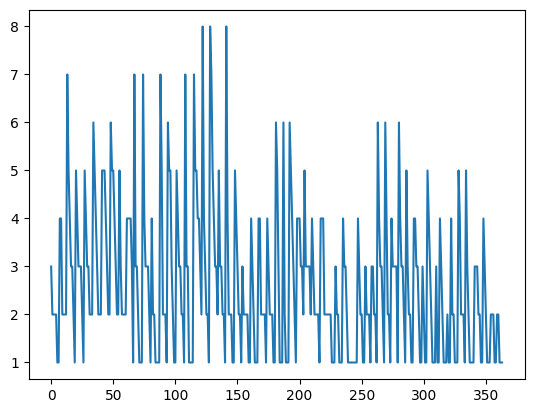

In [314]:
plt.plot(num_accidentes_por_dia_semana34.values)

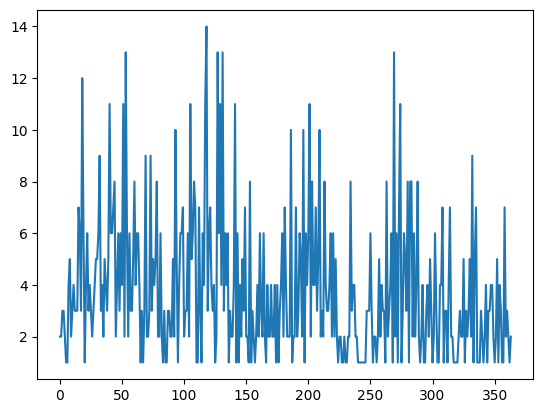

In [315]:
plt.plot(num_victimas_dia_semana34.values)

In [316]:
num_accidentes_por_dia_semana34 = num_accidentes_por_dia_semana34.reset_index()

num_accidentes_por_dia_semana34['FECHA'] = num_accidentes_por_dia_semana34.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana34

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,4,3,2016/1/4
1,2016,1,1,2,2016/1/1
2,2016,1,2,2,2016/1/2
3,2016,1,3,2,2016/1/3
4,2016,1,5,2,2016/1/5
...,...,...,...,...,...
359,2020,12,3,2,2020/12/3
360,2020,12,4,2,2020/12/4
361,2020,12,1,1,2020/12/1
362,2020,12,6,1,2020/12/6


In [317]:
num_victimas_dia_semana34 = num_victimas_dia_semana34.reset_index()

num_victimas_dia_semana34['FECHA'] = num_victimas_dia_semana34.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana34

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,2,2016/1/1
1,2016,1,2,2,2016/1/2
2,2016,1,3,3,2016/1/3
3,2016,1,4,3,2016/1/4
4,2016,1,5,2,2016/1/5
...,...,...,...,...,...
359,2020,12,1,2,2020/12/1
360,2020,12,3,3,2020/12/3
361,2020,12,4,2,2020/12/4
362,2020,12,6,1,2020/12/6


In [318]:
df_provincia34 = num_accidentes_por_dia_semana34.merge(num_victimas_dia_semana34, on = 'FECHA')

df_provincia34 = df_provincia34[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [319]:
df_provincia34.describe()

,count,TOTAL_VICTIMAS_24H
count,364.000000,364.000000
mean,2.631868,3.788462
std,1.545161,2.680771
min,1.000000,1.000000
25%,1.000000,2.000000
50%,2.000000,3.000000
75%,3.250000,5.000000
max,8.000000,14.000000


## PROVINCIA 35 - OURENSE

In [320]:
db_provincia35 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 35]

In [321]:
num_victimas_dia_semana35 = db_provincia35.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana35 = db_provincia35.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

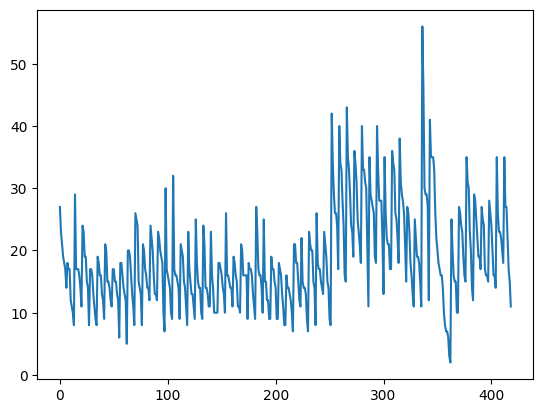

In [322]:
plt.plot(num_accidentes_por_dia_semana35.values)

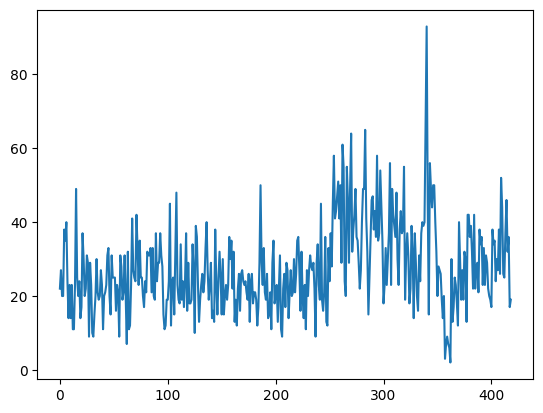

In [323]:
plt.plot(num_victimas_dia_semana35.values)

In [324]:
num_accidentes_por_dia_semana35 = num_accidentes_por_dia_semana35.reset_index()

num_accidentes_por_dia_semana35['FECHA'] = num_accidentes_por_dia_semana35.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana35

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,6,27,2016/1/6
1,2016,1,5,23,2016/1/5
2,2016,1,7,21,2016/1/7
3,2016,1,2,19,2016/1/2
4,2016,1,1,18,2016/1/1
...,...,...,...,...,...
414,2020,12,5,27,2020/12/5
415,2020,12,4,22,2020/12/4
416,2020,12,1,17,2020/12/1
417,2020,12,6,15,2020/12/6


In [325]:
num_victimas_dia_semana35 = num_victimas_dia_semana35.reset_index()

num_victimas_dia_semana35['FECHA'] = num_victimas_dia_semana35.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana35

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,22,2016/1/1
1,2016,1,2,27,2016/1/2
2,2016,1,3,20,2016/1/3
3,2016,1,4,20,2016/1/4
4,2016,1,5,38,2016/1/5
...,...,...,...,...,...
414,2020,12,3,46,2020/12/3
415,2020,12,4,32,2020/12/4
416,2020,12,5,36,2020/12/5
417,2020,12,6,17,2020/12/6


In [326]:
df_provincia35 = num_accidentes_por_dia_semana35.merge(num_victimas_dia_semana35, on = 'FECHA')

df_provincia35 = df_provincia35[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [327]:
df_provincia35.describe()

,count,TOTAL_VICTIMAS_24H
count,419.000000,419.000000
mean,18.701671,27.587112
std,7.793647,11.762560
min,2.000000,2.000000
25%,14.000000,20.000000
50%,17.000000,25.000000
75%,23.000000,35.000000
max,56.000000,93.000000


## PROVINCIA 36 - PALENCIA

In [328]:
db_provincia36 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 36]

In [329]:
num_victimas_dia_semana36 = db_provincia36.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana36 = db_provincia36.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

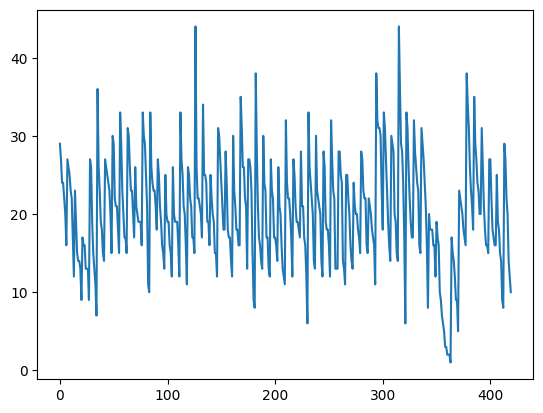

In [330]:
plt.plot(num_accidentes_por_dia_semana36.values)

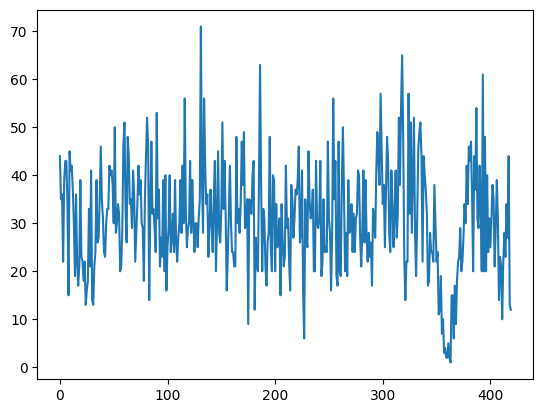

In [331]:
plt.plot(num_victimas_dia_semana36.values)

In [332]:
num_accidentes_por_dia_semana36 = num_accidentes_por_dia_semana36.reset_index()

num_accidentes_por_dia_semana36['FECHA'] = num_accidentes_por_dia_semana36.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana36

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,1,29,2016/1/1
1,2016,1,5,27,2016/1/5
2,2016,1,3,24,2016/1/3
3,2016,1,6,24,2016/1/6
4,2016,1,7,22,2016/1/7
...,...,...,...,...,...
415,2020,12,1,22,2020/12/1
416,2020,12,4,20,2020/12/4
417,2020,12,2,14,2020/12/2
418,2020,12,6,12,2020/12/6


In [333]:
num_victimas_dia_semana36 = num_victimas_dia_semana36.reset_index()

num_victimas_dia_semana36['FECHA'] = num_victimas_dia_semana36.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana36

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,44,2016/1/1
1,2016,1,2,35,2016/1/2
2,2016,1,3,36,2016/1/3
3,2016,1,4,22,2016/1/4
4,2016,1,5,39,2016/1/5
...,...,...,...,...,...
415,2020,12,3,34,2020/12/3
416,2020,12,4,27,2020/12/4
417,2020,12,5,44,2020/12/5
418,2020,12,6,13,2020/12/6


In [334]:
df_provincia36 = num_accidentes_por_dia_semana36.merge(num_victimas_dia_semana36, on = 'FECHA')

df_provincia36 = df_provincia36[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [335]:
df_provincia36.describe()

,count,TOTAL_VICTIMAS_24H
count,420.000000,420.000000
mean,20.330952,30.883333
std,6.933540,11.234672
min,1.000000,1.000000
25%,16.000000,23.000000
50%,20.000000,30.000000
75%,25.000000,39.000000
max,44.000000,71.000000


## PROVINCIA 37 - PONTEVEDRA

In [336]:
db_provincia37 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 37]

In [337]:
num_victimas_dia_semana37 = db_provincia37.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana37 = db_provincia37.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

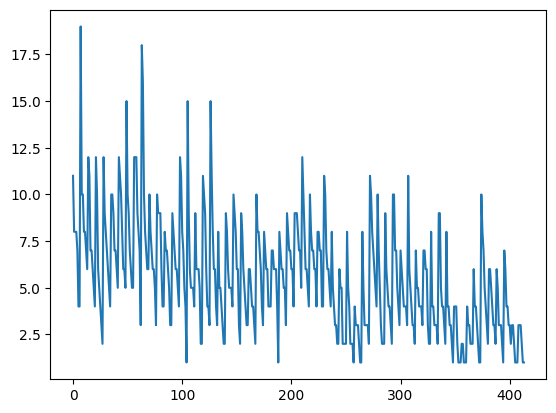

In [338]:
plt.plot(num_accidentes_por_dia_semana37.values)

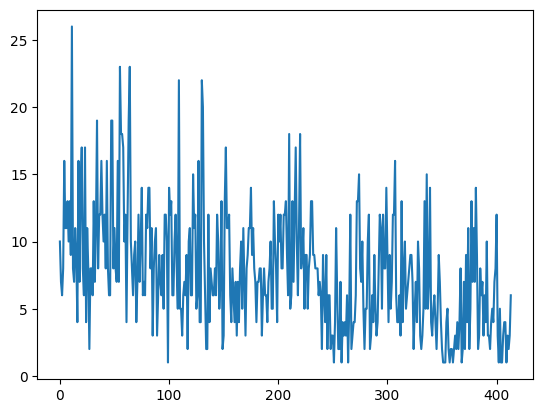

In [339]:
plt.plot(num_victimas_dia_semana37.values)

In [340]:
num_accidentes_por_dia_semana37 = num_accidentes_por_dia_semana37.reset_index()

num_accidentes_por_dia_semana37['FECHA'] = num_accidentes_por_dia_semana37.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana37

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,5,11,2016/1/5
1,2016,1,1,8,2016/1/1
2,2016,1,4,8,2016/1/4
3,2016,1,6,8,2016/1/6
4,2016,1,7,7,2016/1/7
...,...,...,...,...,...
409,2020,12,3,3,2020/12/3
410,2020,12,7,3,2020/12/7
411,2020,12,4,2,2020/12/4
412,2020,12,2,1,2020/12/2


In [341]:
num_victimas_dia_semana37 = num_victimas_dia_semana37.reset_index()

num_victimas_dia_semana37['FECHA'] = num_victimas_dia_semana37.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana37

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,10,2016/1/1
1,2016,1,2,7,2016/1/2
2,2016,1,3,6,2016/1/3
3,2016,1,4,8,2016/1/4
4,2016,1,5,16,2016/1/5
...,...,...,...,...,...
409,2020,12,2,1,2020/12/2
410,2020,12,3,3,2020/12/3
411,2020,12,4,2,2020/12/4
412,2020,12,6,3,2020/12/6


In [342]:
df_provincia37 = num_accidentes_por_dia_semana37.merge(num_victimas_dia_semana37, on = 'FECHA')

df_provincia37 = df_provincia37[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [343]:
df_provincia37.describe()

,count,TOTAL_VICTIMAS_24H
count,414.000000,414.000000
mean,5.594203,7.772947
std,3.014825,4.446795
min,1.000000,1.000000
25%,3.000000,4.000000
50%,5.000000,7.000000
75%,7.000000,11.000000
max,19.000000,26.000000


## PROVINCIA 38 - SALAMANCA

In [344]:
db_provincia38 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 38]

In [345]:
num_victimas_dia_semana38 = db_provincia38.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana38 = db_provincia38.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

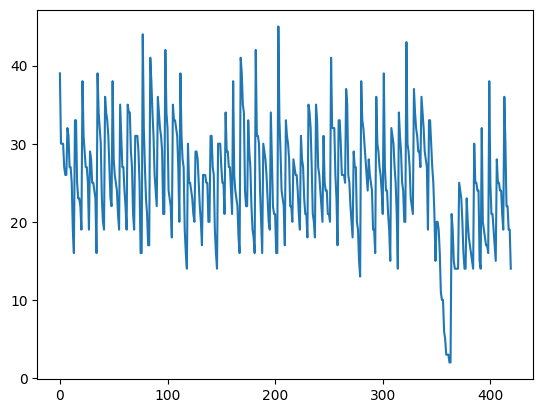

In [346]:
plt.plot(num_accidentes_por_dia_semana38.values)

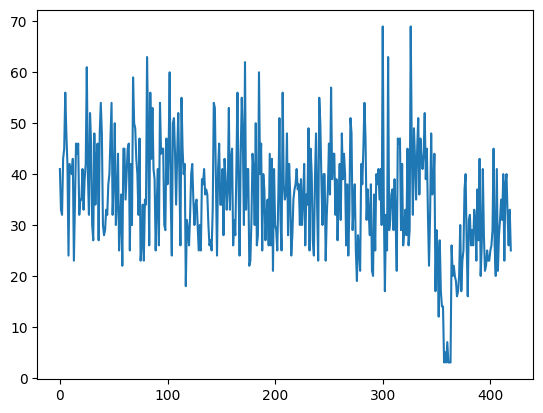

In [347]:
plt.plot(num_victimas_dia_semana38.values)

In [348]:
num_accidentes_por_dia_semana38 = num_accidentes_por_dia_semana38.reset_index()

num_accidentes_por_dia_semana38['FECHA'] = num_accidentes_por_dia_semana38.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana38

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,6,39,2016/1/6
1,2016,1,1,30,2016/1/1
2,2016,1,5,30,2016/1/5
3,2016,1,7,30,2016/1/7
4,2016,1,4,27,2016/1/4
...,...,...,...,...,...
415,2020,12,4,22,2020/12/4
416,2020,12,5,22,2020/12/5
417,2020,12,6,19,2020/12/6
418,2020,12,7,19,2020/12/7


In [349]:
num_victimas_dia_semana38 = num_victimas_dia_semana38.reset_index()

num_victimas_dia_semana38['FECHA'] = num_victimas_dia_semana38.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana38

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,41,2016/1/1
1,2016,1,2,33,2016/1/2
2,2016,1,3,32,2016/1/3
3,2016,1,4,43,2016/1/4
4,2016,1,5,45,2016/1/5
...,...,...,...,...,...
415,2020,12,3,40,2020/12/3
416,2020,12,4,32,2020/12/4
417,2020,12,5,26,2020/12/5
418,2020,12,6,33,2020/12/6


In [350]:
df_provincia38 = num_accidentes_por_dia_semana38.merge(num_victimas_dia_semana38, on = 'FECHA')

df_provincia38 = df_provincia38[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [351]:
df_provincia3.describe()

,count,TOTAL_VICTIMAS_24H
count,420.000000,420.000000
mean,32.709524,45.100000
std,10.158477,14.894842
min,1.000000,1.000000
25%,26.000000,36.000000
50%,33.000000,46.000000
75%,40.000000,55.000000
max,59.000000,84.000000


## PROVINCIA 39 - SANTA CRUZ DE TENERIFE

In [352]:
db_provincia39 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 39]

In [353]:
num_victimas_dia_semana39 = db_provincia39.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana39 = db_provincia39.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

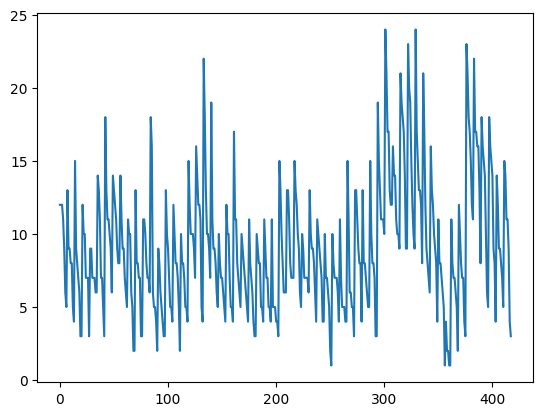

In [354]:
plt.plot(num_accidentes_por_dia_semana39.values)

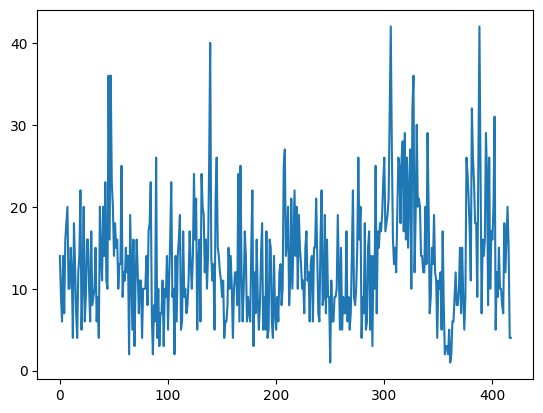

In [355]:
plt.plot(num_victimas_dia_semana39.values)

In [356]:
num_accidentes_por_dia_semana39 = num_accidentes_por_dia_semana39.reset_index()

num_accidentes_por_dia_semana39['FECHA'] = num_accidentes_por_dia_semana39.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana39

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,1,12,2016/1/1
1,2016,1,6,12,2016/1/6
2,2016,1,7,12,2016/1/7
3,2016,1,4,11,2016/1/4
4,2016,1,2,9,2016/1/2
...,...,...,...,...,...
413,2020,12,2,11,2020/12/2
414,2020,12,5,11,2020/12/5
415,2020,12,3,9,2020/12/3
416,2020,12,7,4,2020/12/7


In [357]:
num_victimas_dia_semana39 = num_victimas_dia_semana39.reset_index()

num_victimas_dia_semana39['FECHA'] = num_victimas_dia_semana39.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana39

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,14,2016/1/1
1,2016,1,2,9,2016/1/2
2,2016,1,3,6,2016/1/3
3,2016,1,4,14,2016/1/4
4,2016,1,5,7,2016/1/5
...,...,...,...,...,...
413,2020,12,3,16,2020/12/3
414,2020,12,4,20,2020/12/4
415,2020,12,5,15,2020/12/5
416,2020,12,6,4,2020/12/6


In [358]:
df_provincia39 = num_accidentes_por_dia_semana39.merge(num_victimas_dia_semana39, on = 'FECHA')

df_provincia39 = df_provincia39[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [359]:
df_provincia39.describe()

,count,TOTAL_VICTIMAS_24H
count,418.000000,418.000000
mean,9.095694,13.358852
std,4.446908,7.180805
min,1.000000,1.000000
25%,6.000000,8.000000
50%,8.000000,12.000000
75%,11.000000,17.000000
max,24.000000,42.000000


## PROVINCIA 40 - SEGOVIA

In [360]:
db_provincia40 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 40]

In [361]:
num_victimas_dia_semana40 = db_provincia40.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana40 = db_provincia40.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

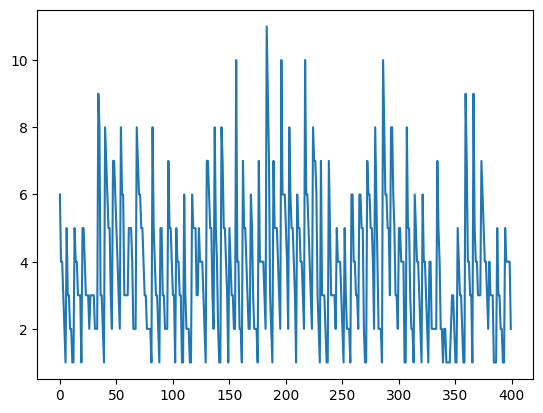

In [362]:
plt.plot(num_accidentes_por_dia_semana40.values)

In [363]:
num_accidentes_por_dia_semana40 = num_accidentes_por_dia_semana40.reset_index()

num_accidentes_por_dia_semana40['FECHA'] = num_accidentes_por_dia_semana40.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana40

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,6,6,2016/1/6
1,2016,1,4,4,2016/1/4
2,2016,1,7,4,2016/1/7
3,2016,1,1,3,2016/1/1
4,2016,1,5,2,2016/1/5
...,...,...,...,...,...
395,2020,12,3,4,2020/12/3
396,2020,12,4,4,2020/12/4
397,2020,12,5,4,2020/12/5
398,2020,12,6,4,2020/12/6


In [364]:
num_victimas_dia_semana40 = num_victimas_dia_semana40.reset_index()

num_victimas_dia_semana40['FECHA'] = num_victimas_dia_semana40.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana40

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,3,2016/1/1
1,2016,1,3,1,2016/1/3
2,2016,1,4,4,2016/1/4
3,2016,1,5,3,2016/1/5
4,2016,1,6,6,2016/1/6
...,...,...,...,...,...
395,2020,12,2,2,2020/12/2
396,2020,12,3,6,2020/12/3
397,2020,12,4,4,2020/12/4
398,2020,12,5,4,2020/12/5


In [365]:
df_provincia40 = num_accidentes_por_dia_semana40.merge(num_victimas_dia_semana40, on = 'FECHA')

df_provincia40 = df_provincia40[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [366]:
df_provincia40.describe()

,count,TOTAL_VICTIMAS_24H
count,400.000000,400.000000
mean,3.790000,5.372500
std,2.054618,3.486277
min,1.000000,1.000000
25%,2.000000,3.000000
50%,3.000000,5.000000
75%,5.000000,7.000000
max,11.000000,33.000000


## PROVINCIA 41 - SEVILLA

In [367]:
db_provincia41 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 41]

In [368]:
num_victimas_dia_semana41 = db_provincia41.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana41 = db_provincia41.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

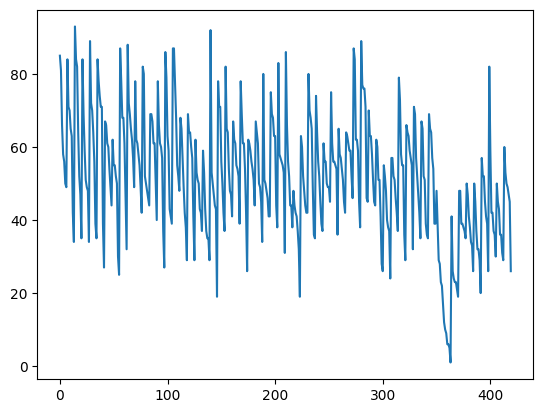

In [369]:
plt.plot(num_accidentes_por_dia_semana41.values)

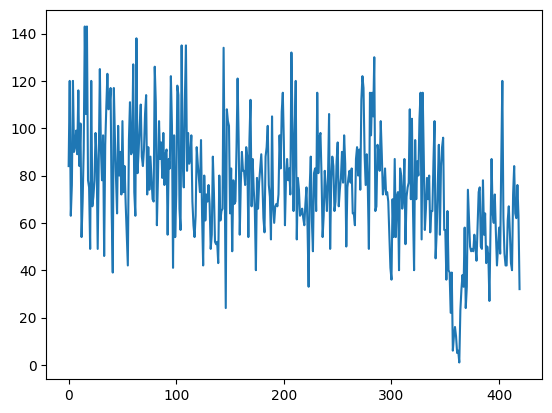

In [370]:
plt.plot(num_victimas_dia_semana41.values)

In [371]:
num_accidentes_por_dia_semana41 = num_accidentes_por_dia_semana41.reset_index()

num_accidentes_por_dia_semana41['FECHA'] = num_accidentes_por_dia_semana41.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana41

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,2,85,2016/1/2
1,2016,1,5,81,2016/1/5
2,2016,1,1,66,2016/1/1
3,2016,1,4,58,2016/1/4
4,2016,1,6,56,2016/1/6
...,...,...,...,...,...
415,2020,12,1,50,2020/12/1
416,2020,12,3,49,2020/12/3
417,2020,12,6,47,2020/12/6
418,2020,12,4,45,2020/12/4


In [372]:
num_victimas_dia_semana41 = num_victimas_dia_semana41.reset_index()

num_victimas_dia_semana41['FECHA'] = num_victimas_dia_semana41.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana41

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,84,2016/1/1
1,2016,1,2,120,2016/1/2
2,2016,1,3,63,2016/1/3
3,2016,1,4,76,2016/1/4
4,2016,1,5,120,2016/1/5
...,...,...,...,...,...
415,2020,12,3,64,2020/12/3
416,2020,12,4,62,2020/12/4
417,2020,12,5,76,2020/12/5
418,2020,12,6,63,2020/12/6


In [373]:
df_provincia41 = num_accidentes_por_dia_semana41.merge(num_victimas_dia_semana41, on = 'FECHA')

df_provincia41 = df_provincia41[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [374]:
df_provincia41.describe()

,count,TOTAL_VICTIMAS_24H
count,420.000000,420.000000
mean,52.069048,75.795238
std,16.539459,24.407264
min,1.000000,1.000000
25%,41.000000,61.000000
50%,52.000000,76.000000
75%,63.000000,90.000000
max,93.000000,143.000000


## PROVINCIA 42 - SORIA

In [375]:
db_provincia42 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 42]

In [376]:
num_victimas_dia_semana42 = db_provincia42.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana42 = db_provincia42.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

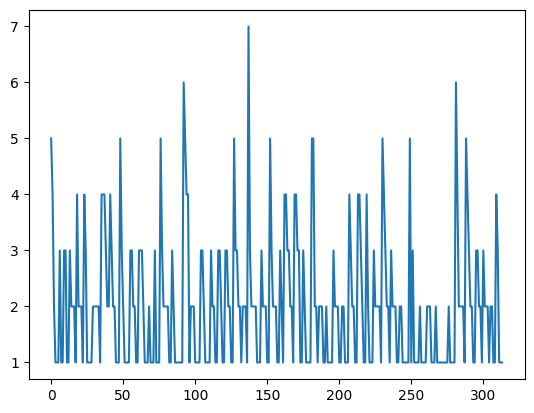

In [377]:
plt.plot(num_accidentes_por_dia_semana42.values)

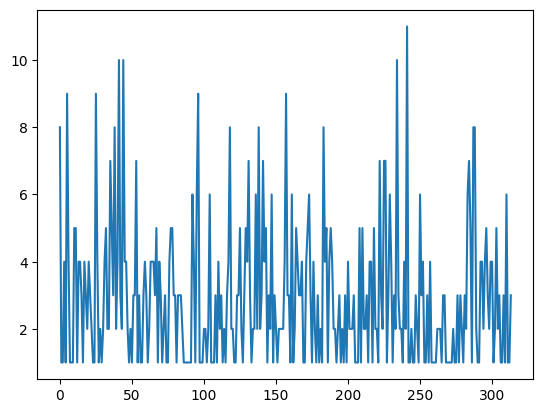

In [378]:
plt.plot(num_victimas_dia_semana42.values)

In [379]:
num_accidentes_por_dia_semana42 = num_accidentes_por_dia_semana42.reset_index()

num_accidentes_por_dia_semana42['FECHA'] = num_accidentes_por_dia_semana42.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana42

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,1,5,2016/1/1
1,2016,1,4,4,2016/1/4
2,2016,1,6,2,2016/1/6
3,2016,1,2,1,2016/1/2
4,2016,1,3,1,2016/1/3
...,...,...,...,...,...
309,2020,12,2,4,2020/12/2
310,2020,12,6,3,2020/12/6
311,2020,12,1,1,2020/12/1
312,2020,12,4,1,2020/12/4


In [380]:
num_victimas_dia_semana42 = num_victimas_dia_semana42.reset_index()

num_victimas_dia_semana42['FECHA'] = num_victimas_dia_semana42.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana42

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,8,2016/1/1
1,2016,1,2,1,2016/1/2
2,2016,1,3,1,2016/1/3
3,2016,1,4,4,2016/1/4
4,2016,1,5,1,2016/1/5
...,...,...,...,...,...
309,2020,12,1,1,2020/12/1
310,2020,12,2,6,2020/12/2
311,2020,12,4,1,2020/12/4
312,2020,12,5,1,2020/12/5


In [381]:
df_provincia42 = num_accidentes_por_dia_semana42.merge(num_victimas_dia_semana42, on = 'FECHA')

df_provincia42 = df_provincia42[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [382]:
df_provincia42.describe()

,count,TOTAL_VICTIMAS_24H
count,314.000000,314.000000
mean,2.000000,2.904459
std,1.158384,2.071512
min,1.000000,1.000000
25%,1.000000,1.000000
50%,2.000000,2.000000
75%,3.000000,4.000000
max,7.000000,11.000000


## PROVINCIA 43 - TARRAGONA

In [383]:
db_provincia43 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 43]

In [384]:
num_victimas_dia_semana43 = db_provincia43.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana43 = db_provincia43.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

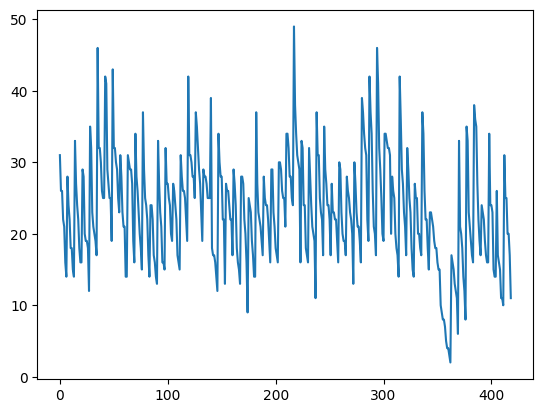

In [385]:
plt.plot(num_accidentes_por_dia_semana43.values)

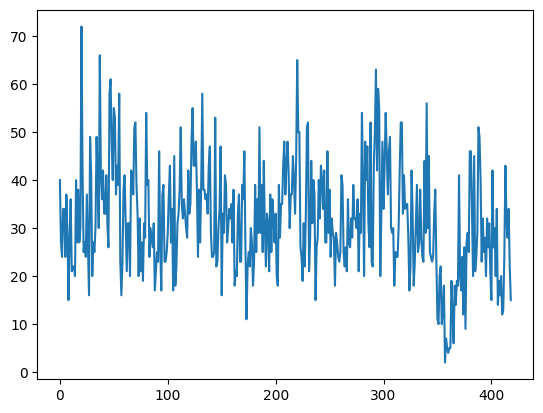

In [386]:
plt.plot(num_victimas_dia_semana43.values)

In [387]:
num_accidentes_por_dia_semana43 = num_accidentes_por_dia_semana43.reset_index()

num_accidentes_por_dia_semana43['FECHA'] = num_accidentes_por_dia_semana43.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana43

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,1,31,2016/1/1
1,2016,1,4,26,2016/1/4
2,2016,1,5,26,2016/1/5
3,2016,1,7,22,2016/1/7
4,2016,1,2,21,2016/1/2
...,...,...,...,...,...
414,2020,12,5,25,2020/12/5
415,2020,12,1,20,2020/12/1
416,2020,12,4,20,2020/12/4
417,2020,12,6,17,2020/12/6


In [388]:
num_victimas_dia_semana43 = num_victimas_dia_semana43.reset_index()

num_victimas_dia_semana43['FECHA'] = num_victimas_dia_semana43.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana43

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,40,2016/1/1
1,2016,1,2,27,2016/1/2
2,2016,1,3,24,2016/1/3
3,2016,1,4,34,2016/1/4
4,2016,1,5,34,2016/1/5
...,...,...,...,...,...
414,2020,12,3,32,2020/12/3
415,2020,12,4,28,2020/12/4
416,2020,12,5,34,2020/12/5
417,2020,12,6,22,2020/12/6


In [389]:
df_provincia43 = num_accidentes_por_dia_semana43.merge(num_victimas_dia_semana43, on = 'FECHA')

df_provincia43 = df_provincia43[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [390]:
df_provincia43.describe()

,count,TOTAL_VICTIMAS_24H
count,419.000000,419.000000
mean,23.341289,31.749403
std,7.591262,11.450192
min,2.000000,2.000000
25%,18.000000,24.000000
50%,23.000000,31.000000
75%,28.000000,39.000000
max,49.000000,72.000000


## PROVINCIA 44 - TERUEL

In [391]:
db_provincia44 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 44]

In [392]:
num_victimas_dia_semana44 = db_provincia44.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana44 = db_provincia44.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

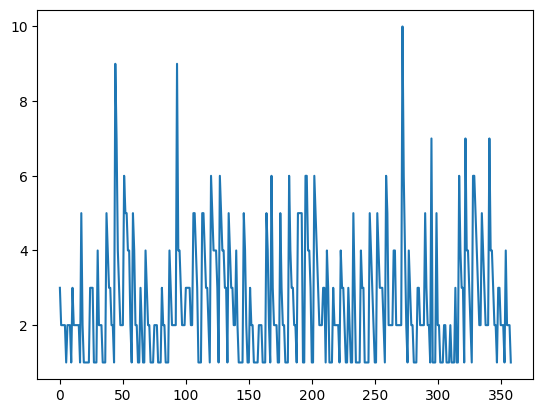

In [393]:
plt.plot(num_accidentes_por_dia_semana44.values)

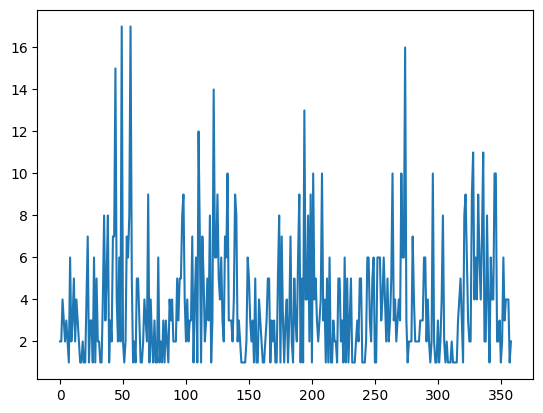

In [394]:
plt.plot(num_victimas_dia_semana44.values)

In [395]:
num_accidentes_por_dia_semana44 = num_accidentes_por_dia_semana44.reset_index()

num_accidentes_por_dia_semana44['FECHA'] = num_accidentes_por_dia_semana44.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana44

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,7,3,2016/1/7
1,2016,1,1,2,2016/1/1
2,2016,1,4,2,2016/1/4
3,2016,1,5,2,2016/1/5
4,2016,1,6,2,2016/1/6
...,...,...,...,...,...
354,2020,12,3,4,2020/12/3
355,2020,12,2,2,2020/12/2
356,2020,12,4,2,2020/12/4
357,2020,12,7,2,2020/12/7


In [396]:
num_victimas_dia_semana44 = num_victimas_dia_semana44.reset_index()

num_victimas_dia_semana44['FECHA'] = num_victimas_dia_semana44.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana44

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,2,2016/1/1
1,2016,1,2,2,2016/1/2
2,2016,1,4,4,2016/1/4
3,2016,1,5,3,2016/1/5
4,2016,1,6,2,2016/1/6
...,...,...,...,...,...
354,2020,12,2,4,2020/12/2
355,2020,12,3,4,2020/12/3
356,2020,12,4,4,2020/12/4
357,2020,12,5,1,2020/12/5


In [397]:
df_provincia44 = num_accidentes_por_dia_semana44.merge(num_victimas_dia_semana44, on = 'FECHA')

df_provincia4 = df_provincia4[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [398]:
df_provincia44.describe()

,ANYO_x,MES_x,DIA_SEMANA_x,count,ANYO_y,MES_y,DIA_SEMANA_y,TOTAL_VICTIMAS_24H
count,359.000000,359.000000,359.000000,359.000000,359.000000,359.000000,359.000000,359.000000
mean,2017.927577,6.534819,4.136490,2.607242,2017.927577,6.534819,4.136490,3.749304
std,1.400436,3.364834,1.993223,1.602740,1.400436,3.364834,1.993223,2.866410
min,2016.000000,1.000000,1.000000,1.000000,2016.000000,1.000000,1.000000,1.000000
25%,2017.000000,4.000000,2.000000,1.000000,2017.000000,4.000000,2.000000,2.000000
50%,2018.000000,7.000000,4.000000,2.000000,2018.000000,7.000000,4.000000,3.000000
75%,2019.000000,9.000000,6.000000,3.500000,2019.000000,9.000000,6.000000,5.000000
max,2020.000000,12.000000,7.000000,10.000000,2020.000000,12.000000,7.000000,17.000000


## PROVINCIA 45 - TOLEDO

In [399]:
db_provincia45 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 45]

In [400]:
num_victimas_dia_semana45 = db_provincia45.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana45 = db_provincia45.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

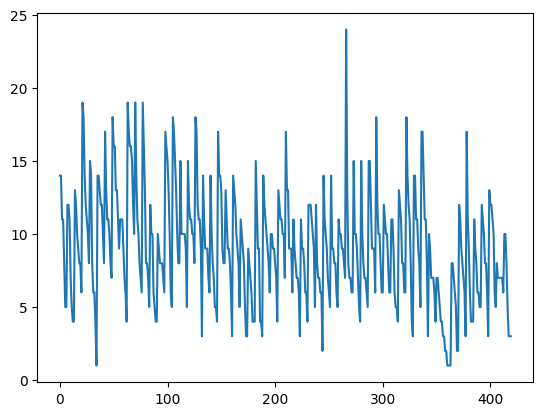

In [401]:
plt.plot(num_accidentes_por_dia_semana45.values)

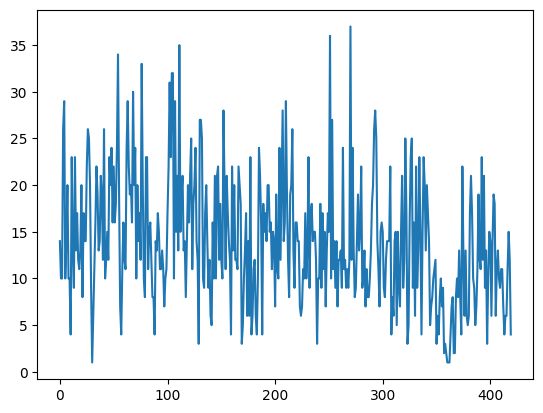

In [402]:
plt.plot(num_victimas_dia_semana45.values)

In [403]:
num_accidentes_por_dia_semana45 = num_accidentes_por_dia_semana45.reset_index()

num_accidentes_por_dia_semana45['FECHA'] = num_accidentes_por_dia_semana45.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana45

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,4,14,2016/1/4
1,2016,1,5,14,2016/1/5
2,2016,1,1,11,2016/1/1
3,2016,1,7,11,2016/1/7
4,2016,1,2,8,2016/1/2
...,...,...,...,...,...
415,2020,12,6,8,2020/12/6
416,2020,12,3,5,2020/12/3
417,2020,12,1,3,2020/12/1
418,2020,12,2,3,2020/12/2


In [404]:
num_victimas_dia_semana45 = num_victimas_dia_semana45.reset_index()

num_victimas_dia_semana45['FECHA'] = num_victimas_dia_semana45.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana45

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,14,2016/1/1
1,2016,1,2,10,2016/1/2
2,2016,1,3,10,2016/1/3
3,2016,1,4,26,2016/1/4
4,2016,1,5,29,2016/1/5
...,...,...,...,...,...
415,2020,12,3,6,2020/12/3
416,2020,12,4,11,2020/12/4
417,2020,12,5,15,2020/12/5
418,2020,12,6,12,2020/12/6


In [405]:
df_provincia45 = num_accidentes_por_dia_semana45.merge(num_victimas_dia_semana45, on = 'FECHA')

df_provincia45 = df_provincia45[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [406]:
df_provincia4.describe()

,count,TOTAL_VICTIMAS_24H
count,420.000000,420.000000
mean,12.023810,18.776190
std,5.078797,8.480634
min,1.000000,1.000000
25%,8.000000,13.000000
50%,12.000000,18.000000
75%,15.000000,24.000000
max,34.000000,45.000000


## PROVINCIA 46 - VALENCIA

In [407]:
db_provincia46 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 46]

In [408]:
num_victimas_dia_semana46 = db_provincia46.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana46 = db_provincia46.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

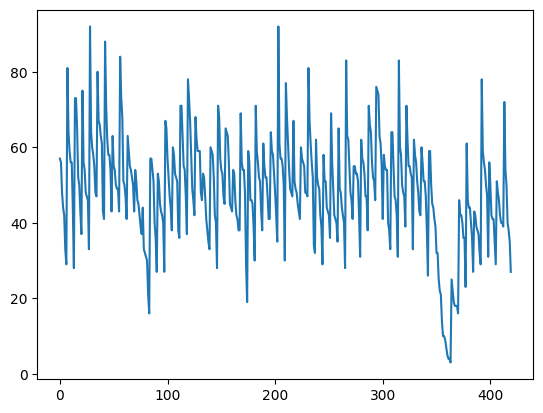

In [409]:
plt.plot(num_accidentes_por_dia_semana46.values)

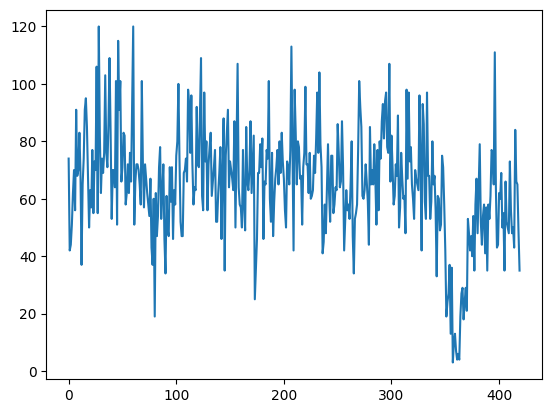

In [410]:
plt.plot(num_victimas_dia_semana46.values)

In [411]:
num_accidentes_por_dia_semana46 = num_accidentes_por_dia_semana46.reset_index()

num_accidentes_por_dia_semana46['FECHA'] = num_accidentes_por_dia_semana46.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana46

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,1,57,2016/1/1
1,2016,1,6,56,2016/1/6
2,2016,1,5,48,2016/1/5
3,2016,1,7,44,2016/1/7
4,2016,1,4,42,2016/1/4
...,...,...,...,...,...
415,2020,12,4,50,2020/12/4
416,2020,12,6,40,2020/12/6
417,2020,12,2,38,2020/12/2
418,2020,12,1,35,2020/12/1


In [412]:
num_victimas_dia_semana46 = num_victimas_dia_semana46.reset_index()

num_victimas_dia_semana46['FECHA'] = num_victimas_dia_semana46.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana46

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,74,2016/1/1
1,2016,1,2,42,2016/1/2
2,2016,1,3,44,2016/1/3
3,2016,1,4,51,2016/1/4
4,2016,1,5,62,2016/1/5
...,...,...,...,...,...
415,2020,12,3,84,2020/12/3
416,2020,12,4,66,2020/12/4
417,2020,12,5,65,2020/12/5
418,2020,12,6,49,2020/12/6


In [413]:
df_provincia46 = num_accidentes_por_dia_semana46.merge(num_victimas_dia_semana46, on = 'FECHA')

df_provincia46 = df_provincia46[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [414]:
df_provincia46.describe()

,count,TOTAL_VICTIMAS_24H
count,420.000000,420.000000
mean,48.757143,65.076190
std,14.352969,19.417383
min,3.000000,3.000000
25%,41.000000,54.000000
50%,49.000000,66.000000
75%,57.000000,76.000000
max,92.000000,120.000000


## PROVINCIA 47 - VALLADOLID

In [415]:
db_provincia47 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 47]

In [416]:
num_victimas_dia_semana47 = db_provincia47.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana47 = db_provincia47.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

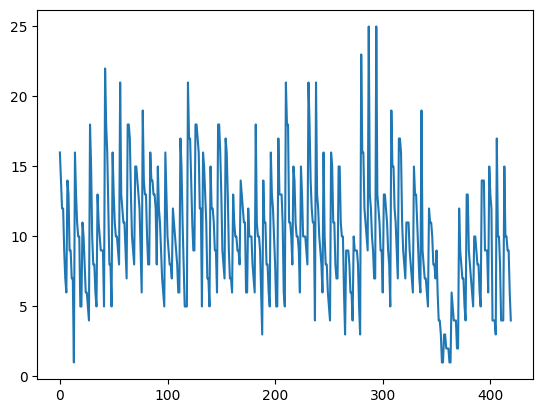

In [417]:
plt.plot(num_accidentes_por_dia_semana47.values)

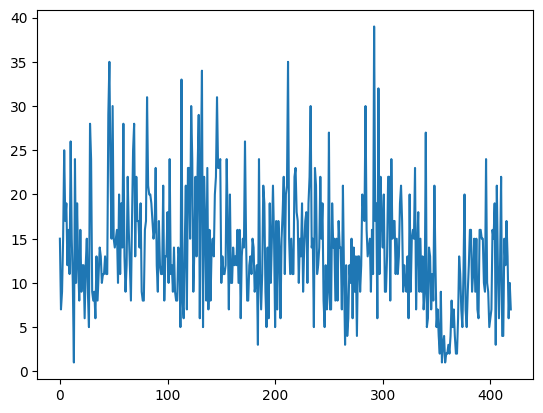

In [418]:
plt.plot(num_victimas_dia_semana47.values)

In [419]:
num_accidentes_por_dia_semana47 = num_accidentes_por_dia_semana47.reset_index()

num_accidentes_por_dia_semana47['FECHA'] = num_accidentes_por_dia_semana47.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana47

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,5,16,2016/1/5
1,2016,1,6,14,2016/1/6
2,2016,1,1,12,2016/1/1
3,2016,1,7,12,2016/1/7
4,2016,1,4,9,2016/1/4
...,...,...,...,...,...
415,2020,12,4,10,2020/12/4
416,2020,12,2,9,2020/12/2
417,2020,12,6,9,2020/12/6
418,2020,12,7,6,2020/12/7


In [420]:
num_victimas_dia_semana47 = num_victimas_dia_semana47.reset_index()

num_victimas_dia_semana47['FECHA'] = num_victimas_dia_semana47.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana47

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,15,2016/1/1
1,2016,1,2,7,2016/1/2
2,2016,1,3,9,2016/1/3
3,2016,1,4,15,2016/1/4
4,2016,1,5,25,2016/1/5
...,...,...,...,...,...
415,2020,12,3,17,2020/12/3
416,2020,12,4,13,2020/12/4
417,2020,12,5,6,2020/12/5
418,2020,12,6,10,2020/12/6


In [421]:
df_provincia47 = num_accidentes_por_dia_semana47.merge(num_victimas_dia_semana47, on = 'FECHA')

df_provincia47 = df_provincia47[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [422]:
df_provincia47.describe()

,count,TOTAL_VICTIMAS_24H
count,420.000000,420.000000
mean,10.080952,13.702381
std,4.300538,6.643998
min,1.000000,1.000000
25%,7.000000,9.000000
50%,10.000000,13.000000
75%,13.000000,17.000000
max,25.000000,39.000000


## PROVINCIA 48 - VIZCAYA

In [423]:
db_provincia48 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 48]

In [424]:
num_victimas_dia_semana48 = db_provincia48.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana48 = db_provincia48.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

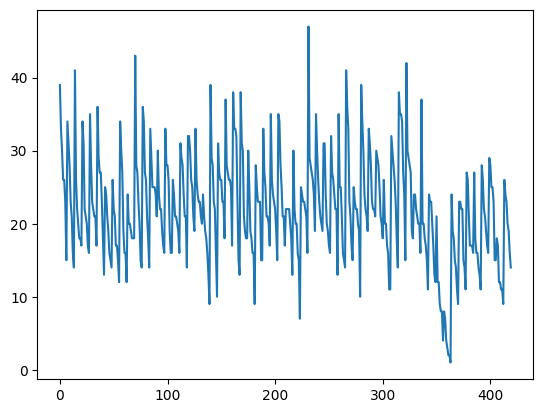

In [425]:
plt.plot(num_accidentes_por_dia_semana48.values)

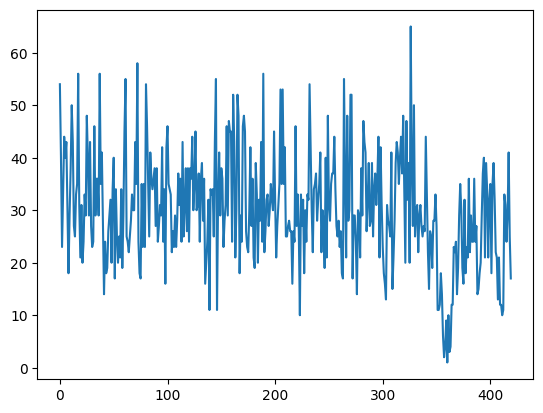

In [426]:
plt.plot(num_victimas_dia_semana48.values)

In [427]:
num_accidentes_por_dia_semana48 = num_accidentes_por_dia_semana48.reset_index()

num_accidentes_por_dia_semana48['FECHA'] = num_accidentes_por_dia_semana48.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana48

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,1,39,2016/1/1
1,2016,1,5,33,2016/1/5
2,2016,1,2,30,2016/1/2
3,2016,1,4,26,2016/1/4
4,2016,1,6,26,2016/1/6
...,...,...,...,...,...
415,2020,12,5,23,2020/12/5
416,2020,12,4,20,2020/12/4
417,2020,12,6,19,2020/12/6
418,2020,12,3,16,2020/12/3


In [428]:
num_victimas_dia_semana48 = num_victimas_dia_semana48.reset_index()

num_victimas_dia_semana48['FECHA'] = num_victimas_dia_semana48.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana48

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,54,2016/1/1
1,2016,1,2,40,2016/1/2
2,2016,1,3,23,2016/1/3
3,2016,1,4,34,2016/1/4
4,2016,1,5,44,2016/1/5
...,...,...,...,...,...
415,2020,12,3,24,2020/12/3
416,2020,12,4,29,2020/12/4
417,2020,12,5,41,2020/12/5
418,2020,12,6,25,2020/12/6


In [429]:
df_provincia48 = num_accidentes_por_dia_semana48.merge(num_victimas_dia_semana48, on = 'FECHA')

df_provincia48 = df_provincia48[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [430]:
df_provincia48.describe()

,count,TOTAL_VICTIMAS_24H
count,420.000000,420.000000
mean,22.097619,30.178571
std,7.274862,10.551794
min,1.000000,1.000000
25%,17.000000,24.000000
50%,22.000000,29.000000
75%,26.000000,36.000000
max,47.000000,65.000000


## PROVINCIA 49 - ZAMORA

In [431]:
db_provincia49 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 49]

In [432]:
num_victimas_dia_semana49 = db_provincia49.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana49 = db_provincia49.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

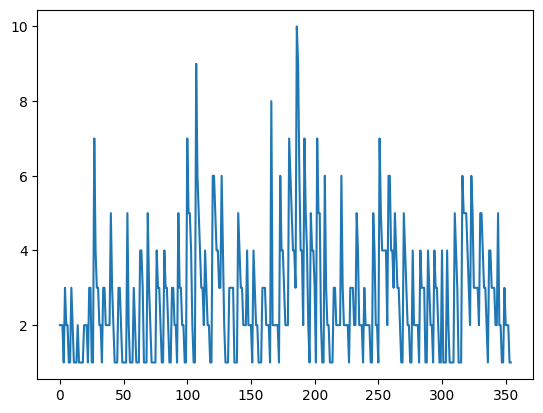

In [433]:
plt.plot(num_accidentes_por_dia_semana49.values)

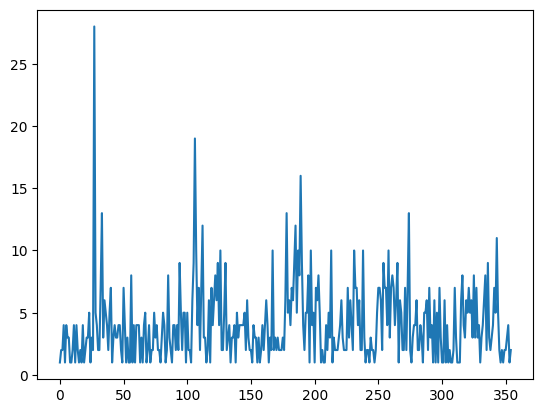

In [434]:
plt.plot(num_victimas_dia_semana49.values)

In [435]:
num_accidentes_por_dia_semana49 = num_accidentes_por_dia_semana49.reset_index()

num_accidentes_por_dia_semana49['FECHA'] = num_accidentes_por_dia_semana49.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana49

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,3,2,2016/1/3
1,2016,1,4,2,2016/1/4
2,2016,1,5,2,2016/1/5
3,2016,1,2,1,2016/1/2
4,2016,2,3,3,2016/2/3
...,...,...,...,...,...
350,2020,12,2,2,2020/12/2
351,2020,12,4,2,2020/12/4
352,2020,12,7,2,2020/12/7
353,2020,12,1,1,2020/12/1


In [436]:
num_victimas_dia_semana49 = num_victimas_dia_semana49.reset_index()

num_victimas_dia_semana49['FECHA'] = num_victimas_dia_semana49.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana49

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,2,1,2016/1/2
1,2016,1,3,2,2016/1/3
2,2016,1,4,2,2016/1/4
3,2016,1,5,4,2016/1/5
4,2016,2,2,1,2016/2/2
...,...,...,...,...,...
350,2020,12,2,2,2020/12/2
351,2020,12,4,3,2020/12/4
352,2020,12,5,4,2020/12/5
353,2020,12,6,1,2020/12/6


In [437]:
df_provincia49 = num_accidentes_por_dia_semana49.merge(num_victimas_dia_semana49, on = 'FECHA')

df_provincia49 = df_provincia49[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [438]:
df_provincia49.describe()

,count,TOTAL_VICTIMAS_24H
count,355.000000,355.000000
mean,2.718310,4.042254
std,1.643194,3.063530
min,1.000000,1.000000
25%,1.000000,2.000000
50%,2.000000,3.000000
75%,4.000000,5.000000
max,10.000000,28.000000


## PROVINCIA 50 - ZARAGOZA

In [439]:
db_provincia50 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 50]

In [440]:
num_victimas_dia_semana50 = db_provincia50.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana50 = db_provincia50.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

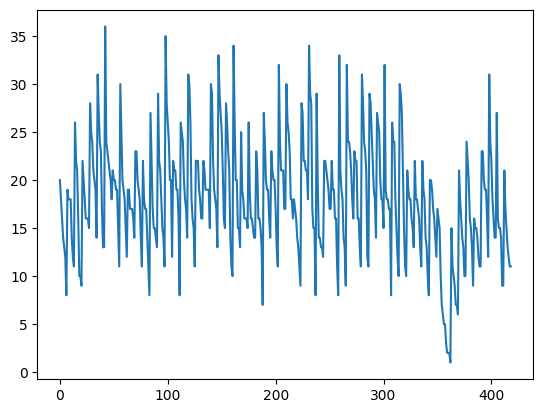

In [441]:
plt.plot(num_accidentes_por_dia_semana50.values)

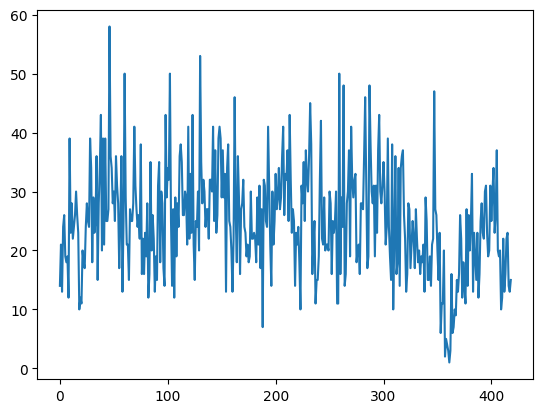

In [442]:
plt.plot(num_victimas_dia_semana50.values)

In [443]:
num_accidentes_por_dia_semana50 = num_accidentes_por_dia_semana50.reset_index()

num_accidentes_por_dia_semana50['FECHA'] = num_accidentes_por_dia_semana50.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana50

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,5,20,2016/1/5
1,2016,1,2,18,2016/1/2
2,2016,1,4,16,2016/1/4
3,2016,1,7,14,2016/1/7
4,2016,1,6,13,2016/1/6
...,...,...,...,...,...
414,2020,12,2,15,2020/12/2
415,2020,12,5,13,2020/12/5
416,2020,12,7,12,2020/12/7
417,2020,12,1,11,2020/12/1


In [444]:
num_victimas_dia_semana50 = num_victimas_dia_semana50.reset_index()

num_victimas_dia_semana50['FECHA'] = num_victimas_dia_semana50.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana50

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,14,2016/1/1
1,2016,1,2,21,2016/1/2
2,2016,1,3,13,2016/1/3
3,2016,1,4,24,2016/1/4
4,2016,1,5,26,2016/1/5
...,...,...,...,...,...
414,2020,12,3,22,2020/12/3
415,2020,12,4,23,2020/12/4
416,2020,12,5,14,2020/12/5
417,2020,12,6,13,2020/12/6


In [445]:
df_provincia50 = num_accidentes_por_dia_semana50.merge(num_victimas_dia_semana50, on = 'FECHA')

df_provincia50 = df_provincia50[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [446]:
df_provincia50.describe()

,count,TOTAL_VICTIMAS_24H
count,419.000000,419.000000
mean,18.105012,24.894988
std,6.042390,9.183064
min,1.000000,1.000000
25%,14.000000,19.000000
50%,18.000000,25.000000
75%,22.000000,30.000000
max,36.000000,58.000000


## PROVINCIA 51 - CEUTA

In [447]:
db_provincia51 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 51]

In [448]:
num_victimas_dia_semana51 = db_provincia51.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana51 = db_provincia51.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

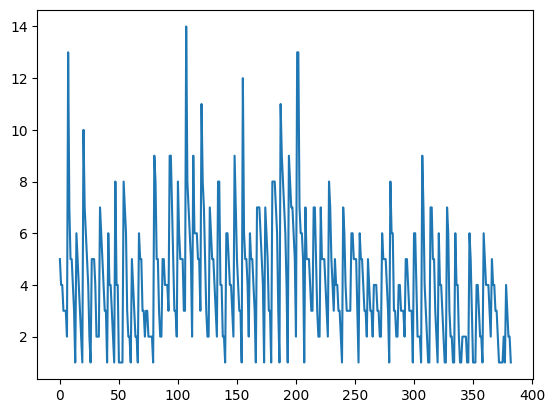

In [449]:
plt.plot(num_accidentes_por_dia_semana51.values)

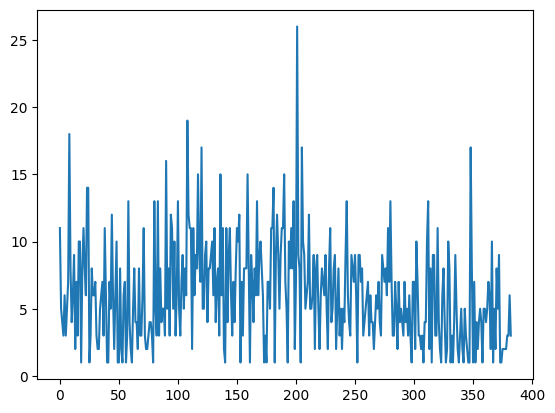

In [450]:
plt.plot(num_victimas_dia_semana51.values)

In [451]:
num_accidentes_por_dia_semana51 = num_accidentes_por_dia_semana51.reset_index()

num_accidentes_por_dia_semana51['FECHA'] = num_accidentes_por_dia_semana51.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana51

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,1,5,2016/1/1
1,2016,1,3,4,2016/1/3
2,2016,1,5,4,2016/1/5
3,2016,1,2,3,2016/1/2
4,2016,1,4,3,2016/1/4
...,...,...,...,...,...
378,2020,12,5,4,2020/12/5
379,2020,12,4,3,2020/12/4
380,2020,12,2,2,2020/12/2
381,2020,12,6,2,2020/12/6


In [452]:
num_victimas_dia_semana51 = num_victimas_dia_semana51.reset_index()

num_victimas_dia_semana51['FECHA'] = num_victimas_dia_semana51.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana51

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,11,2016/1/1
1,2016,1,2,5,2016/1/2
2,2016,1,3,4,2016/1/3
3,2016,1,4,3,2016/1/4
4,2016,1,5,6,2016/1/5
...,...,...,...,...,...
378,2020,12,1,2,2020/12/1
379,2020,12,2,3,2020/12/2
380,2020,12,4,3,2020/12/4
381,2020,12,5,6,2020/12/5


In [453]:
df_provincia51 = num_accidentes_por_dia_semana51.merge(num_victimas_dia_semana51, on = 'FECHA')

df_provincia51 = df_provincia51[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [454]:
df_provincia51.describe()

,count,TOTAL_VICTIMAS_24H
count,383.000000,383.000000
mean,4.159269,6.130548
std,2.372003,3.805298
min,1.000000,1.000000
25%,2.000000,3.000000
50%,4.000000,6.000000
75%,5.500000,8.000000
max,14.000000,26.000000


## PROVINCIA 52 - MELILLA

In [455]:
db_provincia52 = db_combinadas[db_combinadas['COD_PROVINCIA'] == 52]

In [456]:
num_victimas_dia_semana52 = db_provincia52.groupby(['ANYO', 'MES', 'DIA_SEMANA'])['TOTAL_VICTIMAS_24H'].sum()
num_accidentes_por_dia_semana52 = db_provincia52.groupby(['ANYO', 'MES'])['DIA_SEMANA'].value_counts()

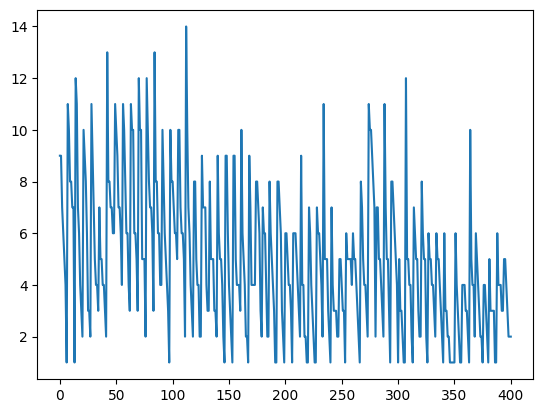

In [457]:
plt.plot(num_accidentes_por_dia_semana52.values)

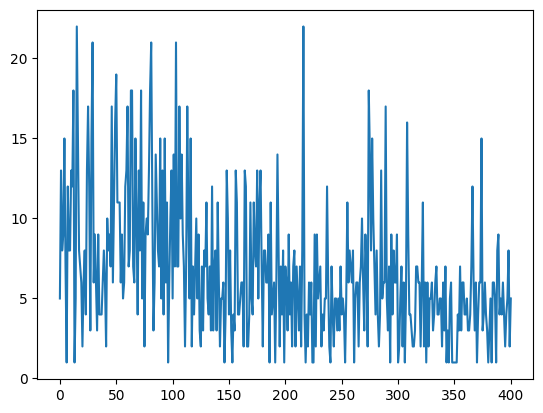

In [458]:
plt.plot(num_victimas_dia_semana52.values)

In [459]:
num_accidentes_por_dia_semana52 = num_accidentes_por_dia_semana52.reset_index()

num_accidentes_por_dia_semana52['FECHA'] = num_accidentes_por_dia_semana52.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_accidentes_por_dia_semana52

,ANYO,MES,DIA_SEMANA,count,FECHA
0,2016,1,2,9,2016/1/2
1,2016,1,5,9,2016/1/5
2,2016,1,3,7,2016/1/3
3,2016,1,4,6,2016/1/4
4,2016,1,1,5,2016/1/1
...,...,...,...,...,...
396,2020,12,3,4,2020/12/3
397,2020,12,1,3,2020/12/1
398,2020,12,2,2,2020/12/2
399,2020,12,6,2,2020/12/6


In [460]:
num_victimas_dia_semana52 = num_victimas_dia_semana52.reset_index()

num_victimas_dia_semana52['FECHA'] = num_victimas_dia_semana52.apply(lambda row: str(row['ANYO']) + '/' + str(row['MES']) + '/' + str(row['DIA_SEMANA']), axis = 1)

num_victimas_dia_semana52

,ANYO,MES,DIA_SEMANA,TOTAL_VICTIMAS_24H,FECHA
0,2016,1,1,5,2016/1/1
1,2016,1,2,13,2016/1/2
2,2016,1,3,8,2016/1/3
3,2016,1,4,9,2016/1/4
4,2016,1,5,15,2016/1/5
...,...,...,...,...,...
396,2020,12,3,4,2020/12/3
397,2020,12,4,5,2020/12/4
398,2020,12,5,8,2020/12/5
399,2020,12,6,2,2020/12/6


In [461]:
df_provincia52 = num_accidentes_por_dia_semana52.merge(num_victimas_dia_semana52, on = 'FECHA')

df_provincia52 = df_provincia52[['FECHA', 'count', 'TOTAL_VICTIMAS_24H']]

In [462]:
df_provincia52.describe()

,count,TOTAL_VICTIMAS_24H
count,401.000000,401.000000
mean,4.977556,6.723192
std,2.768031,4.357830
min,1.000000,1.000000
25%,3.000000,4.000000
50%,5.000000,6.000000
75%,7.000000,9.000000
max,14.000000,22.000000


Para poder calcular la probabilidad de accidentalidad necesitamos inferir los datos del número de vehículos que va a circular X día del año. Para ello se van a realizar los siguientes modelos.

# MODELO SERIES TEMPORALES

## PARA INTENSIDAD MEDIA DE VEHÍCULOS

### Preparación del Dataset

In [463]:
inicio = datetime(2016,1,1)

lista_fechas = [inicio + relativedelta(months=+d) for d in range(0,48)]
print(lista_fechas)

[datetime.datetime(2016, 1, 1, 0, 0), datetime.datetime(2016, 2, 1, 0, 0), datetime.datetime(2016, 3, 1, 0, 0), datetime.datetime(2016, 4, 1, 0, 0), datetime.datetime(2016, 5, 1, 0, 0), datetime.datetime(2016, 6, 1, 0, 0), datetime.datetime(2016, 7, 1, 0, 0), datetime.datetime(2016, 8, 1, 0, 0), datetime.datetime(2016, 9, 1, 0, 0), datetime.datetime(2016, 10, 1, 0, 0), datetime.datetime(2016, 11, 1, 0, 0), datetime.datetime(2016, 12, 1, 0, 0), datetime.datetime(2017, 1, 1, 0, 0), datetime.datetime(2017, 2, 1, 0, 0), datetime.datetime(2017, 3, 1, 0, 0), datetime.datetime(2017, 4, 1, 0, 0), datetime.datetime(2017, 5, 1, 0, 0), datetime.datetime(2017, 6, 1, 0, 0), datetime.datetime(2017, 7, 1, 0, 0), datetime.datetime(2017, 8, 1, 0, 0), datetime.datetime(2017, 9, 1, 0, 0), datetime.datetime(2017, 10, 1, 0, 0), datetime.datetime(2017, 11, 1, 0, 0), datetime.datetime(2017, 12, 1, 0, 0), datetime.datetime(2018, 1, 1, 0, 0), datetime.datetime(2018, 2, 1, 0, 0), datetime.datetime(2018, 3, 1, 0

In [464]:
promedio_diario['FECHA'] = lista_fechas

In [465]:
promedio_diario

,Año,Periodo,Intensidad media diaria de vehículos,FECHA
12,2016,Enero,13959.0,2016-01-01
13,2016,Febrero,14855.0,2016-02-01
14,2016,Marzo,17717.0,2016-03-01
15,2016,Abril,16462.0,2016-04-01
16,2016,Mayo,17503.0,2016-05-01
17,2016,Junio,18907.0,2016-06-01
18,2016,Julio,24691.0,2016-07-01
19,2016,Agosto,26511.0,2016-08-01
20,2016,Septiembre,19320.0,2016-09-01
21,2016,Octubre,17426.0,2016-10-01


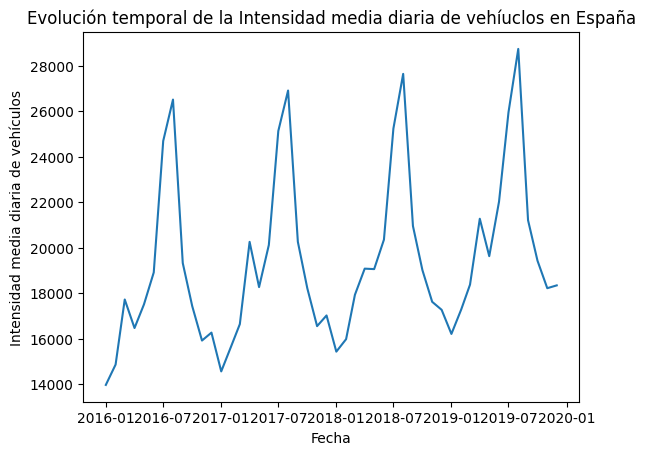

In [466]:
promedio_diario['Intensidad media diaria de vehículos'] = promedio_diario['Intensidad media diaria de vehículos'].astype('int')
plt.plot( promedio_diario['FECHA'], promedio_diario['Intensidad media diaria de vehículos'])
plt.title('Evolución temporal de la Intensidad media diaria de vehíuclos en España')
plt.xlabel('Fecha')
plt.ylabel('Intensidad media diaria de vehículos')

plt.show()

Como se puede observar en la gráfica, hay estacionalidad cada año, por lo que vamos a hacer una descomposición estacional con el modelo aditivo.

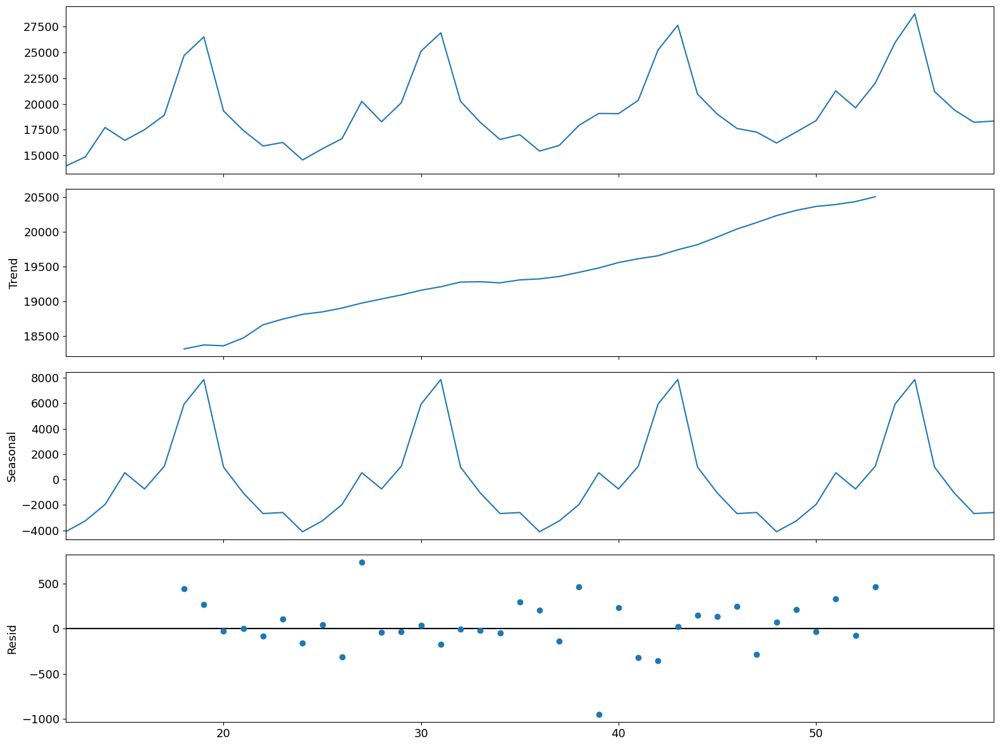

In [467]:
Additive_decomposition= seasonal_decompose(promedio_diario[['Intensidad media diaria de vehículos']], model='additive', period=12)
plt.rc("figure", figsize=(16, 12))
plt.rc("font", size=13)
fig = Additive_decomposition.plot()

Se puede ver que la tendencia va aumentando, es decir, conforme pasan los años, se esperan cada vez más vehículos.

También se puede observar que existe la estacionalidad ya que vemos un patrón que se repite.

Por último, existe aleatoreidad ya que no hay un patrón reconocible en los residuales.

### SUAVIZADO EXPONENCIAL

Se trata de quitar la estacionalidad al modelo para ver cómo se comporta. Al ser un modelo 'aditivo', podemos pensarlo como interferencia de ondas, es decir, si sumamos cresta con cresta, la onda aumenta, mientras que si sumamos cresta con valle, se anulan. Por esto, la estacionalidad ajustada es quitarle a los datos originales, la estacionalidad, por lo que se terminan anulando al rededor de la tendencia (en la gráfica de arriba, se resta la primera gráfica con la tercera).

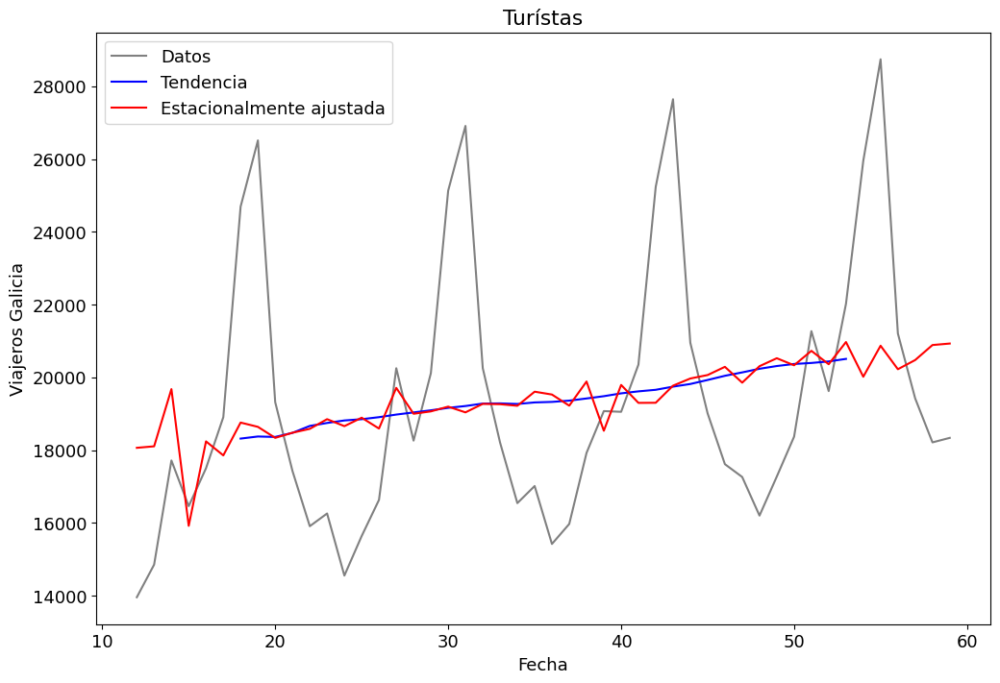

In [468]:
S_Ajustada_Est = promedio_diario['Intensidad media diaria de vehículos']-Additive_decomposition.seasonal
# Graficar la serie original y las componentes
plt.figure(figsize=(12, 8))
# Serie original
plt.plot(promedio_diario['Intensidad media diaria de vehículos'], label='Datos', color='gray')
# Tendencia
plt.plot(Additive_decomposition.trend, label='Tendencia', color='blue')
# Estacionalmente ajustada
plt.plot(S_Ajustada_Est, label='Estacionalmente ajustada', color='red')
plt.xlabel('Fecha')
plt.ylabel('Viajeros Galicia')
plt.title('Turístas')
plt.legend()
plt.show()

Para evaluar los modelos, hay que separar los datos en train y test. Al ser una serie temporal, separaremos los últimos 10 datos.

In [469]:
train=promedio_diario[:38]
test=promedio_diario[38:]

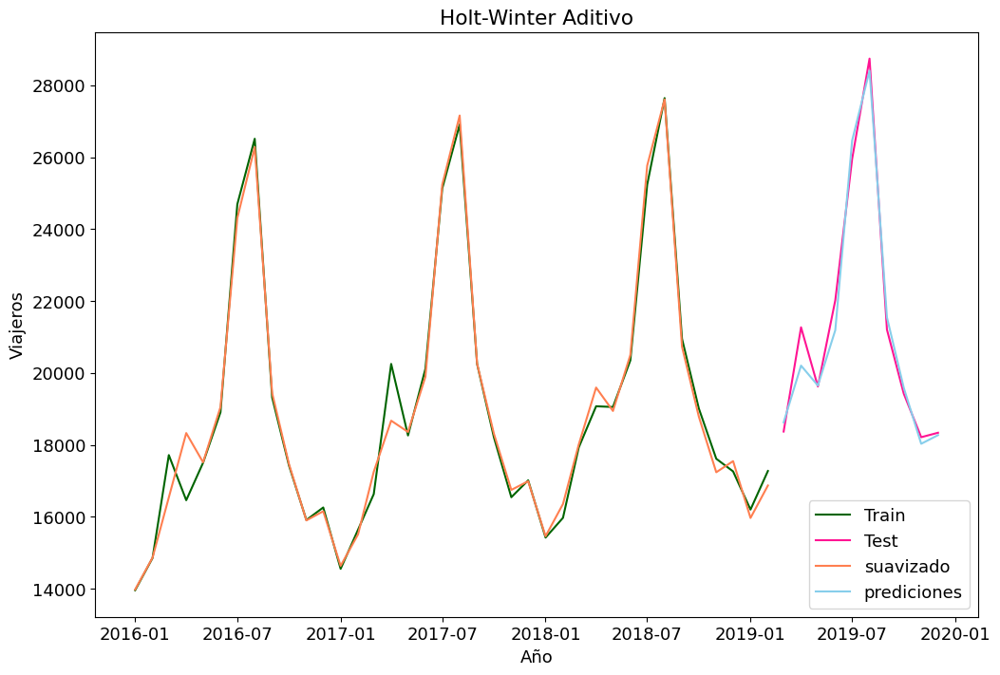

In [470]:
# Aplicar todo tipo de suavizados
model1 = ExponentialSmoothing(train['Intensidad media diaria de vehículos'].to_numpy(), seasonal_periods=12,trend="add",
seasonal="add", initialization_method="estimated").fit()
fcast = model1.forecast(10)
fcast=pd.Series(list(fcast), index= list(test['FECHA']))
predicciones=model1.fittedvalues
predicciones= pd.Series(list(predicciones), index= list(train['FECHA']))
plt.figure(figsize=(12, 8))
# Series
plt.plot(train['FECHA'], train['Intensidad media diaria de vehículos'], label='Train', color='DarkGreen')
plt.plot(test['FECHA'], test['Intensidad media diaria de vehículos'], label='Test', color='DeepPink')
plt.plot(predicciones, label='suavizado', color='coral')
plt.plot(fcast,color='SkyBlue', label="prediciones")
plt.xlabel('Año')
plt.ylabel('Viajeros')
plt.title('Holt-Winter Aditivo')
plt.legend()
plt.show()

In [471]:
fcast #prediccion para 2019

2019-03-01    18625.377521
2019-04-01    20204.798905
2019-05-01    19650.207043
2019-06-01    21190.064916
2019-07-01    26461.508545
2019-08-01    28403.631869
2019-09-01    21546.355158
2019-10-01    19585.911327
2019-11-01    18031.018059
2019-12-01    18271.570450
dtype: float64

In [472]:
promedio_diario[promedio_diario['Año'] == '2019'] #valores reales ed 2019

,Año,Periodo,Intensidad media diaria de vehículos,FECHA
48,2019,Enero,16202,2019-01-01
49,2019,Febrero,17275,2019-02-01
50,2019,Marzo,18371,2019-03-01
51,2019,Abril,21270,2019-04-01
52,2019,Mayo,19623,2019-05-01
53,2019,Junio,22022,2019-06-01
54,2019,Julio,25950,2019-07-01
55,2019,Agosto,28740,2019-08-01
56,2019,Septiembre,21206,2019-09-01
57,2019,Octubre,19423,2019-10-01


Se puede ver que ha hecho una buena predicción con un error inferior al 10%, es decir, podrçia ser un buen modelo.

### ARIMA

Para poder llevar a cabo este modelo adecuadamente, necesitamos hacer el análisis de los correlogramas

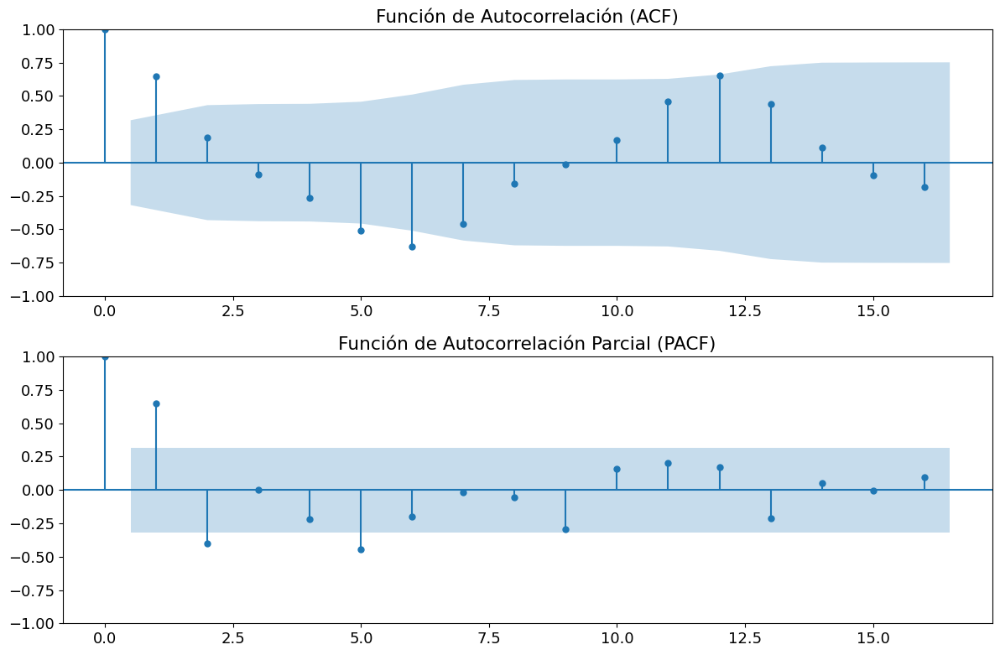

In [473]:
# Crear subgráficos para ACF y PACF
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))
# Graficar la función de autocorrelación (ACF)
plot_acf(train['Intensidad media diaria de vehículos'], ax=ax1)
ax1.set_title('Función de Autocorrelación (ACF)')
# Graficar la función de autocorrelación parcial (PACF)
plot_pacf(train['Intensidad media diaria de vehículos'], ax=ax2)
ax2.set_title('Función de Autocorrelación Parcial (PACF)')
# Ajustar el diseño para evitar solapamientos
plt.tight_layout()
# Mostrar los subgráficos
plt.show()

Se puede ver perfectamente que la serie es estacional. Este conjunto de datos en particular es relativamente sencillo de observar, ya que, solo son 48 datos. Sin embargo, en el caso de las provincias, el número es mucho mayor, por lo que será más complicado verlo a ojo. Por lo tanto, se puede hacer también el uso de serie en diferencias, es decir, sacar la derivada y ver si hay o no un cambio entre uno y el otro.

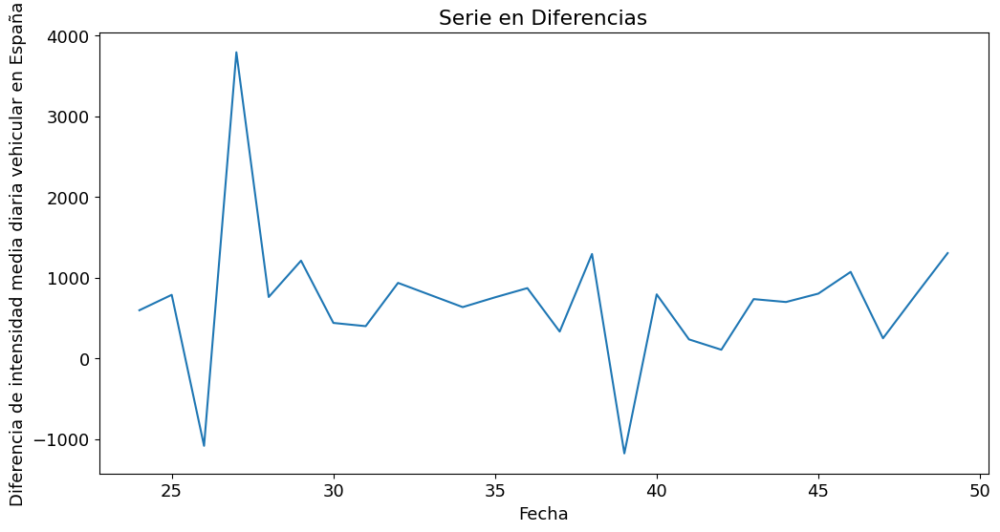

In [474]:
diferencias = train['Intensidad media diaria de vehículos'].diff(12)
plt.figure(figsize=(12, 6))
plt.plot(diferencias)
plt.title('Serie en Diferencias')
plt.xlabel('Fecha')
plt.ylabel('Diferencia de intensidad media diaria vehicular en España')
plt.show()

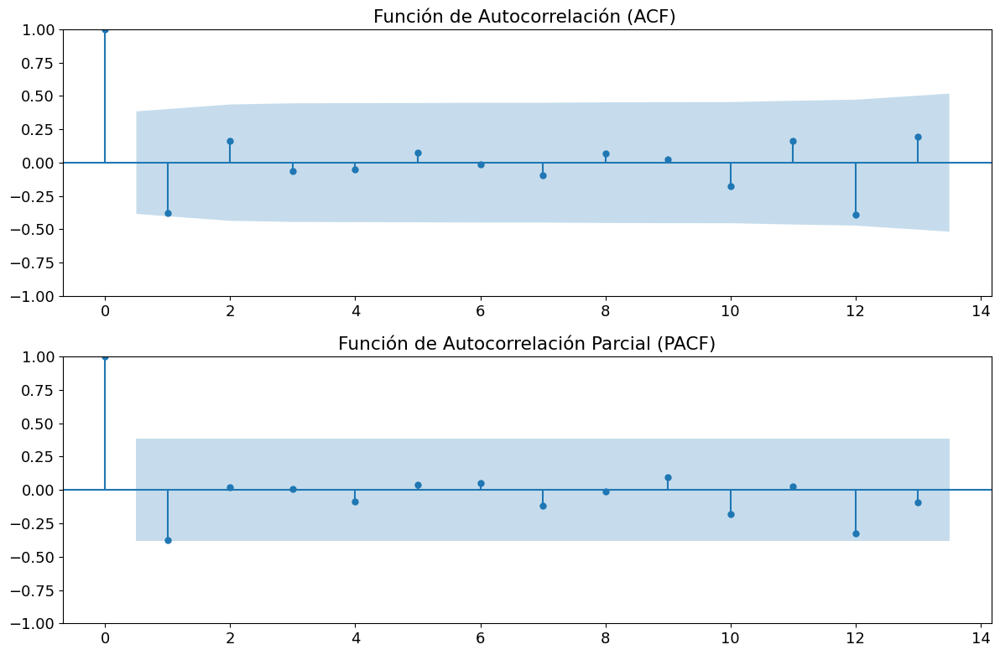

In [475]:
diferencias = diferencias.dropna()
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))
plot_acf(diferencias, ax=ax1)
ax1.set_title('Función de Autocorrelación (ACF) ')
plot_pacf(diferencias, ax=ax2)
ax2.set_title('Función de Autocorrelación Parcial (PACF)')
plt.tight_layout()
plt.show()

In [476]:
modelo_auto= pm.auto_arima(train['Intensidad media diaria de vehículos'], start_p=1, start_q=1, max_p=3, max_q=3,
m=12, start_P=0, seasonal=True, d=0, D=1, trace=True, error_action='ignore',
suppress_warnings=True, stepwise=True) # mostramos los modelos probados

Performing stepwise search to minimize aic
 ARIMA(1,0,1)(0,1,1)[12] intercept   : AIC=430.277, Time=0.52 sec
 ARIMA(0,0,0)(0,1,0)[12] intercept   : AIC=428.256, Time=0.01 sec
 ARIMA(1,0,0)(1,1,0)[12] intercept   : AIC=430.446, Time=0.29 sec
 ARIMA(0,0,1)(0,1,1)[12] intercept   : AIC=431.271, Time=0.26 sec
 ARIMA(0,0,0)(0,1,0)[12]             : AIC=439.686, Time=0.02 sec
 ARIMA(0,0,0)(1,1,0)[12] intercept   : AIC=430.252, Time=0.05 sec
 ARIMA(0,0,0)(0,1,1)[12] intercept   : AIC=430.251, Time=0.05 sec
 ARIMA(0,0,0)(1,1,1)[12] intercept   : AIC=432.239, Time=0.27 sec
 ARIMA(1,0,0)(0,1,0)[12] intercept   : AIC=428.573, Time=0.09 sec
 ARIMA(0,0,1)(0,1,0)[12] intercept   : AIC=429.045, Time=0.15 sec
 ARIMA(1,0,1)(0,1,0)[12] intercept   : AIC=428.165, Time=0.25 sec
 ARIMA(1,0,1)(1,1,0)[12] intercept   : AIC=430.237, Time=0.48 sec
 ARIMA(1,0,1)(1,1,1)[12] intercept   : AIC=inf, Time=0.74 sec
 ARIMA(2,0,1)(0,1,0)[12] intercept   : AIC=430.152, Time=0.17 sec
 ARIMA(1,0,2)(0,1,0)[12] intercept   

In [477]:
print(modelo_auto.summary())

                                      SARIMAX Results                                      
Dep. Variable:                                   y   No. Observations:                   38
Model:             SARIMAX(1, 0, 1)x(0, 1, [], 12)   Log Likelihood                -210.082
Date:                             Sat, 13 Apr 2024   AIC                            428.165
Time:                                     00:12:52   BIC                            433.197
Sample:                                          0   HQIC                           429.614
                                              - 38                                         
Covariance Type:                               opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept   1284.2352    339.554      3.782      0.000     618.721    1949.749
ar.L1         -0.8004      

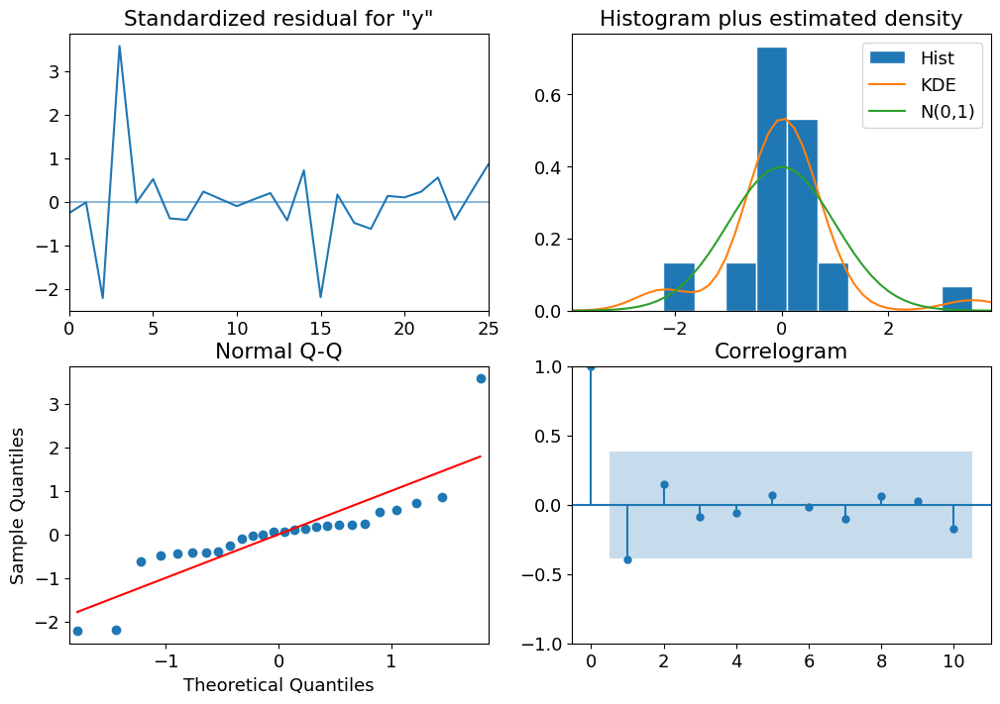

In [478]:
best_arima = sm.tsa.ARIMA(train['Intensidad media diaria de vehículos'].to_numpy().astype(int), order=(1, 0, 1), seasonal_order=(0, 1, 0, 12))
resultados_a = best_arima.fit()
# Graficar los residuos del modelo
resultados_a.plot_diagnostics(figsize=(12, 8))
plt.show()

Como se puede observar, los residuales no estan correlacionados, ya que no se ve un patrón en la primera gráfica. Además, estos siguen una distribución normal.

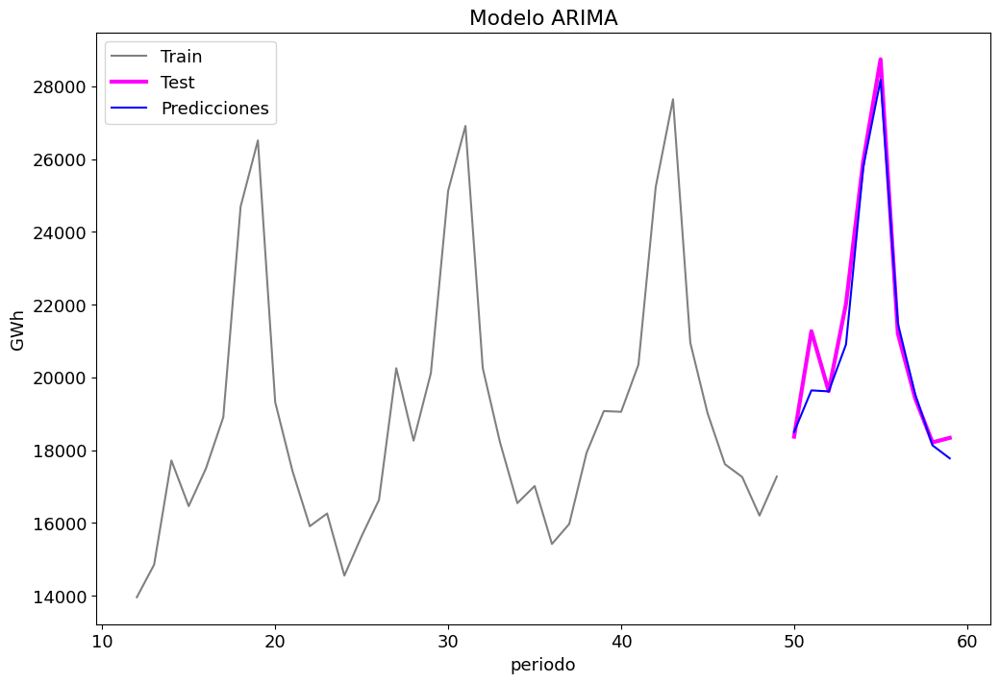

In [479]:
prediciones_a = resultados_a.get_forecast(steps=10)
pred_test_a=prediciones_a.predicted_mean
intervalos_confianza_a = prediciones_a.conf_int()
pred_test_a= pd.Series(list(pred_test_a), index= list(test['Intensidad media diaria de vehículos'].index))
plt.figure(figsize=(12, 8))
plt.plot(train['Intensidad media diaria de vehículos'], label='Train', color='gray')
plt.plot(test['Intensidad media diaria de vehículos'], label='Test', color='Magenta', linewidth = 3)
plt.plot(pred_test_a, label='Predicciones', color='blue')
plt.xlabel('periodo')
plt.ylabel('GWh')
plt.title('Modelo ARIMA')
plt.legend()
plt.show()

In [480]:
pred_test_a

50    18501.322321
51    19642.743127
52    19615.263607
53    20903.882450
54    25781.598362
55    28181.410067
56    21483.316305
57    19536.315833
58    18133.407423
59    17774.589866
dtype: float64

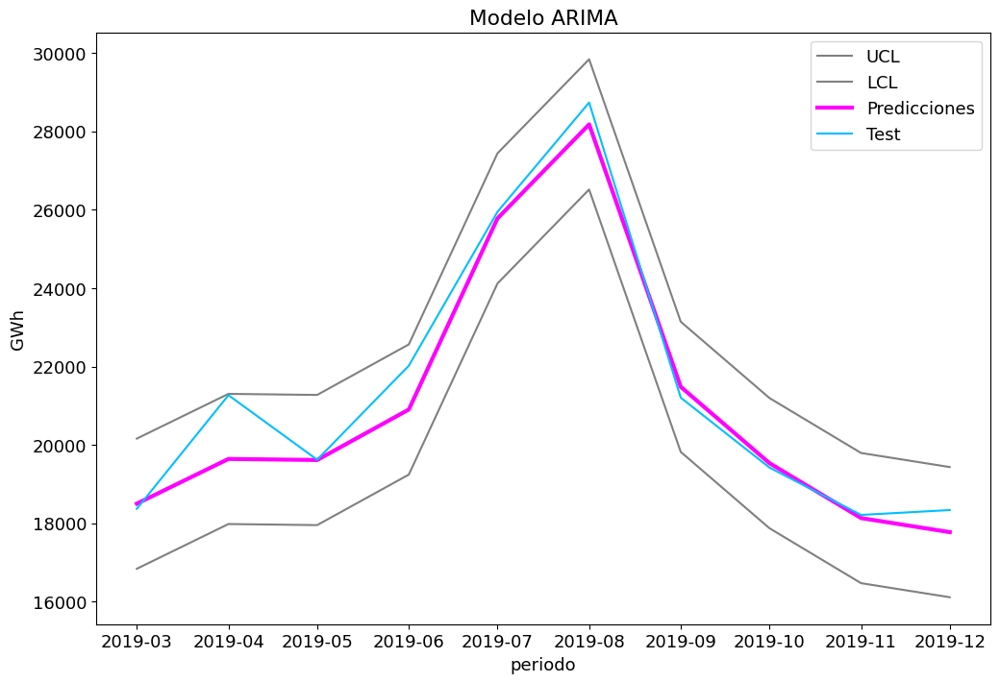

<Figure size 1200x800 with 0 Axes>

<Figure size 1200x800 with 0 Axes>

In [481]:
plt.figure(figsize=(12, 8))
# Serie original
intervalos_confianza_low= pd.Series(list(intervalos_confianza_a[:,0]), index= list(test['FECHA']))
intervalos_confianza_upper= pd.Series(list(intervalos_confianza_a[:,1]), index= list(test['FECHA']))
plt.plot(intervalos_confianza_low, label='UCL', color='gray')
plt.plot(intervalos_confianza_upper, label='LCL', color='gray')
plt.plot(test['FECHA'], pred_test_a, label='Predicciones', color='Magenta', linewidth = 3)
plt.plot(test['FECHA'], test['Intensidad media diaria de vehículos'], label='Test', color='DeepSkyBlue')
plt.xlabel('periodo')
plt.ylabel('GWh')
plt.title('Modelo ARIMA')
plt.legend()
plt.show()
plt.figure(figsize=(12, 8))

In [482]:
test

,Año,Periodo,Intensidad media diaria de vehículos,FECHA
50,2019,Marzo,18371,2019-03-01
51,2019,Abril,21270,2019-04-01
52,2019,Mayo,19623,2019-05-01
53,2019,Junio,22022,2019-06-01
54,2019,Julio,25950,2019-07-01
55,2019,Agosto,28740,2019-08-01
56,2019,Septiembre,21206,2019-09-01
57,2019,Octubre,19423,2019-10-01
58,2019,Noviembre,18214,2019-11-01
59,2019,Diciembre,18338,2019-12-01


In [483]:
pred_test_a

50    18501.322321
51    19642.743127
52    19615.263607
53    20903.882450
54    25781.598362
55    28181.410067
56    21483.316305
57    19536.315833
58    18133.407423
59    17774.589866
dtype: float64

Como se puede ver, los resultados se acercan bastante pero no al 100%.

### PROPHET

In [484]:
promedio_diario['y'] = promedio_diario['Intensidad media diaria de vehículos']
promedio_diario['ds'] = pd.to_datetime(pd.to_datetime(promedio_diario['FECHA']).dt.date)

00:46:41 - cmdstanpy - INFO - Chain [1] start processing


00:46:42 - cmdstanpy - INFO - Chain [1] done processing
c:\Users\---\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:72: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
c:\Users\---\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:73: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  ax.plot(m.history['ds'].dt.to_pydatetime(), m.history['y'], 'k.',


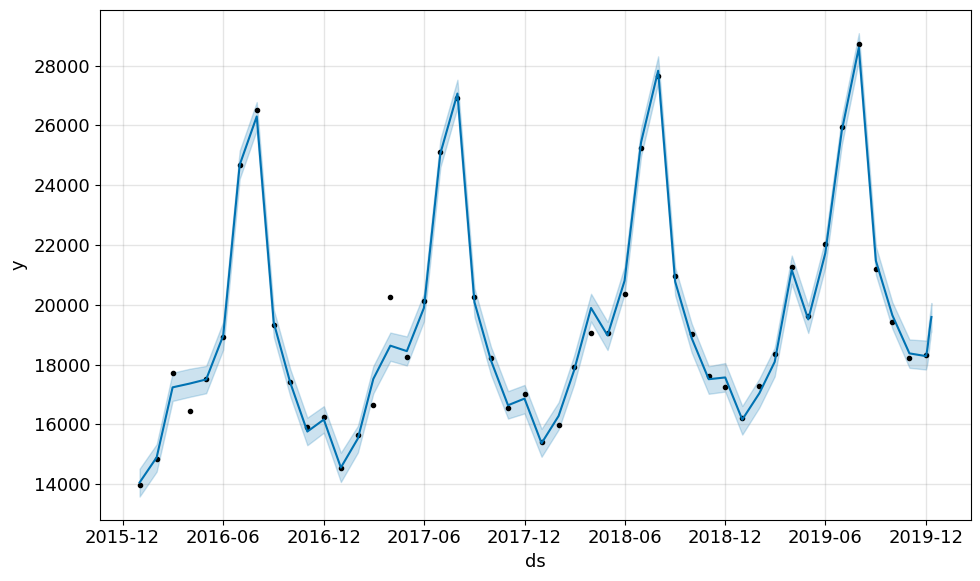

In [486]:
ts = promedio_diario[['ds', 'y']]
model = Prophet(
   yearly_seasonality=True,
   seasonality_mode=['additive','multiplicative'][0]
   ).add_country_holidays(country_name='ESP'
   ).fit(ts)

future = model.make_future_dataframe(periods=10)
forecast = model.predict(future)
fig1 = model.plot(forecast)

c:\Users\---\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:228: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  fcst_t = fcst['ds'].dt.to_pydatetime()
c:\Users\---\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:351: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing python datetime objects instead of an ndarray. To retain the old behavior, call `np.array` on the result
  df_y['ds'].dt.to_pydatetime(), seas[name], ls='-', c='#0072B2')
c:\Users\---\AppData\Local\Programs\Python\Python312\Lib\site-packages\prophet\plot.py:354: FutureWarning: The behavior of DatetimeProperties.to_pydatetime is deprecated, in a future version this will return a Series containing

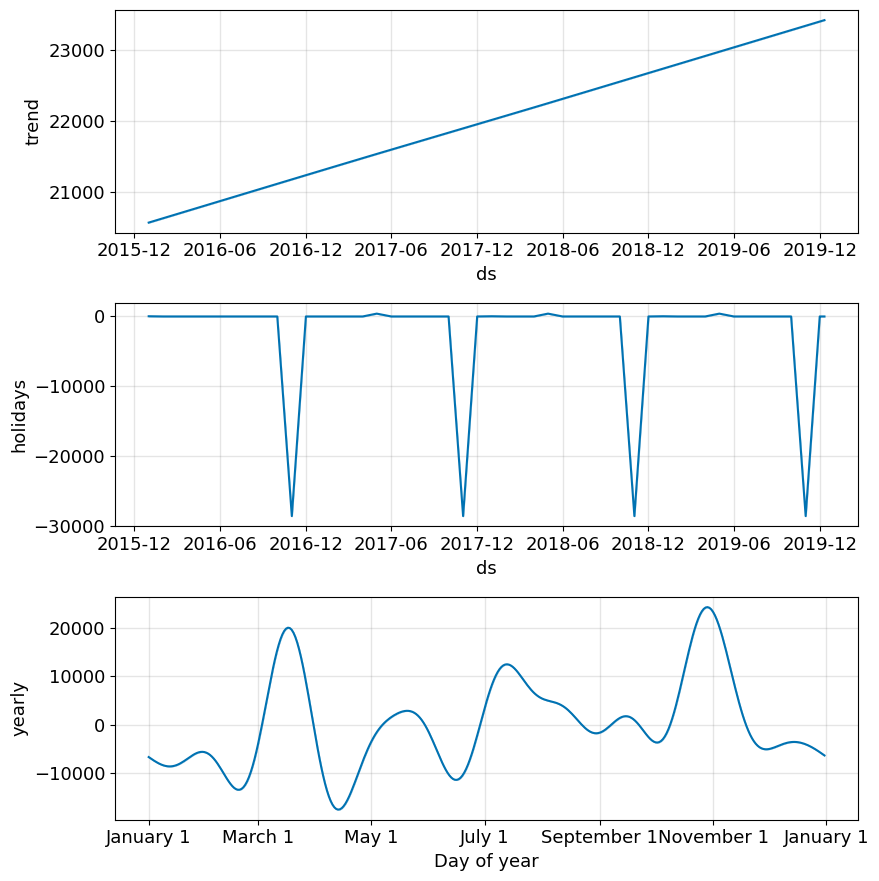

In [487]:
fig2 = model.plot_components(forecast)

La diferencia entre prophet y los modelos anteriores no es marcada en este casom ya que, a ojo podemos haver un apálisis Este se notará más adelantw con el número de víctimas. Este es un extra que podemos ver con prophet.

### MODELO DE REDES NEURONALES

num_train_samples = int(0.5 * len(raw_data))
num_val_samples = int(0.25 * len(raw_data))
num_test_samples = len(raw_data) - num_train_samples - num_val_samples

In [ ]:
mean = raw_data[:num_train_samples].mean(axis=0)
raw_data -= mean
std = raw_data[:num_train_samples].std(axis=0)
raw_data /= std

## PREDICCIÓN PROVINCIA 1

In [489]:
db_provincia1

,ANYO,MES,DIA_SEMANA,HORA,COD_PROVINCIA,COD_MUNICIPIO,ISLA,ZONA,ZONA_AGRUPADA,CARRETERA,...,PRIORI_OTRA,CONDICION_NIVEL_CIRCULA,CONDICION_FIRME,CONDICION_ILUMINACION,CONDICION_METEO,CONDICION_NIEBLA,CONDICION_VIENTO,VISIB_RESTRINGIDA_POR,ACERA,TRAZADO_PLANTA
0,2016,3,4,16,1,1059.0,NaN,3,2,No inventariada,...,999,6,9,1,7,NaN,NaN,18,998,998
1,2016,3,4,14,1,1059.0,NaN,3,2,No inventariada,...,999,6,9,1,7,NaN,NaN,18,999,998
2,2016,3,4,7,1,1059.0,NaN,3,2,No inventariada,...,999,6,9,4,7,NaN,NaN,18,998,998
3,2016,3,3,18,1,1059.0,NaN,3,2,No inventariada,...,1,6,9,1,7,NaN,NaN,18,998,998
4,2016,3,2,20,1,1059.0,NaN,3,2,No inventariada,...,1,6,9,4,7,NaN,NaN,18,998,998
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
411818,2020,1,3,15,1,1059.0,NaN,3,2,No inventariada,...,1,1,1,1,1,NaN,NaN,18,998,998
411819,2020,1,3,18,1,1059.0,NaN,3,2,No inventariada,...,1,1,1,4,1,NaN,NaN,18,998,998
411820,2020,1,3,20,1,1059.0,NaN,3,2,No inventariada,...,1,1,1,4,1,NaN,NaN,18,998,998
411821,2020,3,7,9,1,1059.0,NaN,3,2,No inventariada,...,999,1,1,1,1,NaN,NaN,18,998,998
